In [2]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Topic Probability Assignment

In [ ]:
# This get the RAPIDS-Colab install files and test check your GPU.  Run this and the next cell only.
# Please read the output of this cell.  If your Colab Instance is not RAPIDS compatible, it will warn you and give you remediation steps.
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!python rapidsai-csp-utils/colab/pip-install.py

fatal: destination path 'rapidsai-csp-utils' already exists and is not an empty directory.
Installing RAPIDS remaining 25.02 libraries
Using Python 3.11.11 environment at: /usr
Audited 11 packages in 87ms

        ***********************************************************************
        The pip install of RAPIDS is complete.

        Please do not run any further installation from the conda based installation methods, as they may cause issues!

        Please ensure that you're pulling from the git repo to remain updated with the latest working install scripts.

        Troubleshooting:
            - If there is an installation failure, please check back on RAPIDSAI owned templates/notebooks to see how to update your personal files.
            - If an installation failure persists when using the latest script, please make an issue on https://github.com/rapidsai-community/rapidsai-csp-utils
        ***********************************************************************
        


In [ ]:
## After restarting, install remaining necessary libraries
# Run this cell after restarting the runtime
!pip install bertopic==0.16.3
!pip install octis
!pip install sentence-transformers
!pip install umap-learn==0.5.3  # Specify a compatible version
!pip install hdbscan
!pip install tqdm
!pip install pandas
!pip install gensim
!pip install wandb
!pip install umap
!pip install scipy
!pip install nltk

  Using cached bertopic-0.16.3-py3-none-any.whl.metadata (23 kB)
Using cached bertopic-0.16.3-py3-none-any.whl (143 kB)
  Attempting uninstall: bertopic
    Found existing installation: bertopic 0.17.0
    Uninstalling bertopic-0.17.0:
      Successfully uninstalled bertopic-0.17.0


  Using cached octis-1.14.0-py2.py3-none-any.whl.metadata (27 kB)
  Using cached scikit-learn-1.1.0.tar.gz (6.8 MB)
  Installing build dependencies ... canceled
ERROR: Operation cancelled by user
^C
^C
^C
^C


In [ ]:
!pip list | grep umap
!pip uninstall -y umap
!find . -type d -name "__pycache__" -exec rm -r {} +
!pip install --upgrade bertopic umap-learn

umap-learn                         0.5.7


In [ ]:
from bertopic import BERTopic

In [ ]:
# =====================================
# 1. Import Libraries
# =====================================

import os
import time
import logging
import pandas as pd
import numpy as np
import re
from datetime import datetime
import torch
import gc
from tqdm import tqdm
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer

# Import RAPIDS' UMAP and HDBSCAN
from cuml.manifold import UMAP  # GPU-accelerated UMAP
from cuml.cluster import HDBSCAN  # GPU-accelerated HDBSCAN
import cupy as cp  # For GPU arrays

# Import NLTK modules for text processing
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Import BERTopic's representation models
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, PartOfSpeech

# Import json module
import json

# Import string module for punctuation handling
import string

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
import pandas as pd
from bertopic import BERTopic
import time
from datetime import datetime
import numpy as np

def print_with_time(message):
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# Start the overall timer
start_time = time.time()

print_with_time("Starting the process...")

# Step 1: Load Your Processed Dataset
dataset_path = '/content/drive/MyDrive/fanfiction_project_data_and_models/processed_novels_sentences_new.csv'

print_with_time(f"Loading dataset from: {dataset_path}")
df_sentences = pd.read_csv(dataset_path)
print_with_time("Dataset loaded successfully. Preview:")
print(df_sentences.head())
data_load_time = time.time()
print_with_time(f"Dataset loaded in {data_load_time - start_time:.2f} seconds.")

# Step 2: Load the Trained BERTopic Model
model_path = '/content/drive/MyDrive/BERTTopic_Models_POS/paraphrase-mpnet-base-v2_Model_1_POS_a/bertopic_model_iter_1_paraphrase-mpnet-base-v2_POS_a.pkl'

print_with_time(f"Loading BERTopic model from: {model_path}")
model_load_start = time.time()
topic_model = BERTopic.load(model_path)
model_load_end = time.time()
print_with_time(f"BERTopic model loaded successfully in {model_load_end - model_load_start:.2f} seconds.")

# Step 3: Prepare the Sentences for Topic Distribution Approximation
print_with_time("Preparing sentences for topic distribution approximation.")
documents = df_sentences['Sentence'].tolist()
print_with_time(f"Total number of sentences to process: {len(documents)}")

# Step 4: Use `approximate_distribution` with Adjusted Parameters
print_with_time("Starting topic distribution approximation using `approximate_distribution`.")
approx_start_time = time.time()
topic_distributions, _ = topic_model.approximate_distribution(
    documents=documents,
    window=4,
    stride=1,
    min_similarity=0.1,
    batch_size=1000,
    padding=False,
    use_embedding_model=True,
    calculate_tokens=False,
    separator=' '
)
approx_end_time = time.time()
print_with_time(f"Topic distribution approximation completed in {approx_end_time - approx_start_time:.2f} seconds.")

# Step 5: Convert Topic Distributions to DataFrame
print_with_time("Converting topic distributions to a DataFrame.")

# Get the actual topic IDs, excluding -1
topic_freq = topic_model.get_topic_freq()
topic_ids = sorted(topic_freq[topic_freq.Topic != -1].Topic.values)

# Convert the topic distributions to a DataFrame
topic_probs_df = pd.DataFrame(
    topic_distributions,
    columns=[f'Topic_{t}' for t in topic_ids]
)

# Ensure the DataFrame has the correct number of columns
assert topic_probs_df.shape[1] == len(topic_ids), "Mismatch in number of topics."
assert topic_probs_df.shape[0] == df_sentences.shape[0], "Mismatch in number of sentences."

print_with_time("Topic distributions converted to DataFrame successfully.")

# Step 5.1: Assign the Most Probable Topic to Each Sentence
print_with_time("Assigning the most probable topic to each sentence.")

# Assign the most probable topic to each sentence
df_sentences['Assigned_Topic'] = topic_probs_df.idxmax(axis=1).apply(lambda x: int(x.split('_')[1]))

# Step 6: Combine Topic Probabilities with Original Data
print_with_time("Combining topic probabilities with the original dataset.")

# Combine the original DataFrame, assigned topics, and topic probabilities
df_combined = pd.concat([df_sentences.reset_index(drop=True), topic_probs_df], axis=1)

print_with_time("Data combined successfully. Preview of combined DataFrame:")
print(df_combined.head())

# Step 7: Save the Combined DataFrame for Further Analysis
output_path = '/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv'
print_with_time(f"Saving the combined DataFrame to: {output_path}")
df_combined.to_csv(output_path, index=False)
print_with_time("Combined DataFrame saved successfully.")

# Step 8: Extract Topic Representations
print_with_time("Extracting topic representations.")

topic_numbers = []
topic_representations = []

# Loop through actual topic IDs
for topic_num in topic_ids:
    words_and_scores = topic_model.get_topic(topic_num)
    if words_and_scores:
        words = [word for word, score in words_and_scores]
        topic_representation = ' | '.join(words)
    else:
        topic_representation = ''
    topic_numbers.append(topic_num)
    topic_representations.append(topic_representation)

print_with_time(f"Extracted representations for {len(topic_numbers)} topics.")

# Create DataFrame with the topics
df_topics = pd.DataFrame({
    'Topic_Number': topic_numbers,
    'Topic_Representation': topic_representations
})

print_with_time("Created DataFrame with topic representations.")
print(df_topics.head())

# Save the topics DataFrame to CSV
output_path_topics = '/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv'
print_with_time(f"Saving topic representations to: {output_path_topics}")
df_topics.to_csv(output_path_topics, index=False)
print_with_time("Topic representations saved successfully.")

# End the overall timer
end_time = time.time()
total_time = end_time - start_time
print_with_time(f"Process completed in {total_time:.2f} seconds.")


2025-03-20 00:12:53 - Starting the process...
2025-03-20 00:12:53 - Loading dataset from: /content/drive/MyDrive/fanfiction_project_data_and_models/processed_novels_sentences_new.csv
2025-03-20 00:12:54 - Dataset loaded successfully. Preview:
   id                                           Sentence source_type  \
0   1  My dear Watson,\r\n\r\nI do not know why I am ...  fanfiction   
1   2                   You know that I am no wordsmith.  fanfiction   
2   3  The process of turning fact into fanciful embe...  fanfiction   
3   4  Perhaps more significantly, there is little po...  fanfiction   
4   5               It is a simple matter of arithmetic.  fanfiction   

  title_fandom               file_name  
0  Sherlock FF  sherlock_fics_full.txt  
1  Sherlock FF  sherlock_fics_full.txt  
2  Sherlock FF  sherlock_fics_full.txt  
3  Sherlock FF  sherlock_fics_full.txt  
4  Sherlock FF  sherlock_fics_full.txt  
2025-03-20 00:12:54 - Dataset loaded in 0.77 seconds.
2025-03-20 00:12:54 - Lo

Batches:   0%|          | 0/337 [00:00<?, ?it/s]

Batches:   0%|          | 0/291 [00:00<?, ?it/s]

Batches:   0%|          | 0/247 [00:00<?, ?it/s]

Batches:   0%|          | 0/241 [00:00<?, ?it/s]

Batches:   0%|          | 0/297 [00:00<?, ?it/s]

Batches:   0%|          | 0/264 [00:00<?, ?it/s]

Batches:   0%|          | 0/283 [00:00<?, ?it/s]

Batches:   0%|          | 0/310 [00:00<?, ?it/s]

Batches:   0%|          | 0/293 [00:00<?, ?it/s]

Batches:   0%|          | 0/326 [00:00<?, ?it/s]

Batches:   0%|          | 0/522 [00:00<?, ?it/s]

Batches:   0%|          | 0/276 [00:00<?, ?it/s]

Batches:   0%|          | 0/247 [00:00<?, ?it/s]

Batches:   0%|          | 0/355 [00:00<?, ?it/s]

Batches:   0%|          | 0/456 [00:00<?, ?it/s]

Batches:   0%|          | 0/475 [00:00<?, ?it/s]

Batches:   0%|          | 0/397 [00:00<?, ?it/s]

Batches:   0%|          | 0/307 [00:00<?, ?it/s]

Batches:   0%|          | 0/270 [00:00<?, ?it/s]

Batches:   0%|          | 0/350 [00:00<?, ?it/s]

Batches:   0%|          | 0/307 [00:00<?, ?it/s]

Batches:   0%|          | 0/389 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Batches:   0%|          | 0/302 [00:00<?, ?it/s]

Batches:   0%|          | 0/303 [00:00<?, ?it/s]

Batches:   0%|          | 0/242 [00:00<?, ?it/s]

Batches:   0%|          | 0/286 [00:00<?, ?it/s]

Batches:   0%|          | 0/255 [00:00<?, ?it/s]

Batches:   0%|          | 0/217 [00:00<?, ?it/s]

Batches:   0%|          | 0/206 [00:00<?, ?it/s]

Batches:   0%|          | 0/197 [00:00<?, ?it/s]

Batches:   0%|          | 0/216 [00:00<?, ?it/s]

Batches:   0%|          | 0/244 [00:00<?, ?it/s]

Batches:   0%|          | 0/233 [00:00<?, ?it/s]

Batches:   0%|          | 0/307 [00:00<?, ?it/s]

Batches:   0%|          | 0/335 [00:00<?, ?it/s]

Batches:   0%|          | 0/394 [00:00<?, ?it/s]

Batches:   0%|          | 0/423 [00:00<?, ?it/s]

Batches:   0%|          | 0/295 [00:00<?, ?it/s]

Batches:   0%|          | 0/297 [00:00<?, ?it/s]

Batches:   0%|          | 0/287 [00:00<?, ?it/s]

Batches:   0%|          | 0/301 [00:00<?, ?it/s]

Batches:   0%|          | 0/251 [00:00<?, ?it/s]

Batches:   0%|          | 0/359 [00:00<?, ?it/s]

Batches:   0%|          | 0/258 [00:00<?, ?it/s]

Batches:   0%|          | 0/258 [00:00<?, ?it/s]

Batches:   0%|          | 0/333 [00:00<?, ?it/s]

Batches:   0%|          | 0/464 [00:00<?, ?it/s]

Batches:   0%|          | 0/453 [00:00<?, ?it/s]

Batches:   0%|          | 0/419 [00:00<?, ?it/s]

Batches:   0%|          | 0/432 [00:00<?, ?it/s]

Batches:   0%|          | 0/440 [00:00<?, ?it/s]

Batches:   0%|          | 0/534 [00:00<?, ?it/s]

Batches:   0%|          | 0/666 [00:00<?, ?it/s]

Batches:   0%|          | 0/638 [00:00<?, ?it/s]

Batches:   0%|          | 0/640 [00:00<?, ?it/s]

Batches:   0%|          | 0/546 [00:00<?, ?it/s]

Batches:   0%|          | 0/503 [00:00<?, ?it/s]

Batches:   0%|          | 0/346 [00:00<?, ?it/s]

Batches:   0%|          | 0/347 [00:00<?, ?it/s]

Batches:   0%|          | 0/348 [00:00<?, ?it/s]

Batches:   0%|          | 0/398 [00:00<?, ?it/s]

Batches:   0%|          | 0/374 [00:00<?, ?it/s]

Batches:   0%|          | 0/445 [00:00<?, ?it/s]

Batches:   0%|          | 0/475 [00:00<?, ?it/s]

Batches:   0%|          | 0/412 [00:00<?, ?it/s]

Batches:   0%|          | 0/361 [00:00<?, ?it/s]

Batches:   0%|          | 0/303 [00:00<?, ?it/s]

Batches:   0%|          | 0/393 [00:00<?, ?it/s]

Batches:   0%|          | 0/294 [00:00<?, ?it/s]

Batches:   0%|          | 0/407 [00:00<?, ?it/s]

Batches:   0%|          | 0/259 [00:00<?, ?it/s]

Batches:   0%|          | 0/304 [00:00<?, ?it/s]

Batches:   0%|          | 0/413 [00:00<?, ?it/s]

Batches:   0%|          | 0/442 [00:00<?, ?it/s]

Batches:   0%|          | 0/251 [00:00<?, ?it/s]

Batches:   0%|          | 0/276 [00:00<?, ?it/s]

Batches:   0%|          | 0/229 [00:00<?, ?it/s]

Batches:   0%|          | 0/258 [00:00<?, ?it/s]

Batches:   0%|          | 0/544 [00:00<?, ?it/s]

Batches:   0%|          | 0/461 [00:00<?, ?it/s]

Batches:   0%|          | 0/311 [00:00<?, ?it/s]

Batches:   0%|          | 0/239 [00:00<?, ?it/s]

Batches:   0%|          | 0/345 [00:00<?, ?it/s]

Batches:   0%|          | 0/437 [00:00<?, ?it/s]

Batches:   0%|          | 0/390 [00:00<?, ?it/s]

Batches:   0%|          | 0/248 [00:00<?, ?it/s]

Batches:   0%|          | 0/218 [00:00<?, ?it/s]

Batches:   0%|          | 0/235 [00:00<?, ?it/s]

Batches:   0%|          | 0/274 [00:00<?, ?it/s]

Batches:   0%|          | 0/254 [00:00<?, ?it/s]

Batches:   0%|          | 0/307 [00:00<?, ?it/s]

Batches:   0%|          | 0/305 [00:00<?, ?it/s]

Batches:   0%|          | 0/331 [00:00<?, ?it/s]

Batches:   0%|          | 0/317 [00:00<?, ?it/s]

Batches:   0%|          | 0/475 [00:00<?, ?it/s]

Batches:   0%|          | 0/503 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Batches:   0%|          | 0/272 [00:00<?, ?it/s]

Batches:   0%|          | 0/226 [00:00<?, ?it/s]

Batches:   0%|          | 0/226 [00:00<?, ?it/s]

Batches:   0%|          | 0/232 [00:00<?, ?it/s]

Batches:   0%|          | 0/130 [00:00<?, ?it/s]

Batches:   0%|          | 0/195 [00:00<?, ?it/s]

Batches:   0%|          | 0/298 [00:00<?, ?it/s]

Batches:   0%|          | 0/389 [00:00<?, ?it/s]

Batches:   0%|          | 0/341 [00:00<?, ?it/s]

Batches:   0%|          | 0/321 [00:00<?, ?it/s]

Batches:   0%|          | 0/339 [00:00<?, ?it/s]

Batches:   0%|          | 0/374 [00:00<?, ?it/s]

Batches:   0%|          | 0/338 [00:00<?, ?it/s]

Batches:   0%|          | 0/301 [00:00<?, ?it/s]

Batches:   0%|          | 0/384 [00:00<?, ?it/s]

Batches:   0%|          | 0/388 [00:00<?, ?it/s]

Batches:   0%|          | 0/246 [00:00<?, ?it/s]

Batches:   0%|          | 0/234 [00:00<?, ?it/s]

Batches:   0%|          | 0/270 [00:00<?, ?it/s]

Batches:   0%|          | 0/467 [00:00<?, ?it/s]

Batches:   0%|          | 0/364 [00:00<?, ?it/s]

Batches:   0%|          | 0/351 [00:00<?, ?it/s]

Batches:   0%|          | 0/249 [00:00<?, ?it/s]

Batches:   0%|          | 0/408 [00:00<?, ?it/s]

Batches:   0%|          | 0/386 [00:00<?, ?it/s]

Batches:   0%|          | 0/442 [00:00<?, ?it/s]

Batches:   0%|          | 0/216 [00:00<?, ?it/s]

Batches:   0%|          | 0/261 [00:00<?, ?it/s]

Batches:   0%|          | 0/337 [00:00<?, ?it/s]

Batches:   0%|          | 0/267 [00:00<?, ?it/s]

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

Batches:   0%|          | 0/518 [00:00<?, ?it/s]

Batches:   0%|          | 0/385 [00:00<?, ?it/s]

Batches:   0%|          | 0/335 [00:00<?, ?it/s]

Batches:   0%|          | 0/312 [00:00<?, ?it/s]

Batches:   0%|          | 0/308 [00:00<?, ?it/s]

Batches:   0%|          | 0/255 [00:00<?, ?it/s]

Batches:   0%|          | 0/184 [00:00<?, ?it/s]

Batches:   0%|          | 0/336 [00:00<?, ?it/s]

Batches:   0%|          | 0/277 [00:00<?, ?it/s]

Batches:   0%|          | 0/241 [00:00<?, ?it/s]

Batches:   0%|          | 0/223 [00:00<?, ?it/s]

Batches:   0%|          | 0/284 [00:00<?, ?it/s]

Batches:   0%|          | 0/220 [00:00<?, ?it/s]

Batches:   0%|          | 0/211 [00:00<?, ?it/s]

Batches:   0%|          | 0/234 [00:00<?, ?it/s]

Batches:   0%|          | 0/259 [00:00<?, ?it/s]

Batches:   0%|          | 0/237 [00:00<?, ?it/s]

Batches:   0%|          | 0/272 [00:00<?, ?it/s]

Batches:   0%|          | 0/401 [00:00<?, ?it/s]

Batches:   0%|          | 0/265 [00:00<?, ?it/s]

Batches:   0%|          | 0/228 [00:00<?, ?it/s]

Batches:   0%|          | 0/289 [00:00<?, ?it/s]

Batches:   0%|          | 0/277 [00:00<?, ?it/s]

Batches:   0%|          | 0/250 [00:00<?, ?it/s]

Batches:   0%|          | 0/235 [00:00<?, ?it/s]

Batches:   0%|          | 0/230 [00:00<?, ?it/s]

Batches:   0%|          | 0/268 [00:00<?, ?it/s]

Batches:   0%|          | 0/228 [00:00<?, ?it/s]

Batches:   0%|          | 0/257 [00:00<?, ?it/s]

Batches:   0%|          | 0/303 [00:00<?, ?it/s]

Batches:   0%|          | 0/332 [00:00<?, ?it/s]

Batches:   0%|          | 0/324 [00:00<?, ?it/s]

Batches:   0%|          | 0/323 [00:00<?, ?it/s]

Batches:   0%|          | 0/166 [00:00<?, ?it/s]

Batches:   0%|          | 0/193 [00:00<?, ?it/s]

Batches:   0%|          | 0/176 [00:00<?, ?it/s]

Batches:   0%|          | 0/295 [00:00<?, ?it/s]

Batches:   0%|          | 0/412 [00:00<?, ?it/s]

Batches:   0%|          | 0/779 [00:00<?, ?it/s]

Batches:   0%|          | 0/871 [00:00<?, ?it/s]

Batches:   0%|          | 0/966 [00:00<?, ?it/s]

Batches:   0%|          | 0/941 [00:00<?, ?it/s]

Batches:   0%|          | 0/901 [00:00<?, ?it/s]

Batches:   0%|          | 0/652 [00:00<?, ?it/s]

Batches:   0%|          | 0/480 [00:00<?, ?it/s]

Batches:   0%|          | 0/435 [00:00<?, ?it/s]

Batches:   0%|          | 0/453 [00:00<?, ?it/s]

Batches:   0%|          | 0/467 [00:00<?, ?it/s]

Batches:   0%|          | 0/525 [00:00<?, ?it/s]

Batches:   0%|          | 0/476 [00:00<?, ?it/s]

Batches:   0%|          | 0/455 [00:00<?, ?it/s]

Batches:   0%|          | 0/471 [00:00<?, ?it/s]

Batches:   0%|          | 0/287 [00:00<?, ?it/s]

Batches:   0%|          | 0/365 [00:00<?, ?it/s]

Batches:   0%|          | 0/469 [00:00<?, ?it/s]

Batches:   0%|          | 0/360 [00:00<?, ?it/s]

Batches:   0%|          | 0/462 [00:00<?, ?it/s]

Batches:   0%|          | 0/278 [00:00<?, ?it/s]

Batches:   0%|          | 0/409 [00:00<?, ?it/s]

Batches:   0%|          | 0/361 [00:00<?, ?it/s]

Batches:   0%|          | 0/354 [00:00<?, ?it/s]

Batches:   0%|          | 0/349 [00:00<?, ?it/s]

Batches:   0%|          | 0/272 [00:00<?, ?it/s]

Batches:   0%|          | 0/223 [00:00<?, ?it/s]

Batches:   0%|          | 0/314 [00:00<?, ?it/s]

Batches:   0%|          | 0/351 [00:00<?, ?it/s]

Batches:   0%|          | 0/350 [00:00<?, ?it/s]

Batches:   0%|          | 0/356 [00:00<?, ?it/s]

Batches:   0%|          | 0/262 [00:00<?, ?it/s]

Batches:   0%|          | 0/375 [00:00<?, ?it/s]

Batches:   0%|          | 0/534 [00:00<?, ?it/s]

Batches:   0%|          | 0/289 [00:00<?, ?it/s]

Batches:   0%|          | 0/291 [00:00<?, ?it/s]

Batches:   0%|          | 0/334 [00:00<?, ?it/s]

Batches:   0%|          | 0/306 [00:00<?, ?it/s]

Batches:   0%|          | 0/301 [00:00<?, ?it/s]

Batches:   0%|          | 0/274 [00:00<?, ?it/s]

Batches:   0%|          | 0/274 [00:00<?, ?it/s]

Batches:   0%|          | 0/303 [00:00<?, ?it/s]

Batches:   0%|          | 0/309 [00:00<?, ?it/s]

Batches:   0%|          | 0/296 [00:00<?, ?it/s]

Batches:   0%|          | 0/281 [00:00<?, ?it/s]

Batches:   0%|          | 0/271 [00:00<?, ?it/s]

Batches:   0%|          | 0/303 [00:00<?, ?it/s]

Batches:   0%|          | 0/273 [00:00<?, ?it/s]

Batches:   0%|          | 0/273 [00:00<?, ?it/s]

Batches:   0%|          | 0/287 [00:00<?, ?it/s]

Batches:   0%|          | 0/307 [00:00<?, ?it/s]

Batches:   0%|          | 0/393 [00:00<?, ?it/s]

Batches:   0%|          | 0/302 [00:00<?, ?it/s]

Batches:   0%|          | 0/304 [00:00<?, ?it/s]

Batches:   0%|          | 0/340 [00:00<?, ?it/s]

Batches:   0%|          | 0/245 [00:00<?, ?it/s]

Batches:   0%|          | 0/212 [00:00<?, ?it/s]

Batches:   0%|          | 0/280 [00:00<?, ?it/s]

Batches:   0%|          | 0/255 [00:00<?, ?it/s]

Batches:   0%|          | 0/225 [00:00<?, ?it/s]

Batches:   0%|          | 0/229 [00:00<?, ?it/s]

Batches:   0%|          | 0/289 [00:00<?, ?it/s]

Batches:   0%|          | 0/362 [00:00<?, ?it/s]

Batches:   0%|          | 0/344 [00:00<?, ?it/s]

Batches:   0%|          | 0/327 [00:00<?, ?it/s]

Batches:   0%|          | 0/265 [00:00<?, ?it/s]

Batches:   0%|          | 0/321 [00:00<?, ?it/s]

Batches:   0%|          | 0/346 [00:00<?, ?it/s]

Batches:   0%|          | 0/432 [00:00<?, ?it/s]

Batches:   0%|          | 0/595 [00:00<?, ?it/s]

Batches:   0%|          | 0/478 [00:00<?, ?it/s]

Batches:   0%|          | 0/397 [00:00<?, ?it/s]

Batches:   0%|          | 0/281 [00:00<?, ?it/s]

Batches:   0%|          | 0/334 [00:00<?, ?it/s]

Batches:   0%|          | 0/284 [00:00<?, ?it/s]

Batches:   0%|          | 0/239 [00:00<?, ?it/s]

Batches:   0%|          | 0/223 [00:00<?, ?it/s]

Batches:   0%|          | 0/235 [00:00<?, ?it/s]

Batches:   0%|          | 0/208 [00:00<?, ?it/s]

Batches:   0%|          | 0/322 [00:00<?, ?it/s]

Batches:   0%|          | 0/337 [00:00<?, ?it/s]

Batches:   0%|          | 0/556 [00:00<?, ?it/s]

Batches:   0%|          | 0/285 [00:00<?, ?it/s]

Batches:   0%|          | 0/255 [00:00<?, ?it/s]

Batches:   0%|          | 0/266 [00:00<?, ?it/s]

Batches:   0%|          | 0/297 [00:00<?, ?it/s]

Batches:   0%|          | 0/208 [00:00<?, ?it/s]

Batches:   0%|          | 0/176 [00:00<?, ?it/s]

Batches:   0%|          | 0/318 [00:00<?, ?it/s]

Batches:   0%|          | 0/318 [00:00<?, ?it/s]

Batches:   0%|          | 0/489 [00:00<?, ?it/s]

Batches:   0%|          | 0/268 [00:00<?, ?it/s]

Batches:   0%|          | 0/429 [00:00<?, ?it/s]

Batches:   0%|          | 0/297 [00:00<?, ?it/s]

Batches:   0%|          | 0/259 [00:00<?, ?it/s]

Batches:   0%|          | 0/566 [00:00<?, ?it/s]

Batches:   0%|          | 0/312 [00:00<?, ?it/s]

Batches:   0%|          | 0/304 [00:00<?, ?it/s]

Batches:   0%|          | 0/259 [00:00<?, ?it/s]

Batches:   0%|          | 0/361 [00:00<?, ?it/s]

Batches:   0%|          | 0/358 [00:00<?, ?it/s]

Batches:   0%|          | 0/325 [00:00<?, ?it/s]

Batches:   0%|          | 0/468 [00:00<?, ?it/s]

Batches:   0%|          | 0/252 [00:00<?, ?it/s]

Batches:   0%|          | 0/206 [00:00<?, ?it/s]

Batches:   0%|          | 0/203 [00:00<?, ?it/s]

Batches:   0%|          | 0/262 [00:00<?, ?it/s]

Batches:   0%|          | 0/313 [00:00<?, ?it/s]

Batches:   0%|          | 0/289 [00:00<?, ?it/s]

Batches:   0%|          | 0/283 [00:00<?, ?it/s]

Batches:   0%|          | 0/322 [00:00<?, ?it/s]

Batches:   0%|          | 0/285 [00:00<?, ?it/s]

Batches:   0%|          | 0/312 [00:00<?, ?it/s]

Batches:   0%|          | 0/261 [00:00<?, ?it/s]

Batches:   0%|          | 0/306 [00:00<?, ?it/s]

Batches:   0%|          | 0/516 [00:00<?, ?it/s]

Batches:   0%|          | 0/476 [00:00<?, ?it/s]

Batches:   0%|          | 0/273 [00:00<?, ?it/s]

Batches:   0%|          | 0/244 [00:00<?, ?it/s]

Batches:   0%|          | 0/503 [00:00<?, ?it/s]

Batches:   0%|          | 0/303 [00:00<?, ?it/s]

Batches:   0%|          | 0/305 [00:00<?, ?it/s]

Batches:   0%|          | 0/368 [00:00<?, ?it/s]

Batches:   0%|          | 0/388 [00:00<?, ?it/s]

Batches:   0%|          | 0/326 [00:00<?, ?it/s]

Batches:   0%|          | 0/216 [00:00<?, ?it/s]

Batches:   0%|          | 0/249 [00:00<?, ?it/s]

Batches:   0%|          | 0/331 [00:00<?, ?it/s]

Batches:   0%|          | 0/379 [00:00<?, ?it/s]

Batches:   0%|          | 0/233 [00:00<?, ?it/s]

Batches:   0%|          | 0/269 [00:00<?, ?it/s]

Batches:   0%|          | 0/315 [00:00<?, ?it/s]

Batches:   0%|          | 0/224 [00:00<?, ?it/s]

Batches:   0%|          | 0/243 [00:00<?, ?it/s]

Batches:   0%|          | 0/222 [00:00<?, ?it/s]

Batches:   0%|          | 0/359 [00:00<?, ?it/s]

Batches:   0%|          | 0/456 [00:00<?, ?it/s]

Batches:   0%|          | 0/455 [00:00<?, ?it/s]

Batches:   0%|          | 0/447 [00:00<?, ?it/s]

Batches:   0%|          | 0/278 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Batches:   0%|          | 0/256 [00:00<?, ?it/s]

Batches:   0%|          | 0/265 [00:00<?, ?it/s]

Batches:   0%|          | 0/222 [00:00<?, ?it/s]

Batches:   0%|          | 0/208 [00:00<?, ?it/s]

Batches:   0%|          | 0/244 [00:00<?, ?it/s]

Batches:   0%|          | 0/256 [00:00<?, ?it/s]

Batches:   0%|          | 0/250 [00:00<?, ?it/s]

Batches:   0%|          | 0/417 [00:00<?, ?it/s]

Batches:   0%|          | 0/360 [00:00<?, ?it/s]

Batches:   0%|          | 0/338 [00:00<?, ?it/s]

Batches:   0%|          | 0/243 [00:00<?, ?it/s]

Batches:   0%|          | 0/292 [00:00<?, ?it/s]

Batches:   0%|          | 0/287 [00:00<?, ?it/s]

Batches:   0%|          | 0/418 [00:00<?, ?it/s]

Batches:   0%|          | 0/293 [00:00<?, ?it/s]

Batches:   0%|          | 0/461 [00:00<?, ?it/s]

Batches:   0%|          | 0/480 [00:00<?, ?it/s]

Batches:   0%|          | 0/383 [00:00<?, ?it/s]

Batches:   0%|          | 0/331 [00:00<?, ?it/s]

Batches:   0%|          | 0/280 [00:00<?, ?it/s]

Batches:   0%|          | 0/276 [00:00<?, ?it/s]

Batches:   0%|          | 0/307 [00:00<?, ?it/s]

Batches:   0%|          | 0/271 [00:00<?, ?it/s]

Batches:   0%|          | 0/278 [00:00<?, ?it/s]

Batches:   0%|          | 0/254 [00:00<?, ?it/s]

Batches:   0%|          | 0/270 [00:00<?, ?it/s]

Batches:   0%|          | 0/334 [00:00<?, ?it/s]

Batches:   0%|          | 0/648 [00:00<?, ?it/s]

Batches:   0%|          | 0/214 [00:00<?, ?it/s]

Batches:   0%|          | 0/357 [00:00<?, ?it/s]

Batches:   0%|          | 0/325 [00:00<?, ?it/s]

Batches:   0%|          | 0/306 [00:00<?, ?it/s]

Batches:   0%|          | 0/504 [00:00<?, ?it/s]

Batches:   0%|          | 0/340 [00:00<?, ?it/s]

Batches:   0%|          | 0/551 [00:00<?, ?it/s]

Batches:   0%|          | 0/270 [00:00<?, ?it/s]

Batches:   0%|          | 0/334 [00:00<?, ?it/s]

Batches:   0%|          | 0/332 [00:00<?, ?it/s]

Batches:   0%|          | 0/443 [00:00<?, ?it/s]

Batches:   0%|          | 0/418 [00:00<?, ?it/s]

Batches:   0%|          | 0/293 [00:00<?, ?it/s]

Batches:   0%|          | 0/267 [00:00<?, ?it/s]

Batches:   0%|          | 0/258 [00:00<?, ?it/s]

Batches:   0%|          | 0/262 [00:00<?, ?it/s]

Batches:   0%|          | 0/298 [00:00<?, ?it/s]

Batches:   0%|          | 0/262 [00:00<?, ?it/s]

Batches:   0%|          | 0/569 [00:00<?, ?it/s]

Batches:   0%|          | 0/340 [00:00<?, ?it/s]

Batches:   0%|          | 0/397 [00:00<?, ?it/s]

Batches:   0%|          | 0/327 [00:00<?, ?it/s]

Batches:   0%|          | 0/322 [00:00<?, ?it/s]

Batches:   0%|          | 0/219 [00:00<?, ?it/s]

Batches:   0%|          | 0/232 [00:00<?, ?it/s]

Batches:   0%|          | 0/260 [00:00<?, ?it/s]

Batches:   0%|          | 0/384 [00:00<?, ?it/s]

Batches:   0%|          | 0/493 [00:00<?, ?it/s]

Batches:   0%|          | 0/431 [00:00<?, ?it/s]

Batches:   0%|          | 0/350 [00:00<?, ?it/s]

Batches:   0%|          | 0/341 [00:00<?, ?it/s]

Batches:   0%|          | 0/241 [00:00<?, ?it/s]

Batches:   0%|          | 0/234 [00:00<?, ?it/s]

Batches:   0%|          | 0/254 [00:00<?, ?it/s]

2025-03-20 00:50:12 - Topic distribution approximation completed in 2230.39 seconds.
2025-03-20 00:50:12 - Converting topic distributions to a DataFrame.
2025-03-20 00:50:12 - Topic distributions converted to DataFrame successfully.
2025-03-20 00:50:12 - Assigning the most probable topic to each sentence.
2025-03-20 00:50:13 - Combining topic probabilities with the original dataset.
2025-03-20 00:50:13 - Data combined successfully. Preview of combined DataFrame:
   id                                           Sentence source_type  \
0   1  My dear Watson,\r\n\r\nI do not know why I am ...  fanfiction   
1   2                   You know that I am no wordsmith.  fanfiction   
2   3  The process of turning fact into fanciful embe...  fanfiction   
3   4  Perhaps more significantly, there is little po...  fanfiction   
4   5               It is a simple matter of arithmetic.  fanfiction   

  title_fandom               file_name  Assigned_Topic   Topic_0   Topic_1  \
0  Sherlock FF  sherlo

In [ ]:
import pandas as pd
from datetime import datetime

def print_with_time(message):
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# Define the path to your processed novels with topic probabilities CSV file
output_path = '/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv'

print_with_time(f"Loading processed novels with topic probabilities from: {output_path}")

# Load the CSV file into a DataFrame
df_novels = pd.read_csv(output_path)

print_with_time("Data loaded successfully.")

# Display the first few rows
print_with_time("Displaying the first few rows:")
print(df_novels.head())

# Display the last few rows
print_with_time("Displaying the last few rows:")
print(df_novels.tail())

# Get a concise summary of the DataFrame
print_with_time("DataFrame info:")
print(df_novels.info())

# Get descriptive statistics for numerical columns
print_with_time("Descriptive statistics for numerical columns:")
print(df_novels.describe())

# Check for missing values
print_with_time("Checking for missing values:")
missing_values = df_novels.isnull().sum()
print(missing_values[missing_values > 0])

# Display the columns
print_with_time("Listing all columns:")
print(df_novels.columns.tolist())

# Inspect the 'Assigned_Topic' column
print_with_time("Inspecting the 'Assigned_Topic' column:")
print(df_novels['Assigned_Topic'].value_counts().head(10))

# Verify that topic probabilities sum to approximately 1 for each row
print_with_time("Verifying that topic probabilities sum to 1 for each row (allowing for minor rounding errors):")
probability_columns = [col for col in df_novels.columns if col.startswith('Topic_')]
prob_sums = df_novels[probability_columns].sum(axis=1)
print("Probability sums statistics:")
print(prob_sums.describe())
print("Number of rows where sum of probabilities differs from 1 by more than 0.01:")
print((prob_sums - 1).abs().gt(0.01).sum())

# Optionally, display rows where the probability sums differ significantly from 1
if (prob_sums - 1).abs().gt(0.01).any():
    print_with_time("Rows where probability sums differ significantly from 1:")
    print(df_novels.loc[(prob_sums - 1).abs().gt(0.01)])

2025-03-20 00:53:10 - Loading processed novels with topic probabilities from: /content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv
2025-03-20 00:53:35 - Data loaded successfully.
2025-03-20 00:53:35 - Displaying the first few rows:
   id                                           Sentence source_type  \
0   1  My dear Watson,\r\n\r\nI do not know why I am ...  fanfiction   
1   2                   You know that I am no wordsmith.  fanfiction   
2   3  The process of turning fact into fanciful embe...  fanfiction   
3   4  Perhaps more significantly, there is little po...  fanfiction   
4   5               It is a simple matter of arithmetic.  fanfiction   

  title_fandom               file_name  Assigned_Topic   Topic_0   Topic_1  \
0  Sherlock FF  sherlock_fics_full.txt              66  0.003293  0.002680   
1  Sherlock FF  sherlock_fics_full.txt              66  0.003274  0.002639   
2  Sherlock FF  sherlock_fics_full.txt              93  0.002740  0.0025

# Analysis of Fanfiction VS Canon Probability Distribution

Source Type Counts:
source_type
fanfiction    328611
original       40285
Name: count, dtype: int64

Top 20 Topics More Common in Fanfiction:
Topic_211 (hugged | hugging | cuddle | wrapped | caressing | embrace | cradled | comforting | wrapping | tightly | wrap | draped | waist | tangling | around | protectively | wraps | tight | tightening | necks | neck | arm | curled | grasping | tighter | affectionately | emotional | arms | reassure | closer): 0.00033
Topic_5 (kiss | kissed | kisses | kissing | kisser | caresses | caressed | caress | affection | cheek | lips | touched | cheeks | embrace | hug | touch | intimate | murmured | tenderly | whispered | tongue | feel | closer | passion | smiled | leaned | patted | mouth | peck | softly): 0.00031
Topic_74 (hug | hugs | hugged | hugging | embrace | embraces | embraced | embracing | affectionate | affection | snuggled | comforting | greeted | lovingly | smiled | greeting | touched | warmly | smile | smiles | enveloped | supportive | encircle

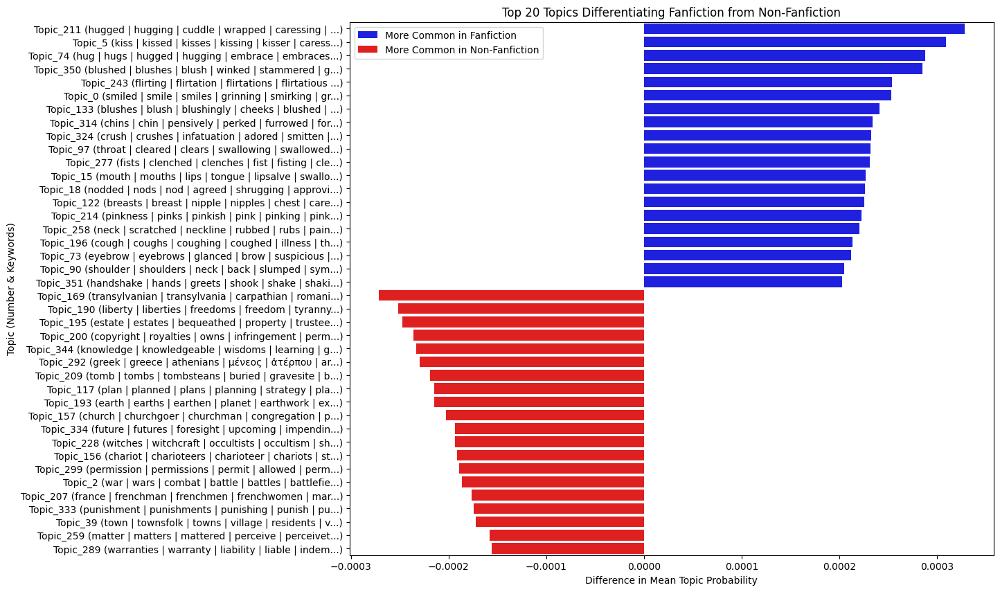

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the topics representation file
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file, delimiter=",")  # Adjust delimiter if needed

# Clean column names
topics_df.columns = topics_df.columns.str.strip()

# Convert topic numbers to strings and remove extra spaces
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()

# Create a dictionary mapping topic numbers to representative words
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

# Load the main dataset
main_file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(main_file_path)

# Step 1: Identify source types
print("Source Type Counts:")
print(df['source_type'].value_counts())

# Step 2: Extract topic columns (all columns starting with "Topic_")
topic_cols = [col for col in df.columns if col.startswith("Topic_")]

# Step 3: Split dataset into Fanfiction and Non-Fanfiction
fanfiction_df = df[df['source_type'] == 'fanfiction']
non_fanfiction_df = df[df['source_type'] != 'fanfiction']

# Step 4: Compute mean topic probabilities for Fanfiction & Non-Fanfiction
fanfiction_topics = fanfiction_df[topic_cols].mean()
non_fanfiction_topics = non_fanfiction_df[topic_cols].mean()

# Step 5: Create a DataFrame for topic comparison
topic_comparison = pd.DataFrame({
    "Fanfiction": fanfiction_topics,
    "Non-Fanfiction": non_fanfiction_topics
})

# Step 6: Compute difference (Fanfiction - Non-Fanfiction)
topic_comparison["Difference"] = topic_comparison["Fanfiction"] - topic_comparison["Non-Fanfiction"]

# Step 7: Extract Top 20 Most Distinct Topics for Fanfiction & Non-Fanfiction
top_fanfiction_topics = topic_comparison["Difference"].nlargest(20)
top_non_fanfiction_topics = topic_comparison["Difference"].nsmallest(20)

# Step 8: Convert topic numbers to words dynamically
top_fanfiction_topics_words = [
    (topic, topic_mapping.get(topic.split('_')[1], "Unknown"), value)
    for topic, value in top_fanfiction_topics.items()
]

top_non_fanfiction_topics_words = [
    (topic, topic_mapping.get(topic.split('_')[1], "Unknown"), value)
    for topic, value in top_non_fanfiction_topics.items()
]

# Step 9: Print Top Differentiating Topics with Words
print("\nTop 20 Topics More Common in Fanfiction:")
for topic, words, diff in top_fanfiction_topics_words:
    print(f"{topic} ({words}): {diff:.5f}")

print("\nTop 20 Topics More Common in Non-Fanfiction:")
for topic, words, diff in top_non_fanfiction_topics_words:
    print(f"{topic} ({words}): {diff:.5f}")

# Step 10: Visualize the Top Differentiating Topics
plt.figure(figsize=(12, 10))
sns.barplot(y=[f"{t} ({w[:50]}...)" for t, w, _ in top_fanfiction_topics_words],
            x=[d for _, _, d in top_fanfiction_topics_words],
            color="blue", label="More Common in Fanfiction")
sns.barplot(y=[f"{t} ({w[:50]}...)" for t, w, _ in top_non_fanfiction_topics_words],
            x=[d for _, _, d in top_non_fanfiction_topics_words],
            color="red", label="More Common in Non-Fanfiction")

plt.xlabel("Difference in Mean Topic Probability")
plt.ylabel("Topic (Number & Keywords)")
plt.title("Top 20 Topics Differentiating Fanfiction from Non-Fanfiction")
plt.legend()
plt.show()

Source Type Counts:
source_type
fanfiction    328611
original       40285
Name: count, dtype: int64

Top 20 Topics More Common in Fanfiction:
Topic_211 (hugged | hugging | cuddle | wrapped | caressing | embrace | cradled | comforting | wrapping | tightly | wrap | draped | waist | tangling | around | protectively | wraps | tight | tightening | necks | neck | arm | curled | grasping | tighter | affectionately | emotional | arms | reassure | closer): 0.00033
Topic_5 (kiss | kissed | kisses | kissing | kisser | caresses | caressed | caress | affection | cheek | lips | touched | cheeks | embrace | hug | touch | intimate | murmured | tenderly | whispered | tongue | feel | closer | passion | smiled | leaned | patted | mouth | peck | softly): 0.00031
Topic_74 (hug | hugs | hugged | hugging | embrace | embraces | embraced | embracing | affectionate | affection | snuggled | comforting | greeted | lovingly | smiled | greeting | touched | warmly | smile | smiles | enveloped | supportive | encircle

<ipython-input-18-a54aa612ac8e>:86: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-18-a54aa612ac8e>:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


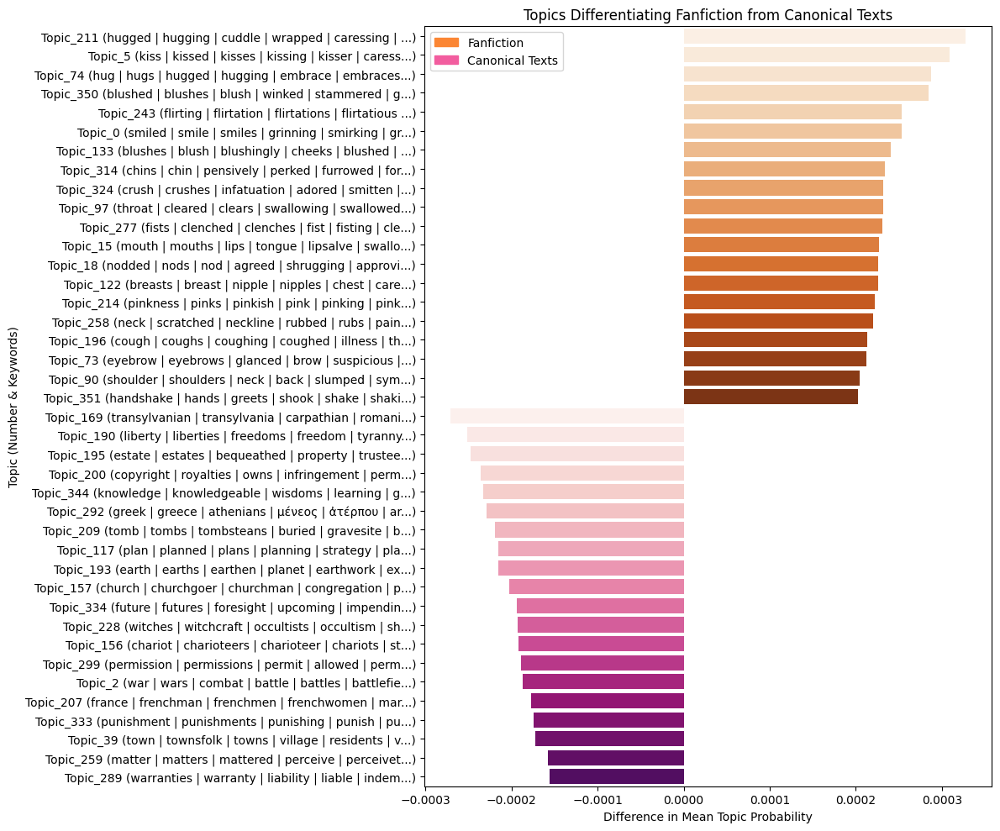

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

# Load the topics representation file
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file, delimiter=",")  # Adjust delimiter if needed

# Clean column names
topics_df.columns = topics_df.columns.str.strip()

# Convert topic numbers to strings and remove extra spaces
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()

# Create a dictionary mapping topic numbers to representative words
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

# Load the main dataset
main_file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(main_file_path)

# Step 1: Identify source types
print("Source Type Counts:")
print(df['source_type'].value_counts())

# Step 2: Extract topic columns (all columns starting with "Topic_")
topic_cols = [col for col in df.columns if col.startswith("Topic_")]

# Step 3: Split dataset into Fanfiction and Non-Fanfiction
fanfiction_df = df[df['source_type'] == 'fanfiction']
non_fanfiction_df = df[df['source_type'] != 'fanfiction']

# Step 4: Compute mean topic probabilities for Fanfiction & Non-Fanfiction
fanfiction_topics = fanfiction_df[topic_cols].mean()
non_fanfiction_topics = non_fanfiction_df[topic_cols].mean()

# Step 5: Create a DataFrame for topic comparison
topic_comparison = pd.DataFrame({
    "Fanfiction": fanfiction_topics,
    "Non-Fanfiction": non_fanfiction_topics
})

# Step 6: Compute difference (Fanfiction - Non-Fanfiction)
topic_comparison["Difference"] = topic_comparison["Fanfiction"] - topic_comparison["Non-Fanfiction"]

# Step 7: Extract Top 20 Most Distinct Topics for Fanfiction & Non-Fanfiction
top_fanfiction_topics = topic_comparison["Difference"].nlargest(20)
top_non_fanfiction_topics = topic_comparison["Difference"].nsmallest(20)

# Step 8: Convert topic numbers to words dynamically
top_fanfiction_topics_words = [
    (topic, topic_mapping.get(topic.split('_')[1], "Unknown"), value)
    for topic, value in top_fanfiction_topics.items()
]

top_non_fanfiction_topics_words = [
    (topic, topic_mapping.get(topic.split('_')[1], "Unknown"), value)
    for topic, value in top_non_fanfiction_topics.items()
]

# Step 9: Print Top Differentiating Topics with Words
print("\nTop 20 Topics More Common in Fanfiction:")
for topic, words, diff in top_fanfiction_topics_words:
    print(f"{topic} ({words}): {diff:.5f}")

print("\nTop 20 Topics More Common in Non-Fanfiction:")
for topic, words, diff in top_non_fanfiction_topics_words:
    print(f"{topic} ({words}): {diff:.5f}")

# Step 10: Visualize the Top Differentiating Topics with Color Gradients
plt.figure(figsize=(12, 10))

# Create labels with truncated representative words for clarity
fan_labels = [f"{t} ({w[:50]}...)" for t, w, _ in top_fanfiction_topics_words]
fan_values = [d for _, _, d in top_fanfiction_topics_words]
n_fan = len(fan_labels)
colors_fan = sns.color_palette("Oranges", n_colors=n_fan)

canon_labels = [f"{t} ({w[:50]}...)" for t, w, _ in top_non_fanfiction_topics_words]
canon_values = [d for _, _, d in top_non_fanfiction_topics_words]
n_canon = len(canon_labels)
colors_canon = sns.color_palette("RdPu", n_colors=n_canon)

# Plot fanfiction topics (positive differences)
sns.barplot(
    y=fan_labels,
    x=fan_values,
    palette=colors_fan,
    label="Fanfiction"
)

# Plot canonical texts topics (negative differences)
sns.barplot(
    y=canon_labels,
    x=canon_values,
    palette=colors_canon,
    label="Canonical Texts"
)

plt.xlabel("Difference in Mean Topic Probability")
plt.ylabel("Topic (Number & Keywords)")
plt.title("Topics Differentiating Fanfiction from Canonical Texts")

# Create legend patches using a median color from each palette
legend_handles = [
    Patch(color=colors_fan[n_fan // 2], label="Fanfiction"),
    Patch(color=colors_canon[n_canon // 2], label="Canonical Texts")
]
plt.legend(handles=legend_handles, loc="upper left")

plt.tight_layout()
plt.show()

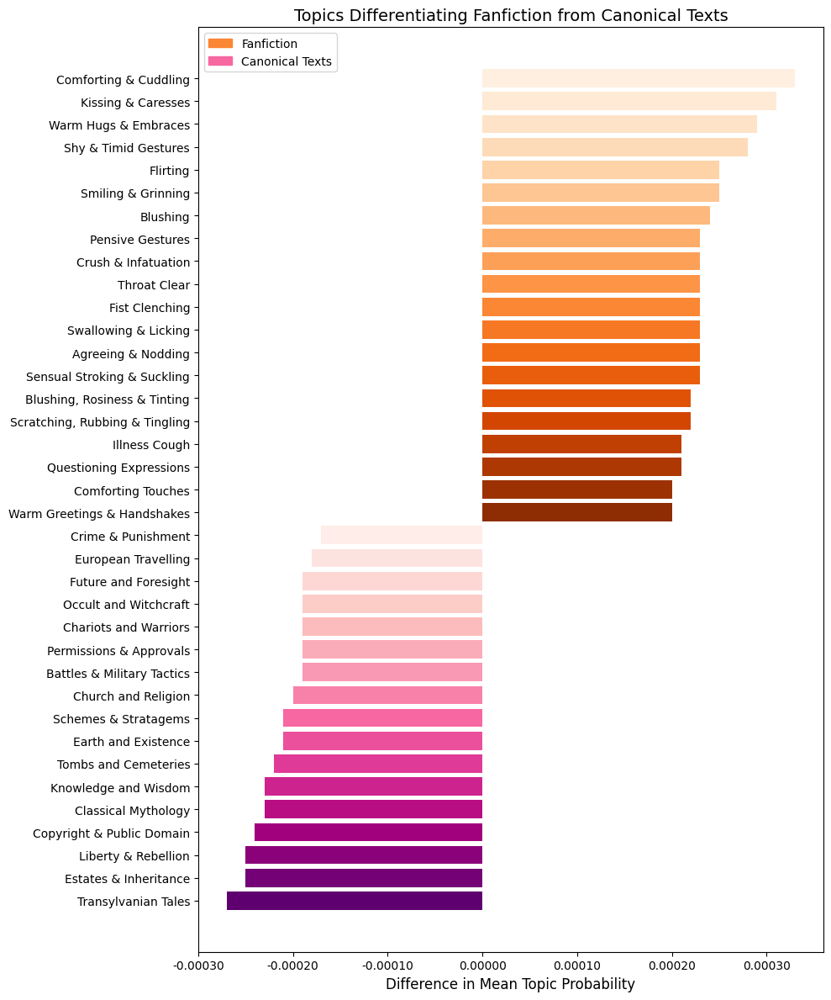

In [14]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.patches import Patch
import seaborn as sns

# Updated Fanfiction Topics (20 total)
fanfiction_topics = {
    "Comforting & Cuddling": 0.00033,
    "Kissing & Caresses": 0.00031,
    "Warm Hugs & Embraces": 0.00029,
    "Shy & Timid Gestures": 0.00028,
    "Flirting": 0.00025,
    "Smiling & Grinning": 0.00025,
    "Blushing": 0.00024,
    "Pensive Gestures": 0.00023,
    "Crush & Infatuation": 0.00023,
    "Throat Clear": 0.00023,
    "Fist Clenching": 0.00023,
    "Swallowing & Licking": 0.00023,
    "Agreeing & Nodding": 0.00023,
    "Sensual Stroking & Suckling": 0.00023,
    "Blushing, Rosiness & Tinting": 0.00022,
    "Scratching, Rubbing & Tingling": 0.00022,
    "Illness Cough": 0.00021,
    "Questioning Expressions": 0.00021,
    "Comforting Touches": 0.00020,
    "Warm Greetings & Handshakes": 0.00020
}

# Updated Non-Fanfiction Topics (17 total)
non_fanfiction_topics = {
    "Transylvanian Tales": -0.00027,
    "Liberty & Rebellion": -0.00025,
    "Estates & Inheritance": -0.00025,
    "Copyright & Public Domain": -0.00024,
    "Knowledge and Wisdom": -0.00023,
    "Classical Mythology": -0.00023,
    "Tombs and Cemeteries": -0.00022,
    "Schemes & Stratagems": -0.00021,
    "Earth and Existence": -0.00021,
    "Church and Religion": -0.00020,
    "Future and Foresight": -0.00019,
    "Occult and Witchcraft": -0.00019,
    "Chariots and Warriors": -0.00019,
    "Permissions & Approvals": -0.00019,
    "Battles & Military Tactics": -0.00019,
    "European Travelling": -0.00018,
    "Crime & Punishment": -0.00017
}

# Merge the two dictionaries
topic_diffs = {**fanfiction_topics, **non_fanfiction_topics}

# Sort topics by difference (descending: highest positive at top, then negatives)
sorted_topics = sorted(topic_diffs.items(), key=lambda x: x[1], reverse=True)
labels = [item[0] for item in sorted_topics]
differences = [item[1] for item in sorted_topics]

# Number of positive (fanfiction) topics and negative (canonical) topics
n_pos = len(fanfiction_topics)  # should be 20
n_neg = len(non_fanfiction_topics)  # should be 17

# Create color gradients using Seaborn palettes:
colors_pos = sns.color_palette("Oranges", n_colors=n_pos)
colors_neg = sns.color_palette("RdPu", n_colors=n_neg)

# Since our sorted_topics list is ordered descending (first 20 positive, then 17 negatives)
colors = colors_pos + colors_neg

# Create the merged horizontal bar chart
plt.figure(figsize=(10, 12))
plt.barh(labels, differences, color=colors)
plt.gca().invert_yaxis()  # So that the highest positive is on top

plt.xlabel("Difference in Mean Topic Probability", fontsize=12)
plt.title("Topics Differentiating Fanfiction from Canonical Texts", fontsize=14)
plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%.5f'))

# Create legend patches using a median color from each gradient:
legend_handles = [
    Patch(color=colors_pos[n_pos//2], label="Fanfiction"),
    Patch(color=colors_neg[n_neg//2], label="Canonical Texts")
]
# Move legend to the upper left
plt.legend(handles=legend_handles, loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()

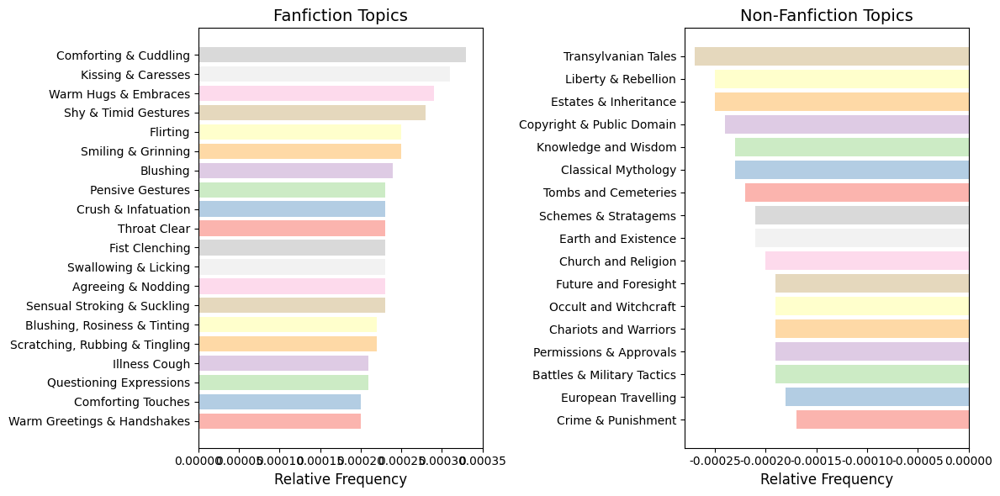

In [5]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter

# Updated Fanfiction Topics (20 total)
fanfiction_topics = {
    "Comforting & Cuddling": 0.00033,
    "Kissing & Caresses": 0.00031,
    "Warm Hugs & Embraces": 0.00029,
    "Shy & Timid Gestures": 0.00028,
    "Flirting": 0.00025,
    "Smiling & Grinning": 0.00025,
    "Blushing": 0.00024,
    "Pensive Gestures": 0.00023,
    "Crush & Infatuation": 0.00023,
    "Throat Clear": 0.00023,
    "Fist Clenching": 0.00023,
    "Swallowing & Licking": 0.00023,
    "Agreeing & Nodding": 0.00023,
    "Sensual Stroking & Suckling": 0.00023,
    "Blushing, Rosiness & Tinting": 0.00022,
    "Scratching, Rubbing & Tingling": 0.00022,
    "Illness Cough": 0.00021,
    "Questioning Expressions": 0.00021,
    "Comforting Touches": 0.00020,
    "Warm Greetings & Handshakes": 0.00020
}

# Updated Non-Fanfiction Topics (17 total)
non_fanfiction_topics = {
    "Transylvanian Tales": -0.00027,
    "Liberty & Rebellion": -0.00025,
    "Estates & Inheritance": -0.00025,
    "Copyright & Public Domain": -0.00024,
    "Knowledge and Wisdom": -0.00023,
    "Classical Mythology": -0.00023,
    "Tombs and Cemeteries": -0.00022,
    "Schemes & Stratagems": -0.00021,
    "Earth and Existence": -0.00021,
    "Church and Religion": -0.00020,
    "Future and Foresight": -0.00019,
    "Occult and Witchcraft": -0.00019,
    "Chariots and Warriors": -0.00019,
    "Permissions & Approvals": -0.00019,
    "Battles & Military Tactics": -0.00019,
    "European Travelling": -0.00018,
    "Crime & Punishment": -0.00017
}

# Pastel colors
pastel_colors = [
    '#FBB4AE', '#B3CDE3', '#CCEBC5', '#DECBE4', '#FED9A6',
    '#FFFFCC', '#E5D8BD', '#FDDAEC', '#F2F2F2', '#D9D9D9'
]

# Create a figure with 2 subplots side-by-side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# --- Fanfiction Topics ---
ft_labels = list(fanfiction_topics.keys())[::-1]    # reverse so highest is at top
ft_values = list(fanfiction_topics.values())[::-1]

axes[0].barh(ft_labels, ft_values, color=pastel_colors * 2)
axes[0].set_title('Fanfiction Topics', fontsize=14)
axes[0].set_xlabel('Relative Frequency', fontsize=12)
axes[0].tick_params(axis='y', labelsize=10)

# Format the x-axis to show 5 decimal places, and set a limit slightly above the max
axes[0].xaxis.set_major_formatter(FormatStrFormatter('%.5f'))
axes[0].set_xlim(0, 0.00035)  # Just above 0.00033

# --- Non-Fanfiction Topics ---
nft_labels = list(non_fanfiction_topics.keys())[::-1]
nft_values = list(non_fanfiction_topics.values())[::-1]

axes[1].barh(nft_labels, nft_values, color=pastel_colors * 2)
axes[1].set_title('Non-Fanfiction Topics', fontsize=14)
axes[1].set_xlabel('Relative Frequency', fontsize=12)
axes[1].tick_params(axis='y', labelsize=10)

# Format the x-axis to show 5 decimal places, and set negative range
axes[1].xaxis.set_major_formatter(FormatStrFormatter('%.5f'))
axes[1].set_xlim(-0.00028, 0)  # Just under -0.00027

plt.tight_layout()
plt.show()

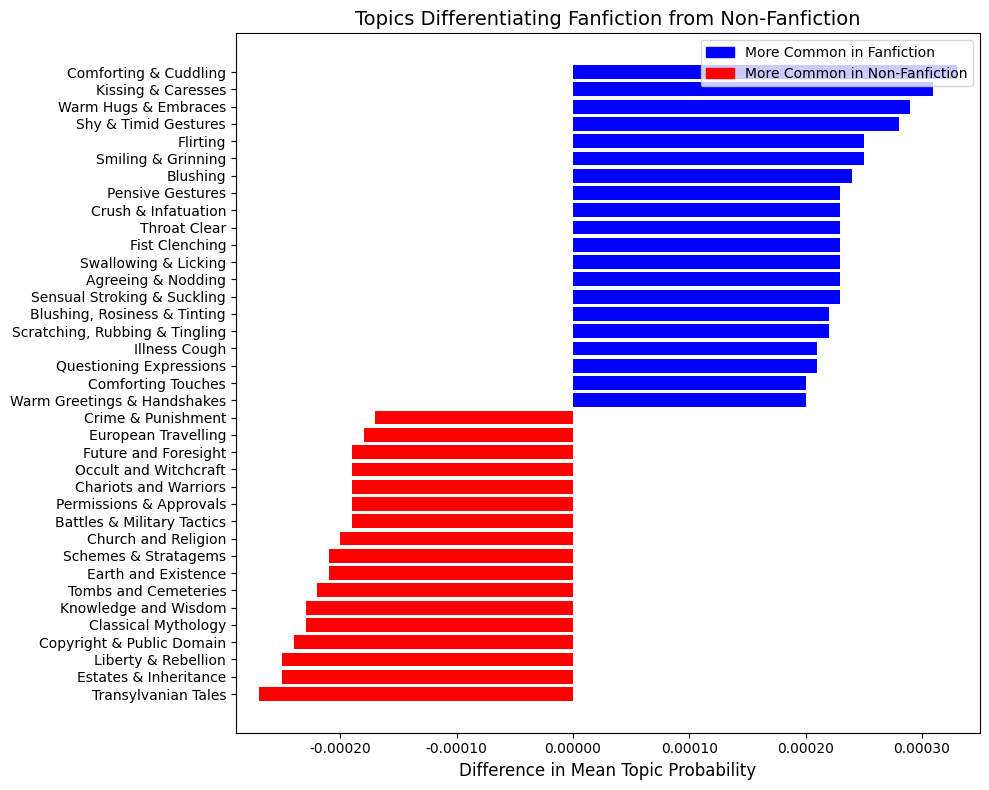

In [7]:
# Sort by difference descending, so largest positive at top, largest negative at bottom
sorted_topics = sorted(topic_diffs.items(), key=lambda x: x[1], reverse=True)

# Separate labels and differences
labels = [t[0] for t in sorted_topics]
differences = [t[1] for t in sorted_topics]

# Assign color: blue if > 0 (fanfiction), red if < 0 (non-fanfiction)
colors = ["blue" if val > 0 else "red" for val in differences]

# Create figure
plt.figure(figsize=(10, 8))

# Horizontal bar chart
plt.barh(labels, differences, color=colors)

# Reverse the y-axis so the top bar is the highest positive difference
plt.gca().invert_yaxis()

# Axis labels and title
plt.xlabel("Difference in Mean Topic Probability", fontsize=12)
plt.title("Topics Differentiating Fanfiction from Non-Fanfiction", fontsize=14)

# Format x-axis tick labels
plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%.5f'))

# Optional: Adjust x-limits so data looks cleaner (you can tweak as desired)
min_diff = min(differences) - 0.00002  # a bit of padding
max_diff = max(differences) + 0.00002
plt.xlim(min_diff, max_diff)

# Create a custom legend
# (we'll add one handle for fanfiction, one for non-fanfiction)
from matplotlib.patches import Patch
legend_handles = [
    Patch(color='blue', label='More Common in Fanfiction'),
    Patch(color='red',  label='More Common in Non-Fanfiction')
]
plt.legend(handles=legend_handles, loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()

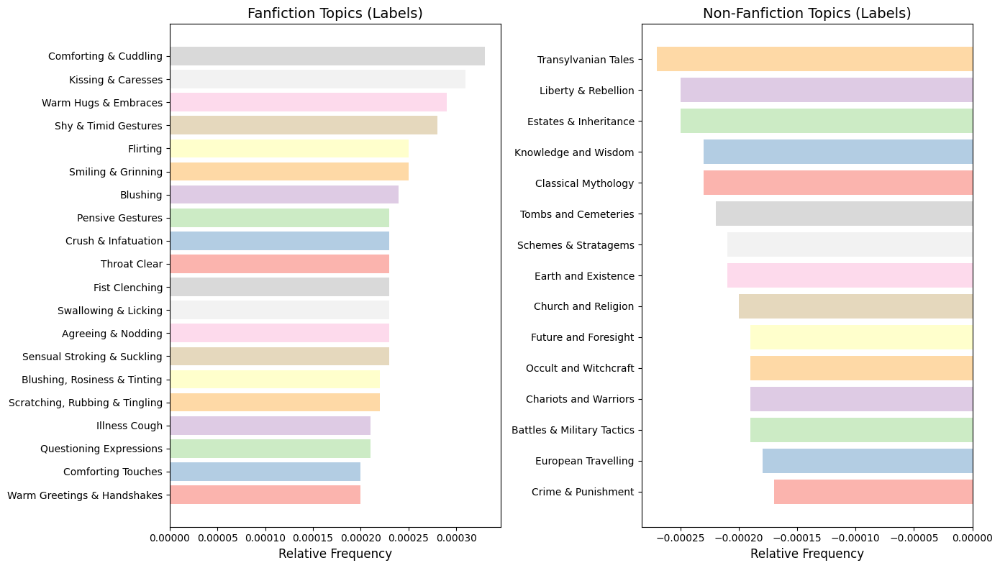

In [2]:
import matplotlib.pyplot as plt

# Define Fanfiction Topics with new labels and relative frequencies:
fanfiction_topics_labels = {
    "Comforting & Cuddling": 0.00033,
    "Kissing & Caresses": 0.00031,
    "Warm Hugs & Embraces": 0.00029,
    "Shy & Timid Gestures": 0.00028,
    "Flirting": 0.00025,
    "Smiling & Grinning": 0.00025,
    "Blushing": 0.00024,
    "Pensive Gestures": 0.00023,
    "Crush & Infatuation": 0.00023,
    "Throat Clear": 0.00023,
    "Fist Clenching": 0.00023,
    "Swallowing & Licking": 0.00023,
    "Agreeing & Nodding": 0.00023,
    "Sensual Stroking & Suckling": 0.00023,
    "Blushing, Rosiness & Tinting": 0.00022,
    "Scratching, Rubbing & Tingling": 0.00022,
    "Illness Cough": 0.00021,
    "Questioning Expressions": 0.00021,
    "Comforting Touches": 0.00020,
    "Warm Greetings & Handshakes": 0.00020
}

# Define Non-Fanfiction Topics with new labels and relative frequencies
non_fanfiction_topics_labels = {
    "Transylvanian Tales": -0.00027,
    "Liberty & Rebellion": -0.00025,
    "Estates & Inheritance": -0.00025,
    "Knowledge and Wisdom": -0.00023,
    "Classical Mythology": -0.00023,
    "Tombs and Cemeteries": -0.00022,
    "Schemes & Stratagems": -0.00021,
    "Earth and Existence": -0.00021,
    "Church and Religion": -0.00020,
    "Future and Foresight": -0.00019,
    "Occult and Witchcraft": -0.00019,
    "Chariots and Warriors": -0.00019,
    "Battles & Military Tactics": -0.00019,
    "European Travelling": -0.00018,
    "Crime & Punishment": -0.00017
}

# Set up a pastel color palette
pastel_colors = ['#FBB4AE', '#B3CDE3', '#CCEBC5', '#DECBE4', '#FED9A6',
                 '#FFFFCC', '#E5D8BD', '#FDDAEC', '#F2F2F2', '#D9D9D9']

# Create a figure with two subplots: one for fanfiction and one for non-fanfiction topics.
fig, axes = plt.subplots(1, 2, figsize=(14, 8))

# --- Fanfiction Topics Plot ---
ft_labels = list(fanfiction_topics_labels.keys())[::-1]  # reverse so highest appears on top
ft_values = list(fanfiction_topics_labels.values())[::-1]
axes[0].barh(ft_labels, ft_values, color=pastel_colors * 3)
axes[0].set_title('Fanfiction Topics (Labels)', fontsize=14)
axes[0].set_xlabel('Relative Frequency', fontsize=12)
axes[0].tick_params(axis='y', labelsize=10)

# --- Non-Fanfiction Topics Plot ---
nft_labels = list(non_fanfiction_topics_labels.keys())[::-1]
nft_values = list(non_fanfiction_topics_labels.values())[::-1]
axes[1].barh(nft_labels, nft_values, color=pastel_colors * 3)
axes[1].set_title('Non-Fanfiction Topics (Labels)', fontsize=14)
axes[1].set_xlabel('Relative Frequency', fontsize=12)
axes[1].tick_params(axis='y', labelsize=10)

plt.tight_layout()
plt.show()

In [11]:
import pandas as pd

# Load the dataset (Update the path as needed)
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)

# Extract unique values from the 'title_fandom' column
unique_fandoms = df["title_fandom"].unique()

# Print all unique fandom names for inspection
print("Unique values in 'title_fandom' column:")
for fandom in unique_fandoms:
    print(fandom)

Unique values in 'title_fandom' column:
Sherlock FF
Sherlock 
Pride And Prejudice 
Anne Green Gables 
Phantom 
Phantom FF
Peter Pan 
Iliad FF
Iliad 
Dracula 
Jeeves FF
Dracula FF
Anne Green Gables FF
Pride And Prejudice FF



🔹 **Top 20 Topics for Sherlock FF:**
Topic_105 (done | enough | finished | finish | finishing | complete | quite | sure | eventually | completion | replied | say | see | goes | finality | comes | saying | seest | anyway | fully | seem | yet | let | comings | maybe | convinced | going | mastered | show | along): 0.00413
Topic_66 (yes | yeah | sure | ok | okay | certainly | alright | surely | absolutely | says | say | ought | thank | answers | must | replied | maybe | greet | quite | question | asking | though | asked | anyway | whatever | want | let | see | shall | either): 0.00400
Topic_353 (happened | happen | happening | happens | actually | yeah | occasionally | recently | sure | sometimes | really | certainly | seems | yes | occasion | whatever | granted | alright | reality | something | showed | anyway | talked | okay | meant | got | fact | might | stormed | say): 0.00375
Topic_35 (hurry | hurried | hastened | hastening | hasted | rushed | haste | quicker | swiftly | quickness | 

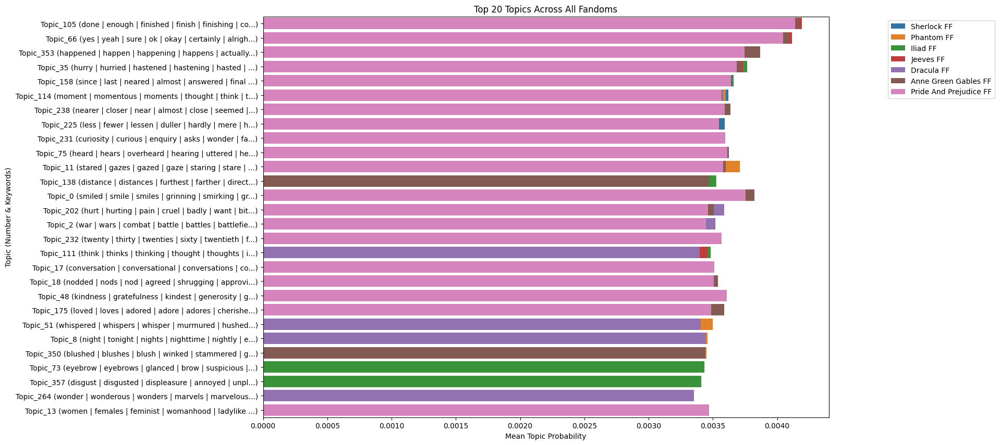

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)

# Load topics representation for topic-to-keyword mapping
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file, delimiter=",")  # Ensure correct delimiter
topics_df.columns = topics_df.columns.str.strip()  # Clean column names
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

# Step 1: Categorize Fanfiction vs. Original
df["text_category"] = df["title_fandom"].apply(lambda x: "fanfiction" if "FF" in x else "original")

# Step 2: List of all fandoms to analyze
selected_fandoms = [
    "Sherlock FF", "Sherlock", "Pride And Prejudice", "Anne Green Gables",
    "Phantom", "Phantom FF", "Peter Pan", "Iliad FF", "Iliad", "Dracula",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]

# Step 3: Extract relevant topic columns
topic_cols = [col for col in df.columns if col.startswith("Topic_")]

# Step 4: Compute average topic probabilities for each fandom
fandom_topic_means = {}

for fandom in selected_fandoms:
    fandom_df = df[df["title_fandom"] == fandom]
    if not fandom_df.empty:  # Ensure the fandom has data before processing
        fandom_topic_means[fandom] = fandom_df[topic_cols].mean()

# Convert to DataFrame for easier comparison
fandom_topic_df = pd.DataFrame(fandom_topic_means)

# Step 5: Identify top 20 topics in each fandom
top_fandom_topics = {fandom: fandom_topic_df[fandom].nlargest(20) for fandom in selected_fandoms if fandom in fandom_topic_df}

# Step 6: Convert topic numbers to words dynamically
top_fandom_topics_words = {
    fandom: [(topic, topic_mapping.get(topic.split('_')[1], "Unknown"), value)
             for topic, value in top_topics.items()]
    for fandom, top_topics in top_fandom_topics.items()
}

# Step 7: Print the results
for fandom, topics in top_fandom_topics_words.items():
    print(f"\n🔹 **Top 20 Topics for {fandom}:**")
    for topic, words, value in topics:
        print(f"{topic} ({words}): {value:.5f}")

# Step 8: Plot Topic Distributions for Visual Comparison
plt.figure(figsize=(14, 10))

colors = sns.color_palette("tab10", len(selected_fandoms))  # Assign different colors to fandoms
for i, (fandom, topics) in enumerate(top_fandom_topics_words.items()):
    sns.barplot(y=[f"{t} ({w[:50]}...)" for t, w, _ in topics],
                x=[v for _, _, v in topics],
                color=colors[i % len(colors)], label=fandom)

plt.xlabel("Mean Topic Probability")
plt.ylabel("Topic (Number & Keywords)")
plt.title("Top 20 Topics Across All Fandoms")
plt.legend(loc="upper right", bbox_to_anchor=(1.3, 1.0))  # Place legend outside the plot
plt.show()

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load topic probabilities data
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)

# Load the topics representation file
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file)
topics_df.columns = topics_df.columns.str.strip()
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()

# Create a dictionary mapping topic numbers to their representative words
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

In [19]:
selected_fandoms = [
    "Sherlock FF", "Phantom FF", "Iliad FF", "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]


In [20]:
# Filter only selected fandoms
df_fandoms = df[df["title_fandom"].isin(selected_fandoms)]

# Get topic columns
topic_columns = [col for col in df_fandoms.columns if col.startswith("Topic_")]

# Calculate mean probabilities per topic per fandom
fandom_topic_avg = df_fandoms.groupby("title_fandom")[topic_columns].mean()

In [22]:
# Calculate overall average across all fandoms
overall_means = fandom_topic_avg.mean(axis=0)

# Get top 15 topics
top_15_topics = overall_means.sort_values(ascending=False).head(15).index.tolist()

<ipython-input-23-8f7fe1d20c21>:15: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


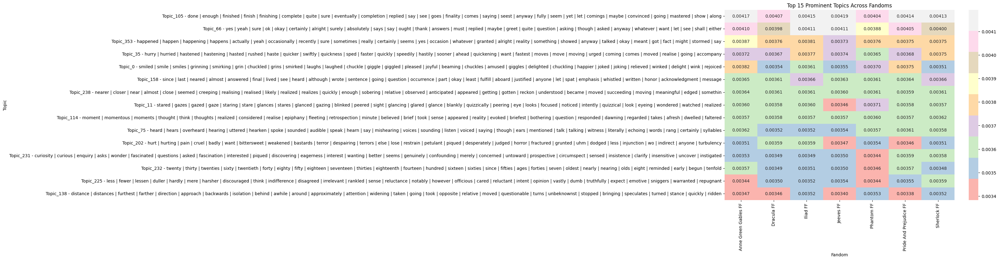

In [23]:
# Subset only top 15 topic columns
heatmap_data = fandom_topic_avg[top_15_topics]

# Add readable labels to rows
topic_labels = [f"{topic} - {topic_mapping[topic.split('_')[1]]}" for topic in top_15_topics]

# Plot
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data.T, cmap="Pastel1", annot=True, fmt=".5f",
            yticklabels=topic_labels, xticklabels=heatmap_data.index)

plt.title("Top 15 Prominent Topics Across Fandoms")
plt.xlabel("Fandom")
plt.ylabel("Topic")
plt.tight_layout()
plt.show()

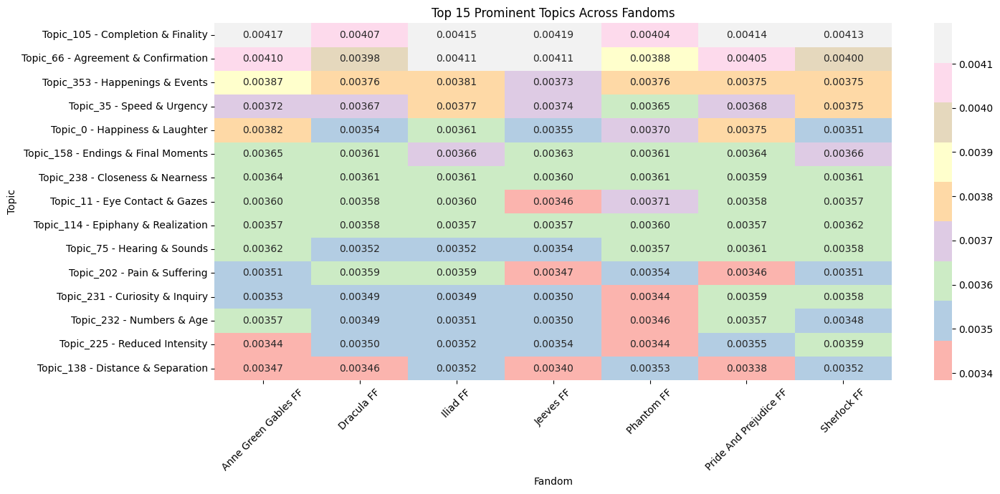

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)

# Define the fandoms of interest
selected_fandoms = [
    "Sherlock FF", "Sherlock", "Pride And Prejudice", "Anne Green Gables",
    "Phantom", "Phantom FF", "Peter Pan", "Iliad FF", "Iliad", "Dracula",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]

# Filter for selected fandoms
df_fandoms = df[df["title_fandom"].isin(selected_fandoms)]

# Get topic columns
topic_columns = [col for col in df_fandoms.columns if col.startswith("Topic_")]

# Calculate mean probabilities per topic per fandom
fandom_topic_avg = df_fandoms.groupby("title_fandom")[topic_columns].mean()

# Select the 15 most prominent topics
top_15_topics = ["Topic_105", "Topic_66", "Topic_353", "Topic_35", "Topic_0",
                 "Topic_158", "Topic_238", "Topic_11", "Topic_114", "Topic_75",
                 "Topic_202", "Topic_231", "Topic_232", "Topic_225", "Topic_138"]

# Filter only these topics
heatmap_data = fandom_topic_avg[top_15_topics]

# Define new descriptive labels for better readability
topic_labels = [
    "Topic_105 - Completion & Finality",
    "Topic_66 - Agreement & Confirmation",
    "Topic_353 - Happenings & Events",
    "Topic_35 - Speed & Urgency",
    "Topic_0 - Happiness & Laughter",
    "Topic_158 - Endings & Final Moments",
    "Topic_238 - Closeness & Nearness",
    "Topic_11 - Eye Contact & Gazes",
    "Topic_114 - Epiphany & Realization",
    "Topic_75 - Hearing & Sounds",
    "Topic_202 - Pain & Suffering",
    "Topic_231 - Curiosity & Inquiry",
    "Topic_232 - Numbers & Age",
    "Topic_225 - Reduced Intensity",
    "Topic_138 - Distance & Separation"
]

# Plot heatmap with topic labels
plt.figure(figsize=(15, 7))
sns.heatmap(heatmap_data.T, cmap="Pastel1", annot=True, fmt=".5f",
            yticklabels=topic_labels, xticklabels=heatmap_data.index)

plt.title("Top 15 Prominent Topics Across Fandoms")
plt.xlabel("Fandom")
plt.ylabel("Topic")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


🔹 **Top 40 Topics for Sherlock FF:**
Topic_105 (done | enough | finished | finish | finishing | complete | quite | sure | eventually | completion | replied | say | see | goes | finality | comes | saying | seest | anyway | fully | seem | yet | let | comings | maybe | convinced | going | mastered | show | along): 0.00413
Topic_66 (yes | yeah | sure | ok | okay | certainly | alright | surely | absolutely | says | say | ought | thank | answers | must | replied | maybe | greet | quite | question | asking | though | asked | anyway | whatever | want | let | see | shall | either): 0.00400
Topic_353 (happened | happen | happening | happens | actually | yeah | occasionally | recently | sure | sometimes | really | certainly | seems | yes | occasion | whatever | granted | alright | reality | something | showed | anyway | talked | okay | meant | got | fact | might | stormed | say): 0.00375
Topic_35 (hurry | hurried | hastened | hastening | hasted | rushed | haste | quicker | swiftly | quickness | 

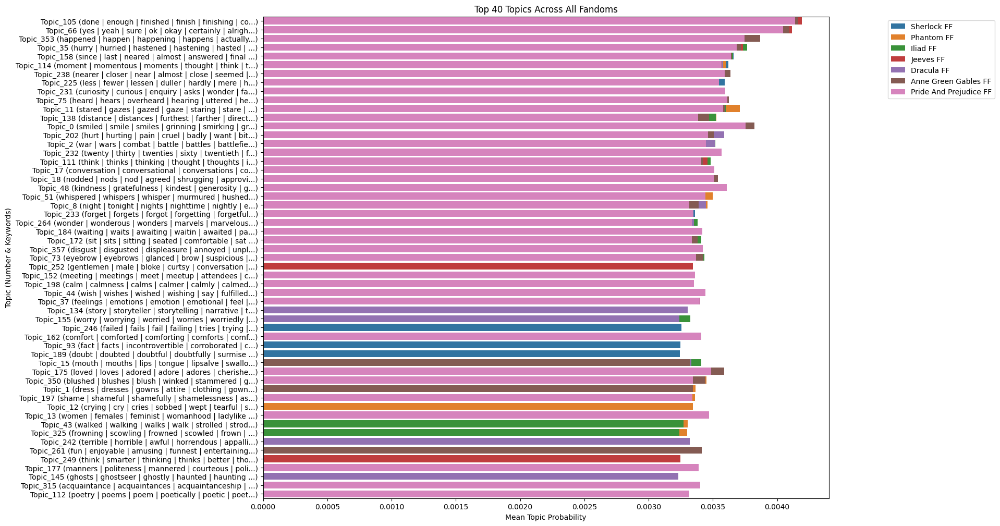

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)

# Load topics representation for topic-to-keyword mapping
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file, delimiter=",")  # Ensure correct delimiter
topics_df.columns = topics_df.columns.str.strip()  # Clean column names
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

# Step 1: Categorize Fanfiction vs. Original
df["text_category"] = df["title_fandom"].apply(lambda x: "fanfiction" if "FF" in x else "original")

# Step 2: List of all fandoms to analyze
selected_fandoms = [
    "Sherlock FF", "Sherlock", "Pride And Prejudice", "Anne Green Gables",
    "Phantom", "Phantom FF", "Peter Pan", "Iliad FF", "Iliad", "Dracula",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]

# Step 3: Extract relevant topic columns
topic_cols = [col for col in df.columns if col.startswith("Topic_")]

# Step 4: Compute average topic probabilities for each fandom
fandom_topic_means = {}

for fandom in selected_fandoms:
    fandom_df = df[df["title_fandom"] == fandom]
    if not fandom_df.empty:  # Ensure the fandom has data before processing
        fandom_topic_means[fandom] = fandom_df[topic_cols].mean()

# Convert to DataFrame for easier comparison
fandom_topic_df = pd.DataFrame(fandom_topic_means)

# Step 5: Identify top 40 topics in each fandom
top_fandom_topics = {fandom: fandom_topic_df[fandom].nlargest(40) for fandom in selected_fandoms if fandom in fandom_topic_df}

# Step 6: Convert topic numbers to words dynamically
top_fandom_topics_words = {
    fandom: [(topic, topic_mapping.get(topic.split('_')[1], "Unknown"), value)
             for topic, value in top_topics.items()]
    for fandom, top_topics in top_fandom_topics.items()
}

# Step 7: Print the results
for fandom, topics in top_fandom_topics_words.items():
    print(f"\n🔹 **Top 40 Topics for {fandom}:**")
    for topic, words, value in topics:
        print(f"{topic} ({words}): {value:.5f}")

# Step 8: Plot Topic Distributions for Visual Comparison
plt.figure(figsize=(14, 12))

colors = sns.color_palette("tab10", len(selected_fandoms))  # Assign different colors to fandoms
for i, (fandom, topics) in enumerate(top_fandom_topics_words.items()):
    sns.barplot(y=[f"{t} ({w[:50]}...)" for t, w, _ in topics],
                x=[v for _, _, v in topics],
                color=colors[i % len(colors)], label=fandom)

plt.xlabel("Mean Topic Probability")
plt.ylabel("Topic (Number & Keywords)")
plt.title("Top 40 Topics Across All Fandoms")
plt.legend(loc="upper right", bbox_to_anchor=(1.3, 1.0))  # Place legend outside the plot
plt.show()

Number of topics shared across all fandoms' top 40: 29

🔹 Topic: Topic_0 (smiled | smile | smiles | grinning | smirking | grin | chuckled | grins | smirked | laughs | laughed | chuckle | giggle | giggled | pleased | joyful | beaming | chuckles | amused | giggles | delighted | chuckling | happier | joked | joking | relieved | winked | delight | wink | rejoiced)
  Sherlock FF: 0.00351
  Phantom FF: 0.00370
  Iliad FF: 0.00361
  Jeeves FF: 0.00355
  Dracula FF: 0.00354
  Anne Green Gables FF: 0.00382
  Pride And Prejudice FF: 0.00375

🔹 Topic: Topic_105 (done | enough | finished | finish | finishing | complete | quite | sure | eventually | completion | replied | say | see | goes | finality | comes | saying | seest | anyway | fully | seem | yet | let | comings | maybe | convinced | going | mastered | show | along)
  Sherlock FF: 0.00413
  Phantom FF: 0.00404
  Iliad FF: 0.00415
  Jeeves FF: 0.00419
  Dracula FF: 0.00407
  Anne Green Gables FF: 0.00417
  Pride And Prejudice FF: 0.00414

🔹 T

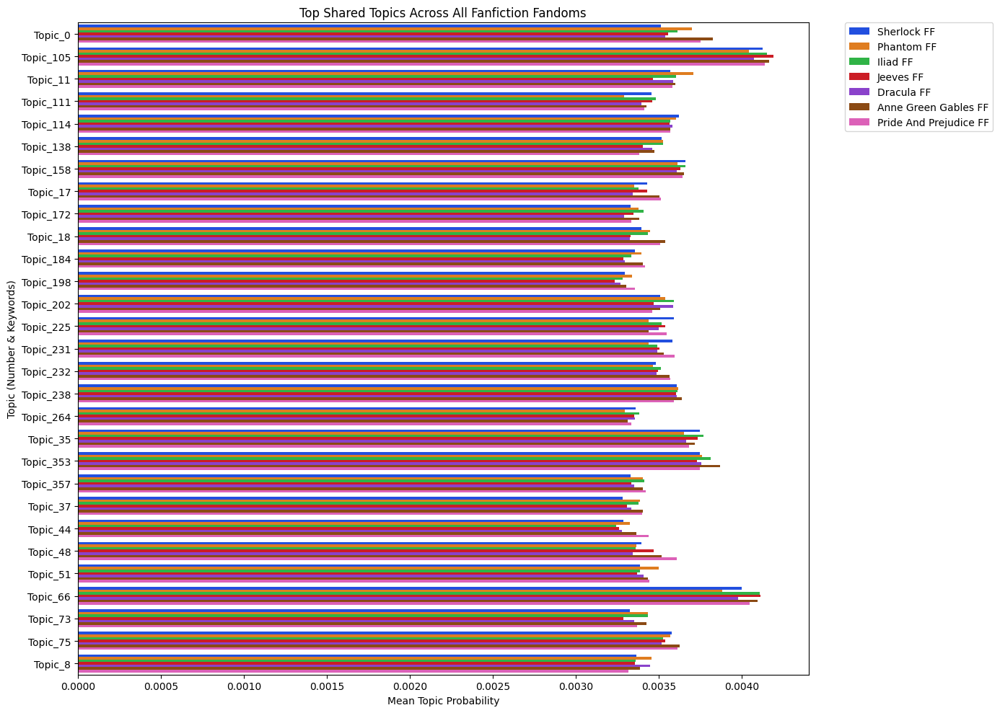

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load dataset
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)

# 2. Clean 'title_fandom' column by stripping extra spaces
df["title_fandom"] = df["title_fandom"].str.strip()

# 3. Load topics representation for topic-to-keyword mapping
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file, delimiter=",")  # Ensure correct delimiter
topics_df.columns = topics_df.columns.str.strip()  # Clean column names
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

# 4. Categorize Fanfiction vs. Original
df["text_category"] = df["title_fandom"].apply(lambda x: "fanfiction" if "FF" in x else "original")

# 5. List of all fandoms to analyze (Fanfiction only)
selected_fandoms = [
    "Sherlock FF", "Phantom FF", "Iliad FF",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]

# 6. Extract relevant topic columns (assuming they start with "Topic_")
topic_cols = [col for col in df.columns if col.startswith("Topic_")]

# 7. Compute average topic probabilities for each fandom
fandom_topic_means = {}
for fandom in selected_fandoms:
    fandom_df = df[df["title_fandom"] == fandom]
    if not fandom_df.empty:
        fandom_topic_means[fandom] = fandom_df[topic_cols].mean()

# Convert to DataFrame for easier comparison (rows: topics, columns: fandoms)
fandom_topic_df = pd.DataFrame(fandom_topic_means)

# 8. Identify top 40 topics in each fandom
top_fandom_topics = {}
for fandom in selected_fandoms:
    if fandom in fandom_topic_df:
        top_fandom_topics[fandom] = set(fandom_topic_df[fandom].nlargest(40).index)

# 9. Find topics shared across all fandoms
shared_topics = set.intersection(*top_fandom_topics.values())
print("Number of topics shared across all fandoms' top 40:", len(shared_topics))

# 10. From the shared topics, choose the top 30 based on the overall average probability
shared_topic_means = fandom_topic_df.loc[list(shared_topics)].mean(axis=1)
top30_shared_topics = shared_topic_means.nlargest(30).index

# 11. Prepare results: for each selected topic, gather topic representation and each fandom's probability
results = []
for topic in top30_shared_topics:
    topic_num = topic.split('_')[1]  # Extract the topic number from "Topic_x"
    topic_repr = topic_mapping.get(topic_num, "Unknown")
    row = {"Topic": topic, "Representation": topic_repr}
    for fandom in selected_fandoms:
        row[fandom] = fandom_topic_df.at[topic, fandom]
    results.append(row)

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by="Topic")  # Sort if needed

# 12. Print the results in a nice format
for idx, row in results_df.iterrows():
    print(f"\n🔹 Topic: {row['Topic']} ({row['Representation']})")
    for fandom in selected_fandoms:
        print(f"  {fandom}: {row[fandom]:.5f}")

# 13. Plot the topic probabilities for each fandom in a grouped bar chart
# Reshape data for plotting
plot_df = results_df.melt(
    id_vars=["Topic", "Representation"],
    value_vars=selected_fandoms,
    var_name="Fandom",
    value_name="Probability"
)

# Use a palette with more contrast, e.g., "bright"
palette = sns.color_palette("bright", n_colors=len(selected_fandoms))

plt.figure(figsize=(14, 10))
sns.barplot(
    data=plot_df,
    x="Probability",
    y="Topic",
    hue="Fandom",
    palette=palette
)
plt.xlabel("Mean Topic Probability")
plt.ylabel("Topic (Number & Keywords)")
plt.title("Top Shared Topics Across All Fanfiction Fandoms")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()

Number of topics shared across all fandoms' top 40: 29

🔹 Topic: Topic_0 (smiled | smile | smiles | grinning | smirking | grin | chuckled | grins | smirked | laughs | laughed | chuckle | giggle | giggled | pleased | joyful | beaming | chuckles | amused | giggles | delighted | chuckling | happier | joked | joking | relieved | winked | delight | wink | rejoiced) --> Smiling Faces
  Sherlock FF: 0.00351
  Phantom FF: 0.00370
  Iliad FF: 0.00361
  Jeeves FF: 0.00355
  Dracula FF: 0.00354
  Anne Green Gables FF: 0.00382
  Pride And Prejudice FF: 0.00375

🔹 Topic: Topic_105 (done | enough | finished | finish | finishing | complete | quite | sure | eventually | completion | replied | say | see | goes | finality | comes | saying | seest | anyway | fully | seem | yet | let | comings | maybe | convinced | going | mastered | show | along) --> Task Completed
  Sherlock FF: 0.00413
  Phantom FF: 0.00404
  Iliad FF: 0.00415
  Jeeves FF: 0.00419
  Dracula FF: 0.00407
  Anne Green Gables FF: 0.00417
 

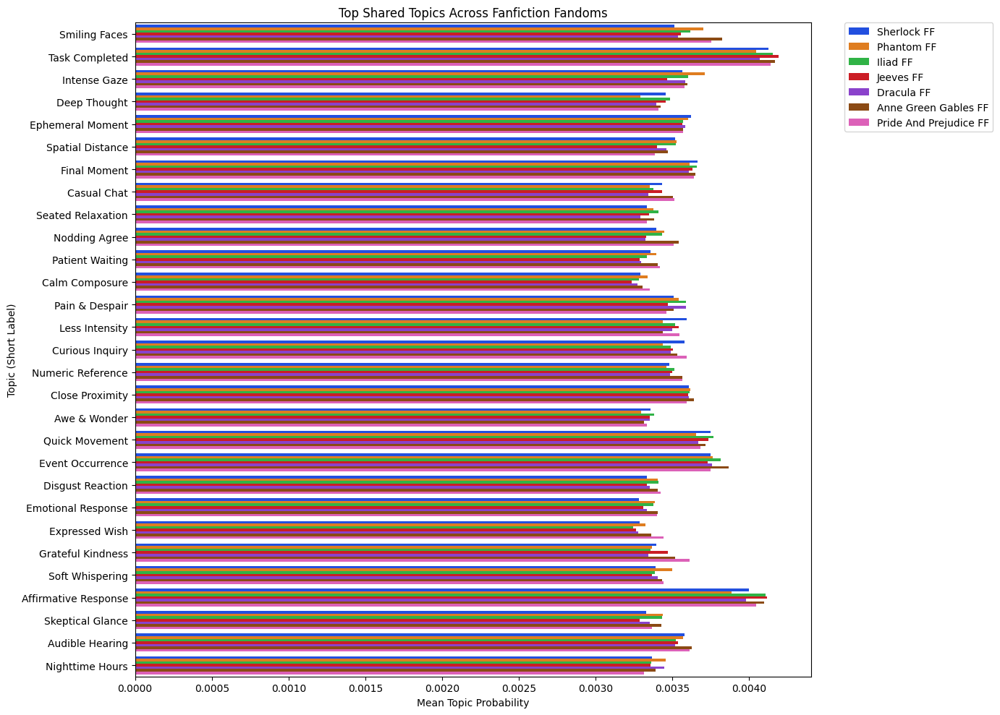

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load dataset
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)

# 2. Clean 'title_fandom' column by stripping extra spaces
df["title_fandom"] = df["title_fandom"].str.strip()

# 3. Load topics representation for topic-to-keyword mapping
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file, delimiter=",")  # Ensure correct delimiter
topics_df.columns = topics_df.columns.str.strip()  # Clean column names
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

# 4. Categorize Fanfiction vs. Original (if needed)
df["text_category"] = df["title_fandom"].apply(lambda x: "fanfiction" if "FF" in x else "original")

# 5. List of all fandoms to analyze (Fanfiction only)
selected_fandoms = [
    "Sherlock FF", "Phantom FF", "Iliad FF",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]

# 6. Extract relevant topic columns (assuming they start with "Topic_")
topic_cols = [col for col in df.columns if col.startswith("Topic_")]

# 7. Compute average topic probabilities for each fandom
fandom_topic_means = {}
for fandom in selected_fandoms:
    fandom_df = df[df["title_fandom"] == fandom]
    if not fandom_df.empty:
        fandom_topic_means[fandom] = fandom_df[topic_cols].mean()

# Convert to DataFrame for easier comparison (rows: topics, columns: fandoms)
fandom_topic_df = pd.DataFrame(fandom_topic_means)

# 8. Identify top 40 topics in each fandom
top_fandom_topics = {}
for fandom in selected_fandoms:
    if fandom in fandom_topic_df:
        top_fandom_topics[fandom] = set(fandom_topic_df[fandom].nlargest(40).index)

# 9. Find topics shared across all fandoms
shared_topics = set.intersection(*top_fandom_topics.values())
print("Number of topics shared across all fandoms' top 40:", len(shared_topics))

# 10. From the shared topics, choose the top 30 based on the overall average probability
shared_topic_means = fandom_topic_df.loc[list(shared_topics)].mean(axis=1)
top30_shared_topics = shared_topic_means.nlargest(30).index

# 11. Prepare results: for each selected topic, gather topic representation and each fandom's probability
results = []
for topic in top30_shared_topics:
    # Extract the topic number from "Topic_x"
    topic_num = topic.split('_')[1]
    topic_repr = topic_mapping.get(topic_num, "Unknown")
    row = {"Topic": topic, "Representation": topic_repr}
    for fandom in selected_fandoms:
        row[fandom] = fandom_topic_df.at[topic, fandom]
    results.append(row)

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by="Topic")  # sort if needed

# 12. Create a dictionary of short descriptive labels for each topic number.
short_labels = {
    "0": "Smiling Faces",
    "105": "Task Completed",
    "11": "Intense Gaze",
    "111": "Deep Thought",
    "114": "Ephemeral Moment",
    "138": "Spatial Distance",
    "158": "Final Moment",
    "17": "Casual Chat",
    "172": "Seated Relaxation",
    "18": "Nodding Agree",
    "184": "Patient Waiting",
    "198": "Calm Composure",
    "202": "Pain & Despair",
    "225": "Less Intensity",
    "231": "Curious Inquiry",
    "232": "Numeric Reference",
    "238": "Close Proximity",
    "264": "Awe & Wonder",
    "35": "Quick Movement",
    "353": "Event Occurrence",
    "357": "Disgust Reaction",
    "37": "Emotional Response",
    "44": "Expressed Wish",
    "48": "Grateful Kindness",
    "51": "Soft Whispering",
    "66": "Affirmative Response",
    "73": "Skeptical Glance",
    "75": "Audible Hearing",
    "8": "Nighttime Hours"
}

# Add a new column with the short label using the topic number from "Topic"
results_df["Short_Label"] = results_df["Topic"].apply(lambda t: short_labels.get(t.split('_')[1], "Unknown"))

# 13. Print the results in a nice format with short labels
for idx, row in results_df.iterrows():
    print(f"\n🔹 Topic: {row['Topic']} ({row['Representation']}) --> {row['Short_Label']}")
    for fandom in selected_fandoms:
        print(f"  {fandom}: {row[fandom]:.5f}")

# 14. Plot the topic probabilities for each fandom in a grouped bar chart using short labels on the y-axis
# Reshape data for plotting
plot_df = results_df.melt(
    id_vars=["Topic", "Representation", "Short_Label"],
    value_vars=selected_fandoms,
    var_name="Fandom",
    value_name="Probability"
)

# Use a palette with more contrast, e.g., "bright"
palette = sns.color_palette("bright", n_colors=len(selected_fandoms))

plt.figure(figsize=(14, 10))
sns.barplot(
    data=plot_df,
    x="Probability",
    y="Short_Label",  # use the short descriptive labels here
    hue="Fandom",
    palette=palette
)
plt.xlabel("Mean Topic Probability")
plt.ylabel("Topic (Short Label)")
plt.title("Top Shared Topics Across Fanfiction Fandoms")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()


In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ============================
# Data preparation (as before)
# ============================
# 1. Load dataset
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)

# 2. Clean 'title_fandom' column by stripping extra spaces
df["title_fandom"] = df["title_fandom"].str.strip()

# 3. Load topics representation for topic-to-keyword mapping
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file, delimiter=",")
topics_df.columns = topics_df.columns.str.strip()
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

# 4. (Optional) Categorize Fanfiction vs. Original
df["text_category"] = df["title_fandom"].apply(lambda x: "fanfiction" if "FF" in x else "original")

# 5. Use only fanfiction fandoms
selected_fandoms = [
    "Sherlock FF", "Phantom FF", "Iliad FF",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]

# 6. Extract topic columns (assume they start with "Topic_")
topic_cols = [col for col in df.columns if col.startswith("Topic_")]

# 7. Compute average topic probabilities for each fandom
fandom_topic_means = {}
for fandom in selected_fandoms:
    fandom_df = df[df["title_fandom"] == fandom]
    if not fandom_df.empty:
        fandom_topic_means[fandom] = fandom_df[topic_cols].mean()

# Convert to DataFrame (rows: topics, columns: fandoms)
fandom_topic_df = pd.DataFrame(fandom_topic_means)

# 8. Identify top 40 topics for each fandom
top_fandom_topics = {}
for fandom in selected_fandoms:
    if fandom in fandom_topic_df:
        top_fandom_topics[fandom] = set(fandom_topic_df[fandom].nlargest(40).index)

# 9. Find topics shared across all fandoms
shared_topics = set.intersection(*top_fandom_topics.values())
print("Number of topics shared across all fandoms' top 40:", len(shared_topics))

# 10. From the shared topics, choose the top 30 based on overall average probability
shared_topic_means = fandom_topic_df.loc[list(shared_topics)].mean(axis=1)
top30_shared_topics = shared_topic_means.nlargest(30).index

# 11. Prepare results: for each topic, gather its topic representation and each fandom's probability
results = []
for topic in top30_shared_topics:
    # Extract the topic number from "Topic_x"
    topic_num = topic.split('_')[1]
    topic_repr = topic_mapping.get(topic_num, "Unknown")
    row = {"Topic": topic, "Representation": topic_repr}
    for fandom in selected_fandoms:
        row[fandom] = fandom_topic_df.at[topic, fandom]
    results.append(row)

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by="Topic")

# 12. Create a dictionary of short descriptive labels (manually defined)
short_labels = {
    "0": "Smiling Faces",
    "105": "Task Completed",
    "11": "Intense Gaze",
    "111": "Deep Thought",
    "114": "Ephemeral Moment",
    "138": "Spatial Distance",
    "158": "Final Moment",
    "17": "Casual Chat",
    "172": "Seated Relaxation",
    "18": "Nodding Agree",
    "184": "Patient Waiting",
    "198": "Calm Composure",
    "202": "Pain & Despair",
    "225": "Less Intensity",
    "231": "Curious Inquiry",
    "232": "Numeric Reference",
    "238": "Close Proximity",
    "264": "Awe & Wonder",
    "35": "Quick Movement",
    "353": "Event Occurrence",
    "357": "Disgust Reaction",
    "37": "Emotional Response",
    "44": "Expressed Wish",
    "48": "Grateful Kindness",
    "51": "Soft Whispering",
    "66": "Affirmative Response",
    "73": "Skeptical Glance",
    "75": "Audible Hearing",
    "8": "Nighttime Hours"
}

# Add a new column with the short label based on the topic number
results_df["Short_Label"] = results_df["Topic"].apply(lambda t: short_labels.get(t.split('_')[1], "Unknown"))

# ============================================
# Create a summary table with probability levels
# ============================================

# A simple classification function based on the median probability in results_df for each fandom.
def classify(prob, median):
    if prob > median:
        return "High"
    elif prob < median:
        return "Low"
    else:
        return "Moderate"

# Create a copy of results_df to add classification columns.
summary_df = results_df[["Topic", "Short_Label", "Representation"]].copy()

# For each fandom, add two columns: one for the probability and one for the level.
for fandom in selected_fandoms:
    # Calculate median of probabilities for this fandom (across the selected topics)
    median_val = results_df[fandom].median()
    # Add probability (formatted as string) and level
    summary_df[f"{fandom} Prob"] = results_df[fandom].apply(lambda x: f"{x:.5f}")
    summary_df[f"{fandom} Level"] = results_df[fandom].apply(lambda x: classify(x, median_val))

# Reorder columns so that the first three are Topic, Short_Label, Representation and then pairs for each fandom.
cols_order = ["Topic", "Short_Label", "Representation"]
for fandom in selected_fandoms:
    cols_order.extend([f"{fandom} Prob", f"{fandom} Level"])

summary_df = summary_df[cols_order]

# Display the summary table
print("\nSummary Table:")
print(summary_df.to_string(index=False))

Number of topics shared across all fandoms' top 40: 29

Summary Table:
    Topic          Short_Label                                                                                                                                                                                                                                                                                                                                   Representation Sherlock FF Prob Sherlock FF Level Phantom FF Prob Phantom FF Level Iliad FF Prob Iliad FF Level Jeeves FF Prob Jeeves FF Level Dracula FF Prob Dracula FF Level Anne Green Gables FF Prob Anne Green Gables FF Level Pride And Prejudice FF Prob Pride And Prejudice FF Level
  Topic_0        Smiling Faces                                                  smiled | smile | smiles | grinning | smirking | grin | chuckled | grins | smirked | laughs | laughed | chuckle | giggle | giggled | pleased | joyful | beaming | chuckles | amused | giggles | delighted | chuckli


--- All ANOVA p-values by Topic ---
         Topic  ANOVA_p_value  Significant
0      Topic_0   0.000000e+00         True
1      Topic_1   0.000000e+00         True
2      Topic_2   0.000000e+00         True
3      Topic_3  3.765290e-274         True
4      Topic_4   0.000000e+00         True
..         ...            ...          ...
358  Topic_358   0.000000e+00         True
359  Topic_359   0.000000e+00         True
360  Topic_360   0.000000e+00         True
361  Topic_361   0.000000e+00         True
362  Topic_362   0.000000e+00         True

[363 rows x 3 columns]

--- Significant Topics (p < 0.05) ---
         Topic  ANOVA_p_value  Significant
0      Topic_0   0.000000e+00         True
1      Topic_1   0.000000e+00         True
2      Topic_2   0.000000e+00         True
3      Topic_3  3.765290e-274         True
4      Topic_4   0.000000e+00         True
..         ...            ...          ...
358  Topic_358   0.000000e+00         True
359  Topic_359   0.000000e+00         Tr

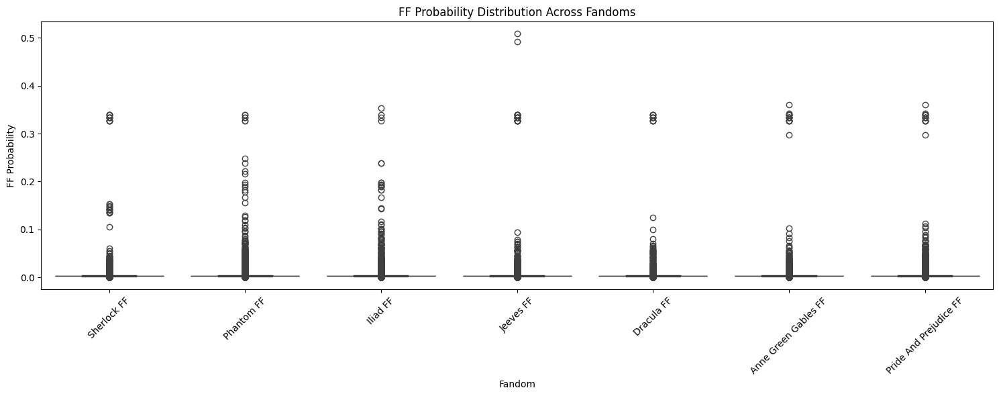

In [14]:
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Load Data
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)
df["title_fandom"] = df["title_fandom"].str.strip()

# Step 2: Load topic representations
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file, delimiter=",")
topics_df.columns = topics_df.columns.str.strip()
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

# Step 3: Filter for Fanfiction
df["text_category"] = df["title_fandom"].apply(lambda x: "fanfiction" if "FF" in x else "original")
selected_fandoms = [
    "Sherlock FF", "Phantom FF", "Iliad FF",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]
df = df[df["title_fandom"].isin(selected_fandoms)]

# Step 4: Topic Columns & Melt
topic_cols = [col for col in df.columns if col.startswith("Topic_")]
long_df = df.melt(id_vars=["title_fandom"], value_vars=topic_cols,
                  var_name="Topic", value_name="FF_Prob")

# Step 5: ANOVA for Each Topic
anova_results = {}
for topic in topic_cols:
    grouped = [df[df["title_fandom"] == fandom][topic].dropna() for fandom in selected_fandoms]
    stat, pval = stats.f_oneway(*grouped)
    anova_results[topic] = pval

anova_df = pd.DataFrame(list(anova_results.items()), columns=["Topic", "ANOVA_p_value"])
anova_df["Significant"] = anova_df["ANOVA_p_value"] < 0.05

# Step 6: Show Results in Console
print("\n--- All ANOVA p-values by Topic ---")
print(anova_df)

print("\n--- Significant Topics (p < 0.05) ---")
print(anova_df[anova_df["Significant"] == True])

# Step 7: Visual Boxplot Comparison
plt.figure(figsize=(15, 6))
sns.boxplot(data=long_df, x="title_fandom", y="FF_Prob")
plt.xticks(rotation=45)
plt.title("FF Probability Distribution Across Fandoms")
plt.xlabel("Fandom")
plt.ylabel("FF Probability")
plt.tight_layout()
plt.show()

In [15]:
anova_df.to_csv("/content/drive/MyDrive/BERTTopic_Models_POS/anova_ff_topic_results.csv", index=False)

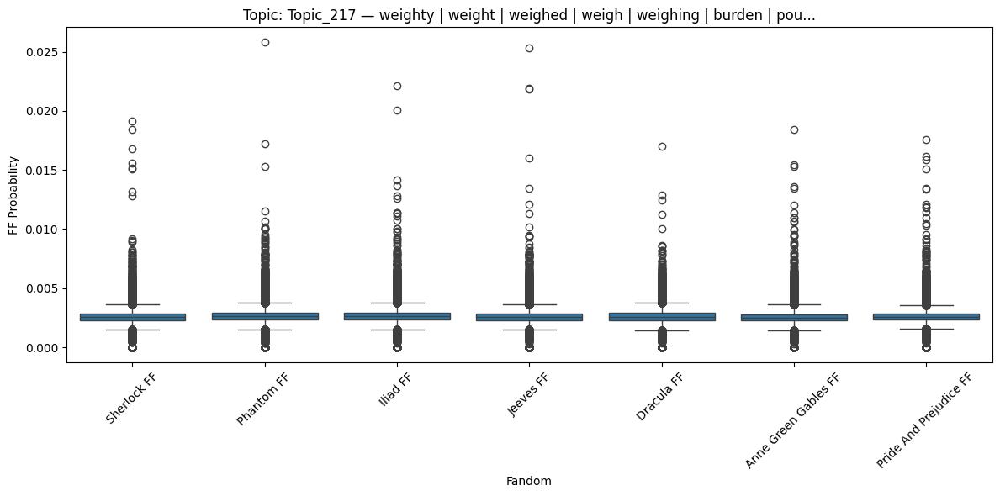

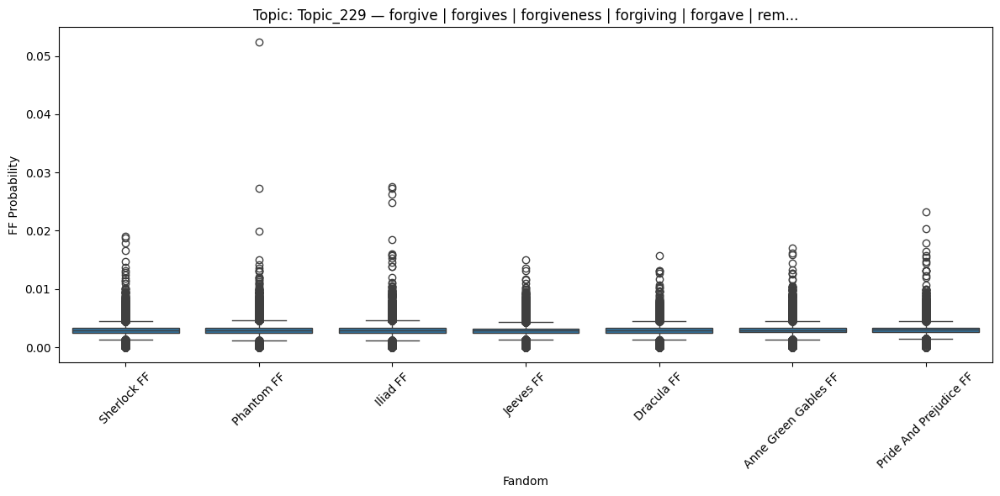

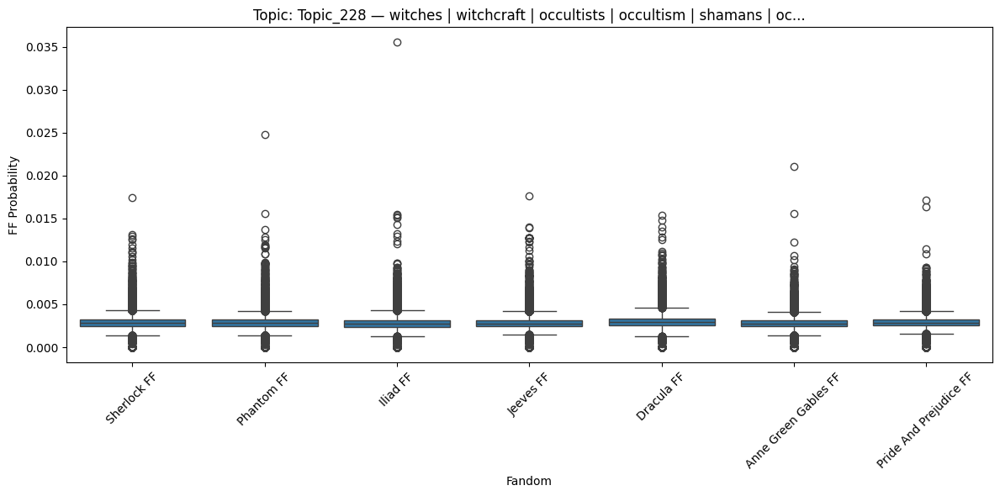

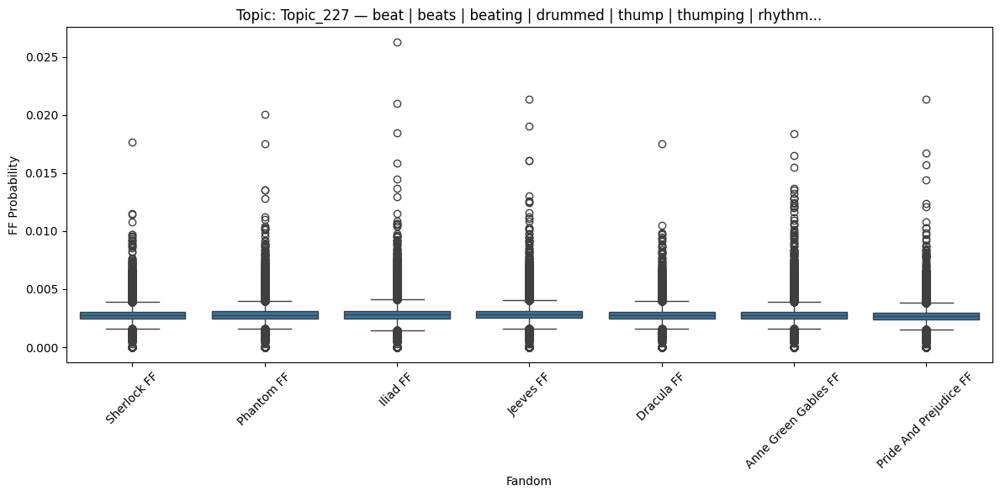

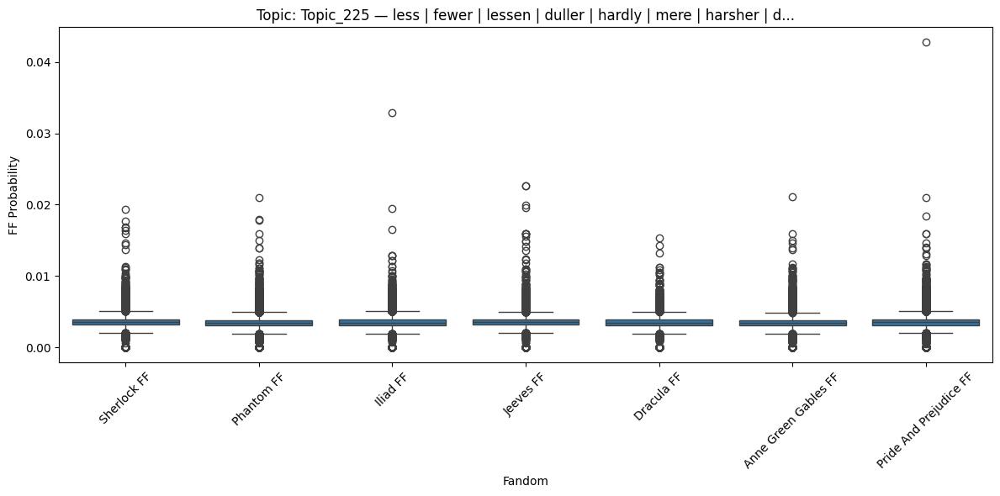

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load ANOVA results and topic representations
anova_df = pd.read_csv("/content/drive/MyDrive/BERTTopic_Models_POS/anova_ff_topic_results.csv")
topics_df = pd.read_csv("/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv")

# Prepare topic column for merging
topics_df["Topic"] = "Topic_" + topics_df["Topic_Number"].astype(str)

# Merge ANOVA results with topic descriptions
merged_df = pd.merge(anova_df, topics_df, on="Topic", how="left")

# Re-rank by significance (lowest p-value first)
ranked_df = merged_df.sort_values("ANOVA_p_value")

# Save enhanced results
ranked_df.to_csv("/content/drive/MyDrive/BERTTopic_Models_POS/enhanced_anova_results_with_topics.csv", index=False)

# Load full dataset for visualization
data_df = pd.read_csv("/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv")
data_df["title_fandom"] = data_df["title_fandom"].str.strip()

# Filter for selected fanfiction fandoms
selected_fandoms = [
    "Sherlock FF", "Phantom FF", "Iliad FF",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]
data_df = data_df[data_df["title_fandom"].isin(selected_fandoms)]

# Melt data for plotting
topic_cols = [col for col in data_df.columns if col.startswith("Topic_")]
long_df = data_df.melt(id_vars=["title_fandom"], value_vars=topic_cols,
                       var_name="Topic", value_name="FF_Prob")

# Plot top 5 significant topics
top_topics = ranked_df.head(5)["Topic"].tolist()
for topic in top_topics:
    topic_name = ranked_df[ranked_df["Topic"] == topic]["Topic_Representation"].values[0]
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=long_df[long_df["Topic"] == topic], x="title_fandom", y="FF_Prob")
    plt.title(f"Topic: {topic} — {topic_name[:60]}...")
    plt.xlabel("Fandom")
    plt.ylabel("FF Probability")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

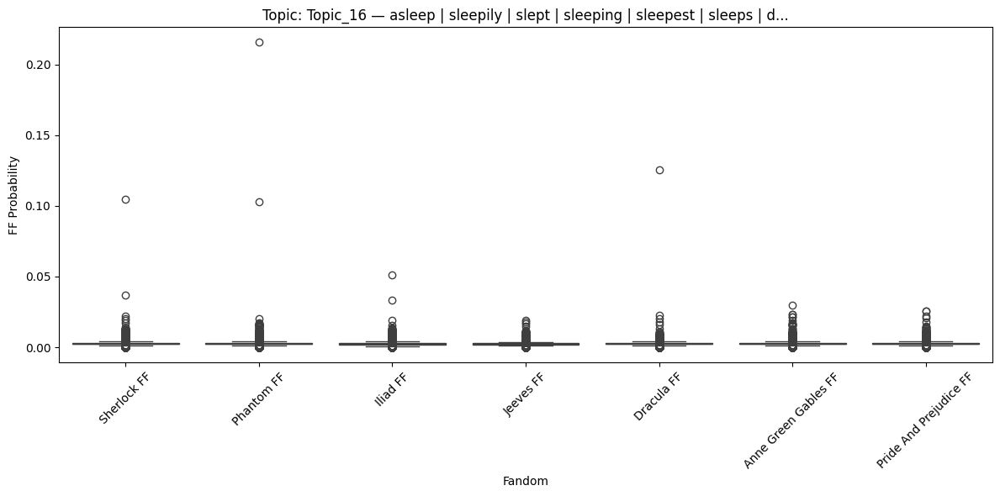


Tukey HSD Results for Topic_16 — asleep | sleepily | slept | sleeping | sleepest | sleeps | d...
                Multiple Comparison of Means - Tukey HSD, FWER=0.05                 
        group1                 group2         meandiff p-adj   lower   upper  reject
------------------------------------------------------------------------------------
  Anne Green Gables FF             Dracula FF      0.0    1.0    -0.0     0.0  False
  Anne Green Gables FF               Iliad FF  -0.0002    0.0 -0.0002 -0.0001   True
  Anne Green Gables FF              Jeeves FF  -0.0001    0.0 -0.0002 -0.0001   True
  Anne Green Gables FF             Phantom FF   0.0001    0.0  0.0001  0.0001   True
  Anne Green Gables FF Pride And Prejudice FF     -0.0 0.0082    -0.0    -0.0   True
  Anne Green Gables FF            Sherlock FF  -0.0001    0.0 -0.0001    -0.0   True
            Dracula FF               Iliad FF  -0.0002    0.0 -0.0002 -0.0001   True
            Dracula FF              Jeeves FF  -0.00

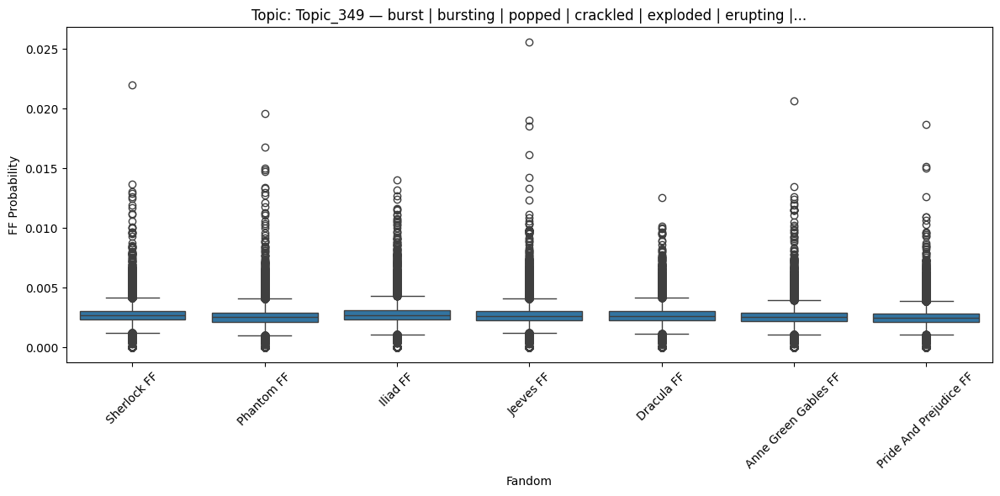


Tukey HSD Results for Topic_349 — burst | bursting | popped | crackled | exploded | erupting |...
                Multiple Comparison of Means - Tukey HSD, FWER=0.05                 
        group1                 group2         meandiff p-adj   lower   upper  reject
------------------------------------------------------------------------------------
  Anne Green Gables FF             Dracula FF   0.0001    0.0  0.0001  0.0002   True
  Anne Green Gables FF               Iliad FF   0.0002    0.0  0.0002  0.0002   True
  Anne Green Gables FF              Jeeves FF   0.0001    0.0  0.0001  0.0001   True
  Anne Green Gables FF             Phantom FF      0.0  0.767    -0.0     0.0  False
  Anne Green Gables FF Pride And Prejudice FF  -0.0001    0.0 -0.0001 -0.0001   True
  Anne Green Gables FF            Sherlock FF   0.0002    0.0  0.0002  0.0002   True
            Dracula FF               Iliad FF   0.0001    0.0     0.0  0.0001   True
            Dracula FF              Jeeves FF     -

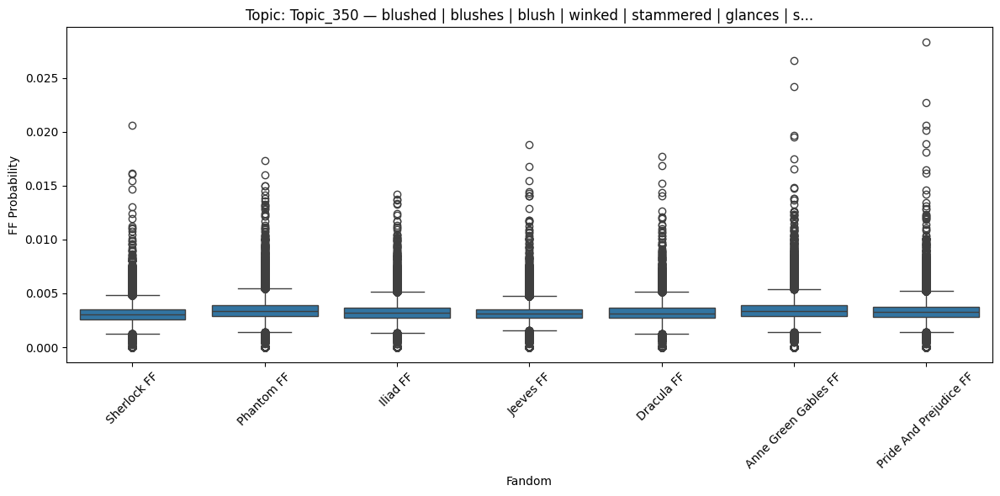


Tukey HSD Results for Topic_350 — blushed | blushes | blush | winked | stammered | glances | s...
                Multiple Comparison of Means - Tukey HSD, FWER=0.05                 
        group1                 group2         meandiff p-adj   lower   upper  reject
------------------------------------------------------------------------------------
  Anne Green Gables FF             Dracula FF  -0.0002    0.0 -0.0002 -0.0002   True
  Anne Green Gables FF               Iliad FF  -0.0002    0.0 -0.0002 -0.0002   True
  Anne Green Gables FF              Jeeves FF  -0.0003    0.0 -0.0003 -0.0003   True
  Anne Green Gables FF             Phantom FF      0.0 0.7561    -0.0     0.0  False
  Anne Green Gables FF Pride And Prejudice FF  -0.0001    0.0 -0.0001 -0.0001   True
  Anne Green Gables FF            Sherlock FF  -0.0004    0.0 -0.0004 -0.0003   True
            Dracula FF               Iliad FF      0.0 0.0424     0.0     0.0   True
            Dracula FF              Jeeves FF  -0.0

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Load datasets
topic_probs_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
anova_enhanced_path = "/content/drive/MyDrive/BERTTopic_Models_POS/enhanced_anova_results_with_topics.csv"

df = pd.read_csv(topic_probs_path)
anova_df = pd.read_csv(anova_enhanced_path)

# Clean up
df["title_fandom"] = df["title_fandom"].str.strip()

# Filter for fanfiction fandoms
selected_fandoms = [
    "Sherlock FF", "Phantom FF", "Iliad FF",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]
df = df[df["title_fandom"].isin(selected_fandoms)]

# Reshape to long format
topic_cols = [col for col in df.columns if col.startswith("Topic_")]
long_df = df.melt(id_vars=["title_fandom"], value_vars=topic_cols,
                  var_name="Topic", value_name="FF_Prob")

# Get top 3 most significant topics
top_3_topics = anova_df.sort_values("ANOVA_p_value").head(3)

# Store Tukey results
tukey_results = {}

# Loop through top topics
for _, row in top_3_topics.iterrows():
    topic = row["Topic"]
    topic_label = row["Topic_Representation"]

    topic_data = long_df[long_df["Topic"] == topic]

    # Boxplot
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=topic_data, x="title_fandom", y="FF_Prob")
    plt.title(f"Topic: {topic} — {topic_label[:60]}...")
    plt.xlabel("Fandom")
    plt.ylabel("FF Probability")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Tukey HSD Test
    tukey = pairwise_tukeyhsd(endog=topic_data["FF_Prob"],
                              groups=topic_data["title_fandom"],
                              alpha=0.05)
    print(f"\nTukey HSD Results for {topic} — {topic_label[:60]}...")
    print(tukey.summary())

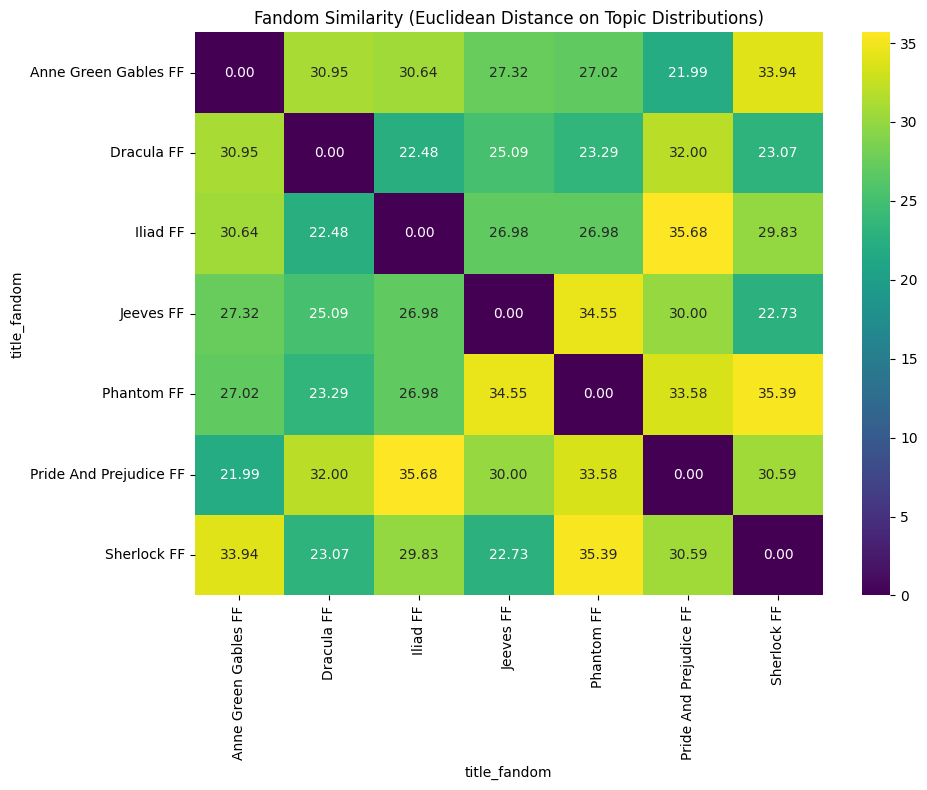

In [24]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform
from sklearn.preprocessing import StandardScaler

# === Continue from your setup ===
anova_df = pd.read_csv("/content/drive/MyDrive/BERTTopic_Models_POS/anova_ff_topic_results.csv")
topics_df = pd.read_csv("/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv")
topics_df["Topic"] = "Topic_" + topics_df["Topic_Number"].astype(str)
merged_df = pd.merge(anova_df, topics_df, on="Topic", how="left")
ranked_df = merged_df.sort_values("ANOVA_p_value")
ranked_df.to_csv("/content/drive/MyDrive/BERTTopic_Models_POS/enhanced_anova_results_with_topics.csv", index=False)

# === Load Topic Probabilities ===
data_df = pd.read_csv("/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv")
data_df["title_fandom"] = data_df["title_fandom"].str.strip()

# === Define fandoms of interest ===
selected_fandoms = [
    "Sherlock FF", "Phantom FF", "Iliad FF",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]

# Filter
data_df = data_df[data_df["title_fandom"].isin(selected_fandoms)]

# === Get Topic Columns & Group Averages ===
topic_cols = [col for col in data_df.columns if col.startswith("Topic_")]
fandom_avg = data_df.groupby("title_fandom")[topic_cols].mean()

# === Step 1: Rank Fandom Pairs by Difference ===
fandom_pairs = []
for i, fandom1 in enumerate(fandom_avg.index):
    for j, fandom2 in enumerate(fandom_avg.index):
        if j > i:
            diff = np.mean(np.abs(fandom_avg.loc[fandom1] - fandom_avg.loc[fandom2]))
            fandom_pairs.append((fandom1, fandom2, diff))

# Save ranked differences
fandom_diff_df = pd.DataFrame(fandom_pairs, columns=["Fandom_1", "Fandom_2", "Avg_Topic_Difference"])
fandom_diff_df = fandom_diff_df.sort_values("Avg_Topic_Difference", ascending=False)
fandom_diff_df.to_csv("/content/drive/MyDrive/BERTTopic_Models_POS/fandom_topic_differences.csv", index=False)

# === Step 2: Create Heatmap of Fandom Similarity ===
scaler = StandardScaler()
scaled_data = scaler.fit_transform(fandom_avg)
dist_matrix = squareform(pdist(scaled_data, metric='euclidean'))
heatmap_df = pd.DataFrame(dist_matrix, index=fandom_avg.index, columns=fandom_avg.index)

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, fmt=".2f", cmap="viridis")
plt.title("Fandom Similarity (Euclidean Distance on Topic Distributions)")
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/BERTTopic_Models_POS/fandom_similarity_heatmap.png")
plt.show()

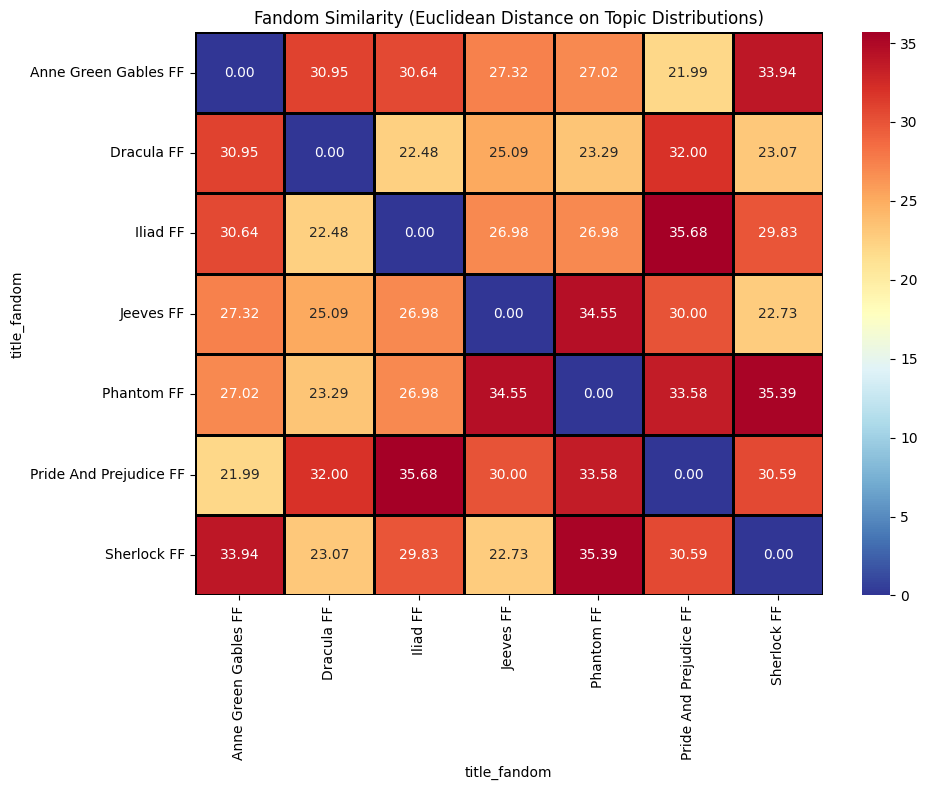

In [26]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform
from sklearn.preprocessing import StandardScaler

# === Load Dataset ===
data_df = pd.read_csv("/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv")
data_df["title_fandom"] = data_df["title_fandom"].str.strip()

# === Define Fandoms of Interest ===
selected_fandoms = [
    "Sherlock FF", "Phantom FF", "Iliad FF",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]

# Filter dataset
data_df = data_df[data_df["title_fandom"].isin(selected_fandoms)]

# === Compute Average Topic Distributions ===
topic_cols = [col for col in data_df.columns if col.startswith("Topic_")]
fandom_avg = data_df.groupby("title_fandom")[topic_cols].mean()

# === Standardize the Data ===
scaler = StandardScaler()
scaled_data = scaler.fit_transform(fandom_avg)

# Compute Euclidean distance matrix
dist_matrix = squareform(pdist(scaled_data, metric='euclidean'))
heatmap_df = pd.DataFrame(dist_matrix, index=fandom_avg.index, columns=fandom_avg.index)

# === High-Contrast Heatmap ===
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, fmt=".2f", cmap="RdYlBu_r", linewidths=1, linecolor="black")
plt.title("Fandom Similarity (Euclidean Distance on Topic Distributions)")
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/BERTTopic_Models_POS/fandom_similarity_heatmap_high_contrast.png")
plt.show()


Number of topics shared across all fandoms' top 40: 16

🔹 Topic: Topic_105 (done | enough | finished | finish | finishing | complete | quite | sure | eventually | completion | replied | say | see | goes | finality | comes | saying | seest | anyway | fully | seem | yet | let | comings | maybe | convinced | going | mastered | show | along)
  Sherlock FF: 0.00413
  Sherlock: 0.00424
  Pride And Prejudice: 0.00419
  Anne Green Gables: 0.00424
  Phantom: 0.00412
  Phantom FF: 0.00404
  Peter Pan: 0.00411
  Iliad FF: 0.00415
  Iliad: 0.00393
  Dracula: 0.00421
  Jeeves FF: 0.00419
  Dracula FF: 0.00407
  Anne Green Gables FF: 0.00417
  Pride And Prejudice FF: 0.00414

🔹 Topic: Topic_11 (stared | gazes | gazed | gaze | staring | stare | glances | stares | glanced | gazing | blinked | peered | sight | glancing | glared | glance | blankly | quizzically | peering | eye | looks | focused | noticed | intently | quizzical | look | eyeing | wondered | watched | realized)
  Sherlock FF: 0.00357
  She

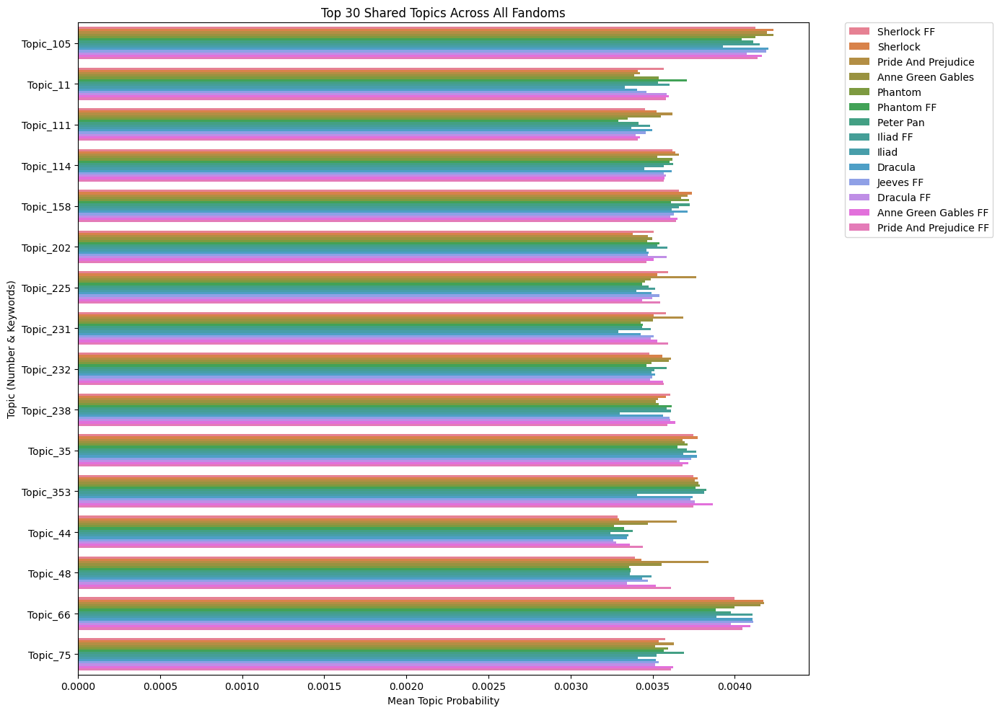

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/content/drive/MyDrive/BERTTopic_Models_POS/processed_novels_with_topic_probs.csv"
df = pd.read_csv(file_path)

# Clean 'title_fandom' column by stripping extra spaces
df["title_fandom"] = df["title_fandom"].str.strip()

# Load topics representation for topic-to-keyword mapping
topics_file = "/content/drive/MyDrive/BERTTopic_Models_POS/topics_representations.csv"
topics_df = pd.read_csv(topics_file, delimiter=",")  # Ensure correct delimiter
topics_df.columns = topics_df.columns.str.strip()  # Clean column names
topics_df["Topic_Number"] = topics_df["Topic_Number"].astype(str).str.strip()
topic_mapping = dict(zip(topics_df["Topic_Number"], topics_df["Topic_Representation"]))

# Step 1: Categorize Fanfiction vs. Original
df["text_category"] = df["title_fandom"].apply(lambda x: "fanfiction" if "FF" in x else "original")

# Step 2: List of all fandoms to analyze
selected_fandoms = [
    "Sherlock FF", "Sherlock", "Pride And Prejudice", "Anne Green Gables",
    "Phantom", "Phantom FF", "Peter Pan", "Iliad FF", "Iliad", "Dracula",
    "Jeeves FF", "Dracula FF", "Anne Green Gables FF", "Pride And Prejudice FF"
]

# Step 3: Extract relevant topic columns (assuming they start with "Topic_")
topic_cols = [col for col in df.columns if col.startswith("Topic_")]

# Step 4: Compute average topic probabilities for each fandom
fandom_topic_means = {}
for fandom in selected_fandoms:
    fandom_df = df[df["title_fandom"] == fandom]
    if not fandom_df.empty:
        fandom_topic_means[fandom] = fandom_df[topic_cols].mean()

# Convert to DataFrame for easier comparison (rows: topics, columns: fandoms)
fandom_topic_df = pd.DataFrame(fandom_topic_means)

# Step 5: Identify top 40 topics in each fandom
top_fandom_topics = {}
for fandom in selected_fandoms:
    if fandom in fandom_topic_df:
        top_fandom_topics[fandom] = set(fandom_topic_df[fandom].nlargest(40).index)

# Step 6: Find topics shared across all fandoms
shared_topics = set.intersection(*top_fandom_topics.values())
print("Number of topics shared across all fandoms' top 40:", len(shared_topics))

# Step 7: From the shared topics, choose the top 30 based on the overall average probability
# Compute the overall mean across fandoms for each shared topic
shared_topic_means = fandom_topic_df.loc[list(shared_topics)].mean(axis=1)
top30_shared_topics = shared_topic_means.nlargest(30).index

# Step 8: Prepare results: for each selected topic, gather topic representation and each fandom's probability
results = []
for topic in top30_shared_topics:
    topic_num = topic.split('_')[1]  # Extract the topic number from "Topic_x"
    topic_repr = topic_mapping.get(topic_num, "Unknown")
    row = {"Topic": topic, "Representation": topic_repr}
    for fandom in selected_fandoms:
        row[fandom] = fandom_topic_df.at[topic, fandom]
    results.append(row)

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by="Topic")  # sort if needed

# Step 9: Print the results in a nice format
for idx, row in results_df.iterrows():
    print(f"\n🔹 Topic: {row['Topic']} ({row['Representation']})")
    for fandom in selected_fandoms:
        print(f"  {fandom}: {row[fandom]:.5f}")

# Step 10: Plot the topic probabilities for each fandom in a grouped bar chart
# Reshape data for plotting
plot_df = results_df.melt(id_vars=["Topic", "Representation"],
                          value_vars=selected_fandoms,
                          var_name="Fandom", value_name="Probability")

plt.figure(figsize=(14, 10))
sns.barplot(data=plot_df, x="Probability", y="Topic", hue="Fandom")
plt.xlabel("Mean Topic Probability")
plt.ylabel("Topic (Number & Keywords)")
plt.title("Top 30 Shared Topics Across All Fandoms")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
from datetime import datetime

def print_with_time(message):
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# Define the path to your topics representations CSV file
output_path_topics = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv'

print_with_time(f"Loading topic representations from: {output_path_topics}")

# Load the CSV file into a DataFrame
df_topics = pd.read_csv(output_path_topics)

print_with_time("Topic representations loaded successfully.")

# Display the first few rows
print_with_time("Displaying the first few topic representations:")
print(df_topics.head())

# Display the last few rows
print_with_time("Displaying the last few topic representations:")
print(df_topics.tail())

# Get a concise summary of the DataFrame
print_with_time("DataFrame info:")
print(df_topics.info())

# Get the number of topics
num_topics = df_topics.shape[0]
print_with_time(f"Total number of topics: {num_topics}")

# Optionally, display specific topic representations
specific_topics = [0, 1, 5, 10]  # Replace with topic numbers of interest

print_with_time("Displaying specific topic representations:")
for topic_num in specific_topics:
    topic_row = df_topics[df_topics['Topic_Number'] == topic_num]
    if not topic_row.empty:
        representation = topic_row['Topic_Representation'].values[0]
        print(f"Topic {topic_num}: {representation}")
    else:
        print(f"Topic {topic_num} not found in the DataFrame.")

2024-11-13 17:46:51 - Loading topic representations from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv
2024-11-13 17:46:51 - Topic representations loaded successfully.
2024-11-13 17:46:51 - Displaying the first few topic representations:
   Topic_Number                               Topic_Representation
0             0  smile | smiled | smiles | grins | grin | grinn...
1             1  dinner | dinners | dining | meal | meals | din...
2             2  bed | bedroom | bedding | mattress | nightstan...
3             3  car | cars | suv | drove | vehicle | sedan | p...
4             4  never | always | none | neither | rarely | now...
2024-11-13 17:46:51 - Displaying the last few topic representations:
     Topic_Number                               Topic_Representation
211           211  charity | charities | charitable | fundraisers...
212           212  kick | kickboxing | kicking | kicks | kicked |...
213           213  comfortable | relax

# Assign Desriptive Names to Topics and Merge the DataFrames

In [ ]:
import pandas as pd
from datetime import datetime

def print_with_time(message):
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

In [ ]:
# Load the topics representations CSV file
topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv'
print_with_time(f"Loading topic representations from: {topics_path}")
df_topics = pd.read_csv(topics_path)
print_with_time("Topic representations loaded successfully.")

# Display the first few rows
print_with_time("Displaying the first few topic representations:")
print(df_topics.head())

2024-11-14 11:44:20 - Loading topic representations from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv
2024-11-14 11:44:20 - Topic representations loaded successfully.
2024-11-14 11:44:20 - Displaying the first few topic representations:
   Topic_Number                             Label  \
0             0  Expressions of Joy and Amusement   
1             1                  Dining and Meals   
2             2       Bedroom Setting and Comfort   
3             3          Cars and Luxury Vehicles   
4             4          Negation and Uncertainty   

                                Topic_Representation  
0  smile | smiled | smiles | grins | grin | grinn...  
1  dinner | dinners | dining | meal | meals | din...  
2  bed | bedroom | bedding | mattress | nightstan...  
3  car | cars | suv | drove | vehicle | sedan | p...  
4  never | always | none | neither | rarely | now...  


In [ ]:
# Load the processed novels with topic probabilities CSV file
novels_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/processed_novels_with_topic_probs.csv'
print_with_time(f"Loading processed novels with topic probabilities from: {novels_path}")
df_novels = pd.read_csv(novels_path)
print_with_time("Novels data loaded successfully.")

# Display the first few rows
print_with_time("Displaying the first few rows of the novels DataFrame:")
print(df_novels.head())

2024-11-14 11:44:20 - Loading processed novels with topic probabilities from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/processed_novels_with_topic_probs.csv
2024-11-14 11:44:42 - Novels data loaded successfully.
2024-11-14 11:44:42 - Displaying the first few rows of the novels DataFrame:
     Author               Book Title  Chapter  \
0  Ann_Cole  Mr. Mysterious In Black        1   
1  Ann_Cole  Mr. Mysterious In Black        1   
2  Ann_Cole  Mr. Mysterious In Black        1   
3  Ann_Cole  Mr. Mysterious In Black        1   
4  Ann_Cole  Mr. Mysterious In Black        1   

                                            Sentence  Assigned_Topic  \
0                            Prologue H e was tired.             210   
1                                         Dog-tired.             210   
2  Amped up by pleasure mere minutes ago, his hea...             175   
3  Unfortunately, he was yanked back from the bec...              23   
4  Languid, he opened his eyes to

In [ ]:
# Ensure the 'Assigned_Topic' in df_novels and 'Topic_Number' in df_topics are of the same data type
df_novels['Assigned_Topic'] = df_novels['Assigned_Topic'].astype(int)
df_topics['Topic_Number'] = df_topics['Topic_Number'].astype(int)

# Merge df_novels with df_topics on 'Assigned_Topic' and 'Topic_Number'
print_with_time("Merging the DataFrames on 'Assigned_Topic' and 'Topic_Number'.")
df_merged = df_novels.merge(
    df_topics[['Topic_Number', 'Label', 'Topic_Representation']],
    left_on='Assigned_Topic',
    right_on='Topic_Number',
    how='left'
)

# Drop 'Topic_Number' as it's redundant after merging
df_merged.drop(columns=['Topic_Number'], inplace=True)

2024-11-14 11:44:42 - Merging the DataFrames on 'Assigned_Topic' and 'Topic_Number'.


In [ ]:
# Check for any missing labels after the merge
missing_labels = df_merged[df_merged['Label'].isnull()]
if not missing_labels.empty:
    print_with_time("Warning: Some 'Assigned_Topic' values did not match any 'Topic_Number' in the topics DataFrame.")
    print(missing_labels['Assigned_Topic'].unique())
else:
    print_with_time("All 'Assigned_Topic' values successfully matched with 'Topic_Number'.")

# Display the first few rows of the merged DataFrame
print_with_time("Displaying the first few rows of the merged DataFrame:")
print(df_merged.head())

2024-11-14 11:44:42 - All 'Assigned_Topic' values successfully matched with 'Topic_Number'.
2024-11-14 11:44:42 - Displaying the first few rows of the merged DataFrame:
     Author               Book Title  Chapter  \
0  Ann_Cole  Mr. Mysterious In Black        1   
1  Ann_Cole  Mr. Mysterious In Black        1   
2  Ann_Cole  Mr. Mysterious In Black        1   
3  Ann_Cole  Mr. Mysterious In Black        1   
4  Ann_Cole  Mr. Mysterious In Black        1   

                                            Sentence  Assigned_Topic  \
0                            Prologue H e was tired.             210   
1                                         Dog-tired.             210   
2  Amped up by pleasure mere minutes ago, his hea...             175   
3  Unfortunately, he was yanked back from the bec...              23   
4  Languid, he opened his eyes to the annoying re...              12   

    Topic_0   Topic_1   Topic_2   Topic_3   Topic_4  ...  Topic_208  \
0  0.004258  0.004673  0.008873 

In [ ]:
# Save the merged DataFrame to a new CSV file
merged_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/merged_novels_with_labels.csv'
print_with_time(f"Saving the merged DataFrame to: {merged_path}")
df_merged.to_csv(merged_path, index=False)
print_with_time("Merged DataFrame saved successfully.")

2024-11-14 11:44:42 - Saving the merged DataFrame to: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/merged_novels_with_labels.csv
2024-11-14 11:47:11 - Merged DataFrame saved successfully.


In [ ]:
print_with_time("Data types of the merged DataFrame:")
print(df_merged.dtypes)

print_with_time("Checking for missing values in the merged DataFrame:")
print(df_merged.isnull().sum())

print_with_time("Sample data with assigned labels:")
print(df_merged[['Author', 'Book Title', 'Sentence', 'Assigned_Topic', 'Label']].head(10))

print_with_time("Topic distribution after merging:")
topic_counts = df_merged['Label'].value_counts()
print(topic_counts)

2024-11-14 11:47:11 - Data types of the merged DataFrame:
Author                   object
Book Title               object
Chapter                   int64
Sentence                 object
Assigned_Topic            int64
                         ...   
Topic_213               float64
Topic_214               float64
Topic_215               float64
Label                    object
Topic_Representation     object
Length: 223, dtype: object
2024-11-14 11:47:11 - Checking for missing values in the merged DataFrame:
Author                  0
Book Title              0
Chapter                 0
Sentence                0
Assigned_Topic          0
                       ..
Topic_213               0
Topic_214               0
Topic_215               0
Label                   0
Topic_Representation    0
Length: 223, dtype: int64
2024-11-14 11:47:11 - Sample data with assigned labels:
     Author               Book Title  \
0  Ann_Cole  Mr. Mysterious In Black   
1  Ann_Cole  Mr. Mysterious In Black   


In [ ]:
import matplotlib.pyplot as plt

# Plot the top 20 topics
top_topics = topic_counts.head(20)
top_topics.plot(kind='barh', figsize=(10, 8))
plt.xlabel('Number of Sentences')
plt.ylabel('Topic Label')
plt.title('Top 20 Topics by Sentence Count')
plt.gca().invert_yaxis()  # To display the highest values on top
plt.show()

NameError: name 'topic_counts' is not defined

# Address Class Imbalance with Weighting

In [ ]:
!pip install --upgrade pandas numpy seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 106.4 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.10.1 requires pandas<2.2.3dev0,>=2.0, but you have pandas 2.2.3 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.


In [ ]:
!pip install pandas==2.2.2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 85.9 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.3
    Uninstalling pandas-2.2.3:
      Successfully uninstalled pandas-2.2.3


In [ ]:
# Import necessary libraries
import pandas as pd
import re
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import warnings
from pandas.errors import PerformanceWarning

# Function to print messages with timestamps
def print_with_time(message):
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# Suppress PerformanceWarnings temporarily (if necessary)
warnings.simplefilter(action='ignore', category=PerformanceWarning)

# Set display options for pandas
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

# 1. Load the merged DataFrame (unweighted topics)
merged_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/merged_novels_with_labels.csv'
print_with_time(f"Loading merged DataFrame from: {merged_path}")
df = pd.read_csv(merged_path)
print_with_time("Data loaded successfully.")

# 2. Reconfirm and redefine topic_columns to exclude any potential hidden characters
topic_columns = [col.strip() for col in df.columns if re.match(r'^Topic_\d+$', col.strip())]
print_with_time(f"Redefined {len(topic_columns)} topic probability columns after loading.")
print("Sample of topic columns:", topic_columns[:10])  # Display first 10 for verification

# 3. Ensure all topic_columns are numeric, coercing errors to NaN and filling with 0
df[topic_columns] = df[topic_columns].apply(pd.to_numeric, errors='coerce').fillna(0).astype(float)
print_with_time("Ensured all topic columns are of type float.")

# 4. Check for non-numeric entries in topic_columns
for col in topic_columns:
    if not pd.api.types.is_numeric_dtype(df[col]):
        print_with_time(f"Non-numeric dtype detected in column: {col}")
        print(df[col].unique())
    else:
        # Additionally, check if any non-finite numbers exist
        if not np.all(np.isfinite(df[col])):
            print_with_time(f"Non-finite values detected in column: {col}")
            print(df[col].unique())
print_with_time("Completed inspection of topic columns for anomalies.")

# 5. Calculate mean topic probabilities per book (unweighted)
df_book_topics = df.groupby('Book Title')[topic_columns].mean().reset_index()
print_with_time("Calculated mean topic probabilities per book (unweighted).")

# 6. Normalize topic probabilities per book (unweighted) using vectorized operations
topic_sums_unweighted = df_book_topics[topic_columns].sum(axis=1)
df_book_topics[topic_columns] = df_book_topics[topic_columns].div(topic_sums_unweighted, axis=0).fillna(0)
print_with_time("Normalized topic probabilities per book (unweighted).")

# 7. Defragment the DataFrame to improve performance
df_book_topics = df_book_topics.copy()
print_with_time("Defragmented the DataFrame to improve performance.")

# 8. Verify normalization
df_book_topics['Total_Probability'] = df_book_topics[topic_columns].sum(axis=1)
print_with_time("Verifying normalization (unweighted):")
print(df_book_topics[['Book Title', 'Total_Probability']].head())

# 9. Adjusting for Class Imbalance with Weighting
# 9.1 Calculate topic frequencies
topic_counts = df['Label'].value_counts().reset_index()
topic_counts.columns = ['Label', 'Count']
print_with_time("Calculated topic frequencies across the dataset.")

# 9.2 Total number of samples
total_samples = len(df)

# 9.3 Calculate class weights
# To prevent overcompensation, we can cap the maximum weight
max_weight = 3  # Adjust as needed
topic_counts['Class_Weight'] = np.minimum(
    total_samples / (len(topic_counts) * topic_counts['Count']),
    max_weight
)
print_with_time("Calculated class weights for each topic with a maximum cap.")

# 9.4 Create a mapping dictionary
class_weight_mapping = dict(zip(topic_counts['Label'], topic_counts['Class_Weight']))

# 9.5 Load the topics and labels
topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv'
df_topics = pd.read_csv(topics_path)

# Ensure that Topic_Number is a string for mapping
df_topics['Topic_Number'] = df_topics['Topic_Number'].astype(str)

# Create a dictionary mapping topic numbers to labels
topic_labels = dict(zip(df_topics['Topic_Number'], df_topics['Label']))

# Create a mapping from 'Topic_X' to labels
topic_label_mapping = {col: topic_labels.get(col.split('_')[1], col) for col in topic_columns}

# Check if all topics have corresponding labels
missing_mappings = [col for col, label in topic_label_mapping.items() if label == col]
if missing_mappings:
    print_with_time("Warning: The following topics do not have corresponding labels and are mapped to themselves:")
    print(missing_mappings)
else:
    print_with_time("All topics have corresponding labels.")

# 10. Ensure 'Assigned_Topic' column exists and is numeric
if 'Assigned_Topic' not in df.columns:
    raise ValueError("The DataFrame does not contain an 'Assigned_Topic' column.")
df['Assigned_Topic'] = pd.to_numeric(df['Assigned_Topic'], errors='coerce').fillna(-1).astype(int)

# 11. Defragment the DataFrame before bulk assignments to minimize fragmentation
df_weighted = df.copy()
print_with_time("Defragmented the DataFrame to improve performance before bulk assignments.")

# 12. Bulk assignment of multiple columns using assign
print_with_time("Applying class weights and creating related columns in bulk using `assign`.")
df_weighted = df_weighted.assign(
    Class_Weight=df_weighted['Label'].map(class_weight_mapping),
    Assigned_Label=df_weighted['Assigned_Topic'].map(lambda x: topic_label_mapping.get(f'Topic_{x}', None))
).assign(
    Assigned_Class_Weight=lambda x: x['Assigned_Label'].map(class_weight_mapping).fillna(1)
)
print_with_time("Applied class weights and created related columns in bulk.")

# 13. Create a mask DataFrame using vectorized comparison
print_with_time("Creating mask DataFrame using vectorized comparison.")
topic_numbers = [int(col.split('_')[1]) for col in topic_columns]
mask_array = (df_weighted['Assigned_Topic'].values[:, None] == topic_numbers).astype(float)
mask_df = pd.DataFrame(mask_array, columns=topic_columns)

# 14. Multiply mask_df by the Class_Weight
print_with_time("Multiplying mask_df by the Class_Weight.")
weighted_mask_df = mask_df.multiply(df_weighted['Class_Weight'], axis=0)

# 15. Multiply the topic probabilities by the weighted mask
print_with_time("Multiplying the topic probabilities by the weighted mask.")
df_weighted[topic_columns] = df_weighted[topic_columns].multiply(weighted_mask_df)

# 16. Drop intermediate class weight columns if any
columns_to_drop = ['Class_Weight', 'Assigned_Label', 'Assigned_Class_Weight']
df_weighted.drop(columns=[col for col in columns_to_drop if col in df_weighted.columns], inplace=True)
print_with_time("Dropped intermediate class weight columns.")

# 17. Calculate weighted mean topic probabilities per book
df_weighted_book_topics = df_weighted.groupby('Book Title')[topic_columns].mean().reset_index()
print_with_time("Calculated weighted mean topic probabilities per book.")

# 18. Normalize weighted topic probabilities per book using vectorized operations
topic_sums_weighted = df_weighted_book_topics[topic_columns].sum(axis=1)
df_weighted_book_topics[topic_columns] = df_weighted_book_topics[topic_columns].div(topic_sums_weighted, axis=0).fillna(0)
print_with_time("Normalized weighted topic probabilities per book.")

# 19. Defragment the DataFrame after bulk modifications
df_weighted_book_topics = df_weighted_book_topics.copy()
print_with_time("Defragmented the weighted DataFrame to improve performance.")

# 20. Verify normalization after weighting
df_weighted_book_topics['Total_Probability'] = df_weighted_book_topics[topic_columns].sum(axis=1)
print_with_time("Verifying normalization after weighting:")
print(df_weighted_book_topics[['Book Title', 'Total_Probability']].head())

# 21. Save the weighted topic probabilities per book to CSV
output_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/book_topics_weighted.csv'
df_weighted_book_topics.to_csv(output_path, index=False, float_format='%.6f')
print_with_time(f"Saved weighted topic probabilities per book to: {output_path}")

# 22. Load the weighted topic probabilities per book for analysis
print_with_time(f"Loading weighted topic probabilities from: {output_path}")
df_weighted_book_topics = pd.read_csv(output_path)
print_with_time("Weighted topic probabilities loaded successfully.")

# 23. Redefine topic_columns based on the loaded DataFrame
topic_columns = [col.strip() for col in df_weighted_book_topics.columns if re.match(r'^Topic_\d+$', col.strip())]
print_with_time(f"Redefined {len(topic_columns)} topic probability columns after loading.")
print("Sample of topic columns after reloading:", topic_columns[:10])  # Display first 10 for verification

# 24. Ensure topic columns are numeric
df_weighted_book_topics[topic_columns] = df_weighted_book_topics[topic_columns].apply(pd.to_numeric, errors='coerce').fillna(0).astype(float)
print_with_time("Ensured all topic columns are of type float after loading.")

# 25. Confirm data types are numeric
print_with_time("Data types of topic columns in weighted DataFrame:")
print(df_weighted_book_topics[topic_columns].dtypes)

# 26. Check for any non-numeric or non-finite values in topic columns
print_with_time("Checking for any non-numeric or non-finite values in topic columns:")

# Verify all dtypes are numeric
dtypes_correct = df_weighted_book_topics[topic_columns].dtypes.apply(lambda x: pd.api.types.is_numeric_dtype(x)).all()
if dtypes_correct:
    print_with_time("All topic columns have numeric dtypes.")
else:
    print_with_time("Some topic columns do not have numeric dtypes. Investigating further...")
    # Identify which columns are not numeric
    non_numeric_cols = df_weighted_book_topics[topic_columns].columns[~df_weighted_book_topics[topic_columns].dtypes.apply(pd.api.types.is_numeric_dtype)]
    print_with_time(f"Non-numeric columns: {non_numeric_cols.tolist()}")

# Check for non-finite values (inf, -inf, NaN)
non_finite = ~np.isfinite(df_weighted_book_topics[topic_columns]).all()
if non_finite.any():
    print_with_time("Non-finite values detected in some topic columns.")
    # Optionally, handle non-finite values
    df_weighted_book_topics[topic_columns] = df_weighted_book_topics[topic_columns].replace([np.inf, -np.inf], np.nan).fillna(0)
    print_with_time("Replaced non-finite values with 0.")
else:
    print_with_time("All topic columns contain finite numeric values.")

# 27. Define the get_top_topics function with enhanced data handling
def get_top_topics(row, n=5):
    try:
        # Extract topic values and ensure they are floats
        topic_values = row[topic_columns].astype(float)

        # Get the top n topics
        top_topics = topic_values.nlargest(n)

        # Map topic columns to labels
        top_topics_labels = [topic_label_mapping.get(col, col) for col in top_topics.index]

        # Return as a list of tuples (label, probability)
        return list(zip(top_topics_labels, top_topics.values))
    except Exception as e:
        print_with_time(f"Error processing row: {row['Book Title']}. Error: {e}")
        return []

# 28. Apply the get_top_topics function to create 'Top_Topics' column using list comprehension
print_with_time("Applying 'get_top_topics' function to create 'Top_Topics' column using list comprehension.")
top_topics_list = [
    get_top_topics(row, n=5) for _, row in df_weighted_book_topics.iterrows()
]
df_weighted_book_topics['Top_Topics'] = top_topics_list
print_with_time("Successfully created 'Top_Topics' column using list comprehension.")

# 29. Display the top 5 topics for the first few books
print_with_time("Displaying top 5 topics for the first few books:")
for idx, row in df_weighted_book_topics.head().iterrows():
    print(f"Book Title: {row['Book Title']}")
    for i, (label, prob) in enumerate(row['Top_Topics'], 1):
        print(f"  Top {i} Topic: {label} (Probability: {prob:.6f})")
    print()

# 30. Vectorized approach to get top 5 topics per book (Optional)
print_with_time("Applying vectorized approach to create 'Top_Topics_Vectorized' column.")

# Get the indices of the top 5 topics per row
top_n = 5
top_topics_indices = df_weighted_book_topics[topic_columns].apply(lambda row: row.nlargest(top_n).index, axis=1)

# Get the corresponding probabilities
top_topics_values = df_weighted_book_topics[topic_columns].apply(lambda row: row.nlargest(top_n).values, axis=1)

# Map topic columns to labels and combine with probabilities
top_topics_vectorized = [
    list(zip([topic_label_mapping.get(col, col) for col in cols], probs))
    for cols, probs in zip(top_topics_indices, top_topics_values)
]

# Create a new Series for 'Top_Topics_Vectorized'
top_topics_vectorized_series = pd.Series(top_topics_vectorized, name='Top_Topics_Vectorized')

# Concatenate the new column to the DataFrame in one operation
df_weighted_book_topics = pd.concat([df_weighted_book_topics, top_topics_vectorized_series], axis=1)

print_with_time("Successfully created 'Top_Topics_Vectorized' column using vectorized approach.")

# Replace 'Top_Topics' with 'Top_Topics_Vectorized' column to maintain consistency
df_weighted_book_topics['Top_Topics'] = df_weighted_book_topics['Top_Topics_Vectorized']
df_weighted_book_topics.drop(columns=['Top_Topics_Vectorized'], inplace=True)
print_with_time("Replaced 'Top_Topics' with 'Top_Topics_Vectorized' column.")

# 31. Inspect a specific row to identify hidden issues
sample_row = df_weighted_book_topics.iloc[0]
print_with_time(f"Sample row data for '{sample_row['Book Title']}':")
print("Dtypes:", sample_row[topic_columns].dtypes)
print("Values:", sample_row[topic_columns])

# 32. Remove any non-printable characters from topic columns (if necessary)
print_with_time("Cleaning topic columns by removing non-numeric characters (if necessary).")
for col in topic_columns:
    # Convert to string, remove non-digit and non-period characters, then convert back to float
    df_weighted_book_topics[col] = df_weighted_book_topics[col].astype(str).str.replace(r'[^\d\.]', '', regex=True)
    df_weighted_book_topics[col] = pd.to_numeric(df_weighted_book_topics[col], errors='coerce').fillna(0).astype(float)

print_with_time("Cleaned topic columns by removing non-numeric characters.")

# 33. Reapply the get_top_topics function after cleaning using list comprehension
print_with_time("Reapplying 'get_top_topics' function after cleaning using list comprehension.")
top_topics_list_cleaned = [
    get_top_topics(row, n=5) for _, row in df_weighted_book_topics.iterrows()
]
df_weighted_book_topics['Top_Topics'] = top_topics_list_cleaned
print_with_time("Successfully created 'Top_Topics' column after cleaning.")

# 34. Final Display of Top Topics
print_with_time("Final display of top 5 topics for the first few books:")
for idx, row in df_weighted_book_topics.head().iterrows():
    print(f"Book Title: {row['Book Title']}")
    for i, (label, prob) in enumerate(row['Top_Topics'], 1):
        print(f"  Top {i} Topic: {label} (Probability: {prob:.6f})")
    print()

2024-11-14 13:36:22 - Loading merged DataFrame from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/merged_novels_with_labels.csv
2024-11-14 13:36:42 - Data loaded successfully.
2024-11-14 13:36:42 - Redefined 216 topic probability columns after loading.
Sample of topic columns: ['Topic_0', 'Topic_1', 'Topic_2', 'Topic_3', 'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8', 'Topic_9']
2024-11-14 13:36:43 - Ensured all topic columns are of type float.
2024-11-14 13:36:43 - Completed inspection of topic columns for anomalies.
2024-11-14 13:36:44 - Calculated mean topic probabilities per book (unweighted).
2024-11-14 13:36:44 - Normalized topic probabilities per book (unweighted).
2024-11-14 13:36:44 - Defragmented the DataFrame to improve performance.
2024-11-14 13:36:44 - Verifying normalization (unweighted):
                              Book Title  Total_Probability
0                     A Long Time Coming                1.0
1                     A Not So Meet Cute

# Comparative Statistical Analysis for Unweighted vs Weighted Topics

In [ ]:
# -----------------------------------------
# Corrected Comprehensive Script for Merging DataFrames
# -----------------------------------------

# Import necessary libraries
import pandas as pd
import numpy as np
import re
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import warnings
from pandas.errors import PerformanceWarning
from statsmodels.stats.multitest import multipletests
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import os

# Function to print messages with timestamps
def print_with_time(message):
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# Suppress PerformanceWarnings temporarily (if necessary)
warnings.simplefilter(action='ignore', category=PerformanceWarning)

# Set display options for pandas
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

# -----------------------------------------
# 1. Load and Inspect the DataFrames
# -----------------------------------------

# Paths to your CSV files
unweighted_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/merged_novels_with_labels.csv'
weighted_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/book_topics_weighted.csv'

# Load the DataFrames
print_with_time(f"Loading unweighted DataFrame from: {unweighted_path}")
df_unweighted = pd.read_csv(unweighted_path)
print_with_time("Unweighted DataFrame loaded successfully.")

print_with_time(f"Loading weighted DataFrame from: {weighted_path}")
df_weighted = pd.read_csv(weighted_path)
print_with_time("Weighted DataFrame loaded successfully.\n")

# Display basic information about the DataFrames
print("Unweighted DataFrame Shape:", df_unweighted.shape)
print("Weighted DataFrame Shape:", df_weighted.shape, "\n")

print("Unweighted Columns Sample:", df_unweighted.columns[:10].tolist(), "\n")
print("Weighted Columns Sample:", df_weighted.columns[:10].tolist(), "\n")

# -----------------------------------------
# 2. Identify Topic Columns Using Correct Regex Patterns
# -----------------------------------------

# Corrected regex patterns to match 'Topic_X'
topic_cols_unweighted = [col for col in df_unweighted.columns if re.match(r'^Topic_\d+$', col)]
topic_cols_weighted = [col for col in df_weighted.columns if re.match(r'^Topic_\d+$', col)]

print_with_time(f"Identified {len(topic_cols_unweighted)} unweighted topic columns.")
print_with_time(f"Identified {len(topic_cols_weighted)} weighted topic columns.\n")

# Verify that unweighted and weighted topics have the same base topics
base_unweighted = set([col.replace('_unweighted', '') for col in topic_cols_unweighted])
base_weighted = set([col.replace('_weighted', '') for col in topic_cols_weighted])

common_topics = sorted(list(base_unweighted.intersection(base_weighted)), key=lambda x: int(x.split('_')[1]))
print_with_time(f"Total Common Base Topics: {len(common_topics)}")
print(f"First 10 Sorted Topic Names: {common_topics[:10]}\n")

# -----------------------------------------
# 3. Align and Merge DataFrames Correctly
# -----------------------------------------

# Ensure both DataFrames have the same 'Book Title' entries
print_with_time("Verifying unique 'Book Title' counts in both DataFrames.")

unique_books_unweighted = df_unweighted['Book Title'].nunique()
unique_books_weighted = df_weighted['Book Title'].nunique()

print(f"Unique Books in Unweighted DataFrame: {unique_books_unweighted}")
print(f"Unique Books in Weighted DataFrame: {unique_books_weighted}\n")

# If unweighted DataFrame has multiple entries per 'Book Title', aggregate them
if unique_books_unweighted != df_unweighted.shape[0]:
    print_with_time("Aggregating unweighted DataFrame to have one entry per 'Book Title' by taking the mean of topic probabilities.")
    df_unweighted_agg = df_unweighted.groupby('Book Title')[topic_cols_unweighted].mean().reset_index()
    print_with_time(f"Aggregated Unweighted DataFrame Shape: {df_unweighted_agg.shape}\n")
else:
    df_unweighted_agg = df_unweighted.copy()

# Similarly, ensure weighted DataFrame has one entry per 'Book Title'
if unique_books_weighted != df_weighted.shape[0]:
    print_with_time("Aggregating weighted DataFrame to have one entry per 'Book Title' by taking the mean of topic probabilities.")
    df_weighted_agg = df_weighted.groupby('Book Title')[topic_cols_weighted].mean().reset_index()
    print_with_time(f"Aggregated Weighted DataFrame Shape: {df_weighted_agg.shape}\n")
else:
    df_weighted_agg = df_weighted.copy()

# Select only the common topics for merging
df_unweighted_selected = df_unweighted_agg[['Book Title'] + common_topics]
df_weighted_selected = df_weighted_agg[['Book Title'] + common_topics]

print_with_time("Selected common topics for merging in both DataFrames.")

# Perform a left join to merge weighted data into unweighted data
print_with_time("Merging DataFrames with suffixes '_unweighted' and '_weighted'.")
df_merged = pd.merge(
    df_unweighted_selected,
    df_weighted_selected,
    on='Book Title',
    how='left',
    suffixes=('_unweighted', '_weighted')
)
print_with_time("DataFrames merged successfully.\n")

# Display the shape of the merged DataFrame
print("Merged DataFrame Shape:", df_merged.shape)

# Display the number of unique books in both DataFrames
print("Unique Books in Merged DataFrame:", df_merged['Book Title'].nunique(), "\n")

# Ensure that the number of unique books matches
assert df_unweighted_selected['Book Title'].nunique() == df_weighted_selected['Book Title'].nunique() == df_merged['Book Title'].nunique(), "Mismatch in unique Book Titles after merge."

# Save the Merged DataFrame as a CSV file (optional)
output_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/merged_dataframe_corrected.csv'
df_merged.to_csv(output_path, index=False)
print_with_time(f"✅ Merged DataFrame saved to {output_path}\n")

# Display a sample row
print("Sample Merged DataFrame Row:")
print(df_merged.head(1), "\n")

# -----------------------------------------
# 4. Identify and Resolve Weighted Columns Duplication
# -----------------------------------------

# Since the initial merging was based on corrected regex, there should be no duplicated weighted columns.
# However, to ensure data integrity, we'll perform the following checks.

# Function to identify all weighted columns per base topic
def identify_weighted_columns(df, common_topics):
    """
    Identifies all weighted columns for each base topic.

    Parameters:
    - df: pandas DataFrame
    - common_topics: list of base topic names

    Returns:
    - base_topic_to_weighted_cols: dict mapping base topics to their weighted columns
    """
    base_topic_to_weighted_cols = {}
    for topic in common_topics:
        weighted_col = f"{topic}_weighted"
        if weighted_col in df.columns:
            base_topic_to_weighted_cols[topic] = [weighted_col]
    return base_topic_to_weighted_cols

# Identify all weighted columns per base topic
base_topic_to_weighted_cols = identify_weighted_columns(df_merged, common_topics)

# Check if any base topic has multiple weighted columns
from collections import defaultdict

# Extract all columns that start with 'Topic_X_weighted' where X is the topic number
additional_weighted_cols = [col for col in df_merged.columns if re.match(r'^Topic_\d+_weighted(_\d+)?$', col)]

# Create a mapping from base topic to all its weighted columns
base_topic_to_all_weighted_cols = defaultdict(list)

for col in additional_weighted_cols:
    match = re.match(r'^(Topic_\d+)_weighted(?:_(\d+))?$', col)
    if match:
        base_topic = match.group(1)
        base_topic_to_all_weighted_cols[base_topic].append(col)

# Identify topics with duplicated weighted columns
duplicate_weighted_topics = {topic: cols for topic, cols in base_topic_to_all_weighted_cols.items() if len(cols) > 1}

print_with_time(f"Total Topics with Duplicate Weighted Columns: {len(duplicate_weighted_topics)}\n")
for topic, cols in list(duplicate_weighted_topics.items())[:10]:  # Display first 10 for brevity
    print(f"{topic}: {cols}")
print("\n")

# Function to check if duplicated weighted columns are identical
def check_identical_weighted_columns(df, duplicate_weighted_topics):
    """
    Checks if duplicated weighted columns for each topic are identical.

    Parameters:
    - df: pandas DataFrame
    - duplicate_weighted_topics: dict mapping topics to their duplicated weighted columns

    Returns:
    - identical_topics: list of topics where duplicated weighted columns are identical
    - non_identical_topics: list of topics where duplicated weighted columns are NOT identical
    """
    identical_topics = []
    non_identical_topics = []

    for topic, cols in duplicate_weighted_topics.items():
        first_col = df[cols[0]]
        is_identical = True
        for col in cols[1:]:
            if not first_col.equals(df[col]):
                is_identical = False
                break
        if is_identical:
            identical_topics.append(topic)
        else:
            non_identical_topics.append(topic)

    return identical_topics, non_identical_topics

# Check for identical duplicated weighted columns
identical_topics, non_identical_topics = check_identical_weighted_columns(df_merged, duplicate_weighted_topics)

print_with_time(f"Topics with Identical Duplicate Weighted Columns: {len(identical_topics)}")
print(f"Topics with Non-Identical Duplicate Weighted Columns: {len(non_identical_topics)}\n")

# Function to remove duplicate weighted columns if they are identical
def remove_identical_duplicate_weighted_columns(df, identical_topics, duplicate_weighted_topics):
    """
    Removes duplicate weighted columns for topics where duplicates are identical.

    Parameters:
    - df: pandas DataFrame
    - identical_topics: list of topics with identical duplicated weighted columns
    - duplicate_weighted_topics: dict mapping topics to their duplicated weighted columns

    Returns:
    - df: pandas DataFrame with duplicates removed
    """
    for topic in identical_topics:
        cols = duplicate_weighted_topics[topic]
        # Keep the first column, drop the rest
        cols_to_drop = cols[1:]
        df.drop(columns=cols_to_drop, inplace=True)
        print(f"✅ Removed duplicate weighted columns for {topic}: {cols_to_drop}")
    print("\n")
    return df

# Remove duplicate weighted columns if they are identical
df_merged = remove_identical_duplicate_weighted_columns(df_merged, identical_topics, duplicate_weighted_topics)

# -----------------------------------------
# 5. Reconstruct the Weighted Topics List
# -----------------------------------------

# Re-identify weighted topics after removal
weighted_topics = [col for col in df_merged.columns if col.endswith('_weighted')]

print_with_time(f"🔄 Updated Total Weighted Topics: {len(weighted_topics)}")
print(f"First 10 Weighted Topics: {weighted_topics[:10]}\n")

# -----------------------------------------
# 6. Handle Non-Identical Duplicated Weighted Columns
# -----------------------------------------

if non_identical_topics:
    print_with_time("⚠️ Topics with Non-Identical Duplicated Weighted Columns Found:\n")
    for topic in non_identical_topics:
        cols = duplicate_weighted_topics[topic]
        print(f"{topic}: {cols}")
        print("Sample Data:")
        display(df_merged[cols].head(2))
        print("-" * 50 + "\n")
    print("🔍 Manual inspection is required for the above topics to determine the cause of duplication.\n")
else:
    print("✅ All duplicated weighted columns are identical. No further action required.\n")

# -----------------------------------------
# 7. Final Verification
# -----------------------------------------

# Verify that the number of weighted topics now matches the number of base topics
print(f"Final Verification:")
print(f"Total Weighted Topics: {len(weighted_topics)}")
print(f"Total Base Topics: {len(common_topics)}\n")

assert len(weighted_topics) == len(common_topics), "Mismatch between number of weighted topics and base topics."

print("✅ Verification successful: Number of weighted topics matches the number of base topics.\n")

2024-11-14 21:08:18 - Loading unweighted DataFrame from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/merged_novels_with_labels.csv
2024-11-14 21:08:38 - Unweighted DataFrame loaded successfully.
2024-11-14 21:08:38 - Loading weighted DataFrame from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/book_topics_weighted.csv
2024-11-14 21:08:38 - Weighted DataFrame loaded successfully.

Unweighted DataFrame Shape: (680822, 223)
Weighted DataFrame Shape: (105, 218) 

Unweighted Columns Sample: ['Author', 'Book Title', 'Chapter', 'Sentence', 'Assigned_Topic', 'Topic_0', 'Topic_1', 'Topic_2', 'Topic_3', 'Topic_4'] 

Weighted Columns Sample: ['Book Title', 'Topic_0', 'Topic_1', 'Topic_2', 'Topic_3', 'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8'] 

2024-11-14 21:08:38 - Identified 216 unweighted topic columns.
2024-11-14 21:08:38 - Identified 216 weighted topic columns.

2024-11-14 21:08:38 - Total Common Base Topics: 216
First 10 Sorted Topic Names: 

In [ ]:
# Check the distribution of 'Book Title' in the unweighted DataFrame
book_counts = df_unweighted['Book Title'].value_counts()
print(book_counts.head())

Book Title
The Billionaire's Secret             14697
The Billionaire's Christmas Bride    13977
The Takeover                         12715
The Stopover                         12668
The Billionaire's Fake Wife          11417
Name: count, dtype: int64


In [ ]:
from scipy.stats import skew, kurtosis

# Initialize lists to store skewness and kurtosis results
skewness_values = []
kurtosis_values = []

# Calculate skewness and kurtosis for each topic
for topic in common_topics:
    unweighted = df_merged[f'{topic}_unweighted']
    weighted = df_merged[f'{topic}_weighted']
    differences = weighted - unweighted

    skew_val = skew(differences, nan_policy='omit')
    kurt_val = kurtosis(differences, nan_policy='omit')  # Excess kurtosis

    skewness_values.append(skew_val)
    kurtosis_values.append(kurt_val)

# Create a DataFrame for skewness and kurtosis results
statistical_measures = pd.DataFrame({
    'Topic': common_topics,
    'Skewness': skewness_values,
    'Kurtosis': kurtosis_values
})

print("Skewness and Kurtosis Results (First 10 Topics):")
print(statistical_measures.head(10))

Skewness and Kurtosis Results (First 10 Topics):
     Topic  Skewness  Kurtosis
0  Topic_0  1.108180  0.658507
1  Topic_1  0.762523  0.230226
2  Topic_2  0.909890  1.002999
3  Topic_3  1.195342  1.386944
4  Topic_4  0.628740 -0.137130
5  Topic_5  0.361175 -0.023333
6  Topic_6  2.146059  5.432417
7  Topic_7  1.253058  2.662022
8  Topic_8  0.570431  0.633312
9  Topic_9  1.485752  3.075163


In [ ]:
from scipy.stats import ttest_rel
from numpy import sqrt

# Initialize lists to store test results
test_used = []
test_statistic = []
test_p_values = []
cohen_d_values = []

# Calculate mean differences for effect size
mean_diffs = []
std_diffs = []

for topic in common_topics:
    unweighted = df_merged[f'{topic}_unweighted']
    weighted = df_merged[f'{topic}_weighted']
    differences = weighted - unweighted

    # Perform paired t-test
    stat, p_val = ttest_rel(weighted, unweighted, nan_policy='omit')
    test_used.append('Paired t-test')
    test_statistic.append(stat)
    test_p_values.append(p_val)

    # Calculate mean and standard deviation of differences
    mean_diff = differences.mean()
    std_diff = differences.std(ddof=1)
    mean_diffs.append(mean_diff)
    std_diffs.append(std_diff)

    # Calculate Cohen's d
    if std_diff != 0:
        cohen_d = mean_diff / std_diff
    else:
        cohen_d = np.nan
    cohen_d_values.append(cohen_d)

# Add test results to the DataFrame
statistical_measures['Test_Used'] = test_used
statistical_measures['Test_Statistic'] = test_statistic
statistical_measures['P_Value'] = test_p_values
statistical_measures['Mean_Difference'] = mean_diffs
statistical_measures['Std_Difference'] = std_diffs
statistical_measures['Cohen_d'] = cohen_d_values

print("Conditional Statistical Test Results (First 10 Topics):")
print(statistical_measures.head(10))

Conditional Statistical Test Results (First 10 Topics):
     Topic  Skewness  Kurtosis      Test_Used  Test_Statistic       P_Value  Mean_Difference  \
0  Topic_0  1.108180  0.658507  Paired t-test      -14.479944  1.114463e-26        -0.002512   
1  Topic_1  0.762523  0.230226  Paired t-test        4.680154  8.673008e-06         0.001582   
2  Topic_2  0.909890  1.002999  Paired t-test        4.163151  6.488374e-05         0.000979   
3  Topic_3  1.195342  1.386944  Paired t-test        7.554021  1.707822e-11         0.002769   
4  Topic_4  0.628740 -0.137130  Paired t-test       12.326965  4.614785e-22         0.002611   
5  Topic_5  0.361175 -0.023333  Paired t-test       -3.669171  3.857640e-04        -0.000463   
6  Topic_6  2.146059  5.432417  Paired t-test        3.566876  5.477775e-04         0.003038   
7  Topic_7  1.253058  2.662022  Paired t-test      -46.256979  3.451195e-71        -0.005160   
8  Topic_8  0.570431  0.633312  Paired t-test        1.476455  1.428432e-01     

In [ ]:
from statsmodels.stats.multitest import multipletests

# Extract p-values from the statistical_measures DataFrame
p_values = statistical_measures['P_Value'].values

# Apply Benjamini-Hochberg correction
reject, pvals_corrected, _, _ = multipletests(p_values, alpha=0.05, method='fdr_bh')

# Add corrected p-values and significance flags to the DataFrame
statistical_measures['P_Value_Corrected'] = pvals_corrected
statistical_measures['Significant'] = reject

print("Statistical Test Results After Benjamini-Hochberg Correction (First 10 Topics):")
print(statistical_measures.head(10))

Statistical Test Results After Benjamini-Hochberg Correction (First 10 Topics):
     Topic  Skewness  Kurtosis      Test_Used  Test_Statistic       P_Value  Mean_Difference  \
0  Topic_0  1.108180  0.658507  Paired t-test      -14.479944  1.114463e-26        -0.002512   
1  Topic_1  0.762523  0.230226  Paired t-test        4.680154  8.673008e-06         0.001582   
2  Topic_2  0.909890  1.002999  Paired t-test        4.163151  6.488374e-05         0.000979   
3  Topic_3  1.195342  1.386944  Paired t-test        7.554021  1.707822e-11         0.002769   
4  Topic_4  0.628740 -0.137130  Paired t-test       12.326965  4.614785e-22         0.002611   
5  Topic_5  0.361175 -0.023333  Paired t-test       -3.669171  3.857640e-04        -0.000463   
6  Topic_6  2.146059  5.432417  Paired t-test        3.566876  5.477775e-04         0.003038   
7  Topic_7  1.253058  2.662022  Paired t-test      -46.256979  3.451195e-71        -0.005160   
8  Topic_8  0.570431  0.633312  Paired t-test        1.4

<ipython-input-120-5b0eda96969f>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Mean_Difference', y='Topic', data=top_significant, palette='viridis')


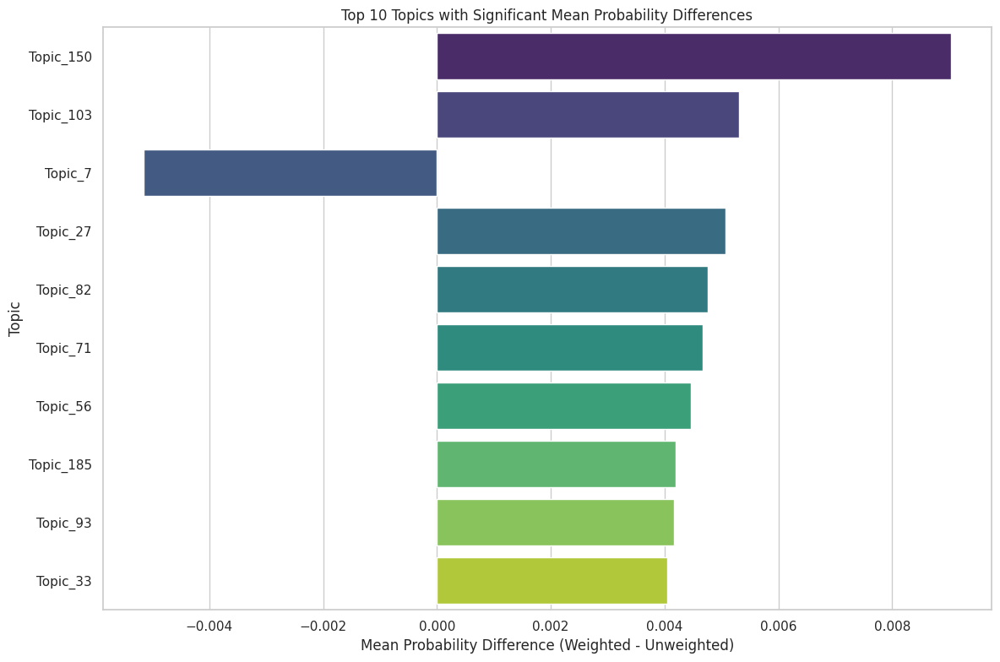

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select top 10 significant topics by absolute mean difference
top_significant = statistical_measures[statistical_measures['Significant']].copy()
top_significant['Abs_Mean_Diff'] = top_significant['Mean_Difference'].abs()
top_significant = top_significant.sort_values(by='Abs_Mean_Diff', ascending=False).head(10)

plt.figure(figsize=(12, 8))
sns.barplot(x='Mean_Difference', y='Topic', data=top_significant, palette='viridis')
plt.title('Top 10 Topics with Significant Mean Probability Differences')
plt.xlabel('Mean Probability Difference (Weighted - Unweighted)')
plt.ylabel('Topic')
plt.tight_layout()
plt.show()

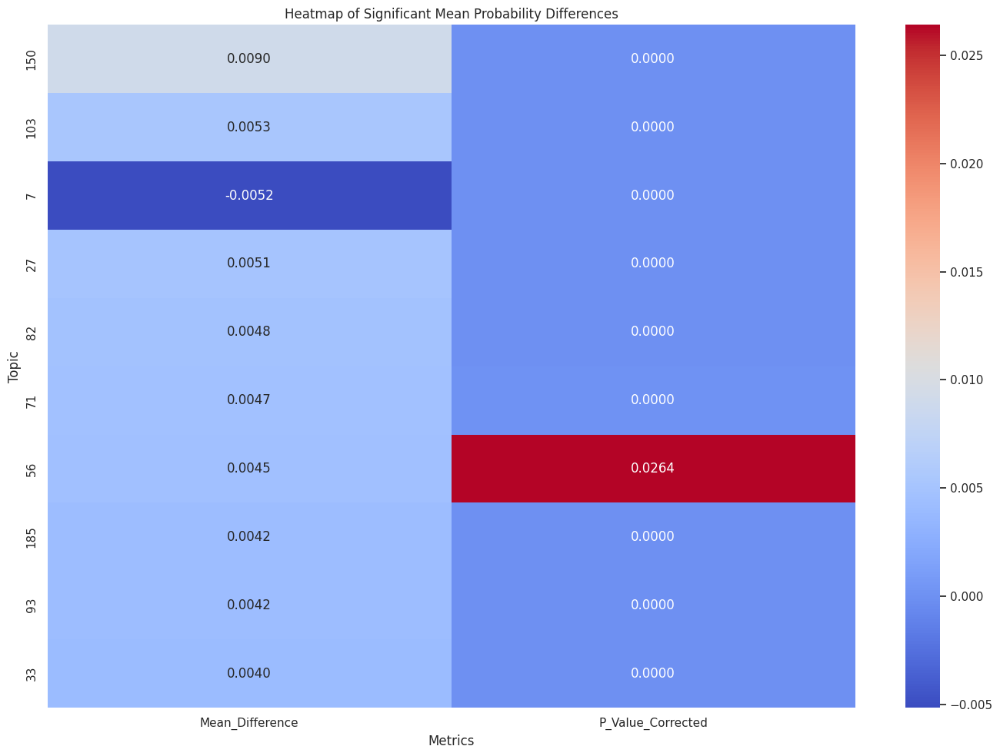

In [ ]:
plt.figure(figsize=(14, 10))
sns.heatmap(top_significant[['Mean_Difference', 'P_Value_Corrected']], annot=True, cmap='coolwarm', fmt=".4f")
plt.title('Heatmap of Significant Mean Probability Differences')
plt.xlabel('Metrics')
plt.ylabel('Topic')
plt.tight_layout()
plt.show()

In [ ]:
# Display all significant topics
significant_topics = statistical_measures[statistical_measures['Significant']].copy()
print("\n--- Significant Topics After FDR Correction ---")
print(significant_topics[['Topic', 'Mean_Difference', 'Test_Used', 'P_Value', 'P_Value_Corrected', 'Skewness', 'Kurtosis', 'Cohen_d']])

# Example Summary Printout
for idx, row in top_significant.iterrows():
    topic = row['Topic']
    mean_diff = row['Mean_Difference']
    test = row['Test_Used']
    p_val_corrected = row['P_Value_Corrected']
    skew = row['Skewness']
    kurt = row['Kurtosis']
    cohen_d = row['Cohen_d']
    significance = "Significant" if row['Significant'] else "Not Significant"

    print(f"\nTopic: {topic}")
    print(f"  Mean Difference: {mean_diff:.6f}")
    print(f"  Test Used: {test}")
    print(f"  Corrected P-Value: {p_val_corrected:.4f}")
    print(f"  Skewness: {skew:.4f}")
    print(f"  Kurtosis: {kurt:.4f}")
    print(f"  Cohen's d: {cohen_d:.4f}")
    print(f"  Significance: {significance}")


--- Significant Topics After FDR Correction ---
         Topic  Mean_Difference      Test_Used       P_Value  P_Value_Corrected  Skewness  \
0      Topic_0        -0.002512  Paired t-test  1.114463e-26       1.504525e-25  1.108180   
1      Topic_1         0.001582  Paired t-test  8.673008e-06       1.892293e-05  0.762523   
2      Topic_2         0.000979  Paired t-test  6.488374e-05       1.208180e-04  0.909890   
3      Topic_3         0.002769  Paired t-test  1.707822e-11       5.346226e-11  1.195342   
4      Topic_4         0.002611  Paired t-test  4.614785e-22       4.983968e-21  0.628740   
..         ...              ...            ...           ...                ...       ...   
206  Topic_206         0.001195  Paired t-test  9.452376e-06       2.021498e-05  2.166753   
209  Topic_209         0.002311  Paired t-test  5.546241e-05       1.050867e-04  2.091827   
211  Topic_211         0.001339  Paired t-test  3.589507e-05       7.048486e-05  0.940946   
212  Topic_212       

In [ ]:
# Check normalization for weighted topics
sum_weighted_probs = df_merged.filter(like='_weighted').sum(axis=1)
if np.allclose(sum_weighted_probs, 1, atol=1e-3):
    print("All weighted topic probabilities sum to approximately 1.")
else:
    print("Warning: Some weighted topic probabilities do not sum to 1. Investigate further.")
    # Identify books where sum != 1
    invalid_books = df_merged[~np.isclose(sum_weighted_probs, 1, atol=1e-3)]['Book Title']
    print("Books with inconsistent weighted topic sums:")
    print(invalid_books.tolist())

All weighted topic probabilities sum to approximately 1.


In [ ]:
# Display a sample of weighted vs. unweighted probabilities
sample = df_merged[['Book Title'] + [f"{topic}_unweighted" for topic in common_topics] + [f"{topic}_weighted" for topic in common_topics]].sample(5)
print("\nSample of Unweighted vs. Weighted Probabilities:")
print(sample)


Sample of Unweighted vs. Weighted Probabilities:
                  Book Title  Topic_0_unweighted  Topic_1_unweighted  Topic_2_unweighted  \
95           The Wright Boss            0.007439            0.005195            0.003678   
88              The Takeover            0.007883            0.004958            0.003726   
64  The Billionaire Bachelor            0.007656            0.005195            0.003773   
63   The Bastard Billionaire            0.007478            0.005001            0.003586   
13          Billionaire Hero            0.007294            0.004730            0.003480   

    Topic_3_unweighted  Topic_4_unweighted  Topic_5_unweighted  Topic_6_unweighted  \
95            0.003714            0.006123            0.004637            0.005519   
88            0.003872            0.005131            0.005065            0.005077   
64            0.003292            0.005581            0.004832            0.006077   
63            0.003385            0.005527           

In [ ]:
# Recalculate Cohen's d with correct scaling
for idx, row in statistical_measures.iterrows():
    if not np.isnan(row['Cohen_d']):
        statistical_measures.at[idx, 'Cohen_d'] = row['Mean_Difference'] / row['Std_Difference']

# Re-display the first 10 topics
print("Updated Statistical Measures (First 10 Topics):")
print(statistical_measures.head(10))

Updated Statistical Measures (First 10 Topics):
     Topic  Skewness  Kurtosis      Test_Used  Test_Statistic       P_Value  Mean_Difference  \
0  Topic_0  1.108180  0.658507  Paired t-test      -14.479944  1.114463e-26        -0.002512   
1  Topic_1  0.762523  0.230226  Paired t-test        4.680154  8.673008e-06         0.001582   
2  Topic_2  0.909890  1.002999  Paired t-test        4.163151  6.488374e-05         0.000979   
3  Topic_3  1.195342  1.386944  Paired t-test        7.554021  1.707822e-11         0.002769   
4  Topic_4  0.628740 -0.137130  Paired t-test       12.326965  4.614785e-22         0.002611   
5  Topic_5  0.361175 -0.023333  Paired t-test       -3.669171  3.857640e-04        -0.000463   
6  Topic_6  2.146059  5.432417  Paired t-test        3.566876  5.477775e-04         0.003038   
7  Topic_7  1.253058  2.662022  Paired t-test      -46.256979  3.451195e-71        -0.005160   
8  Topic_8  0.570431  0.633312  Paired t-test        1.476455  1.428432e-01         0.00

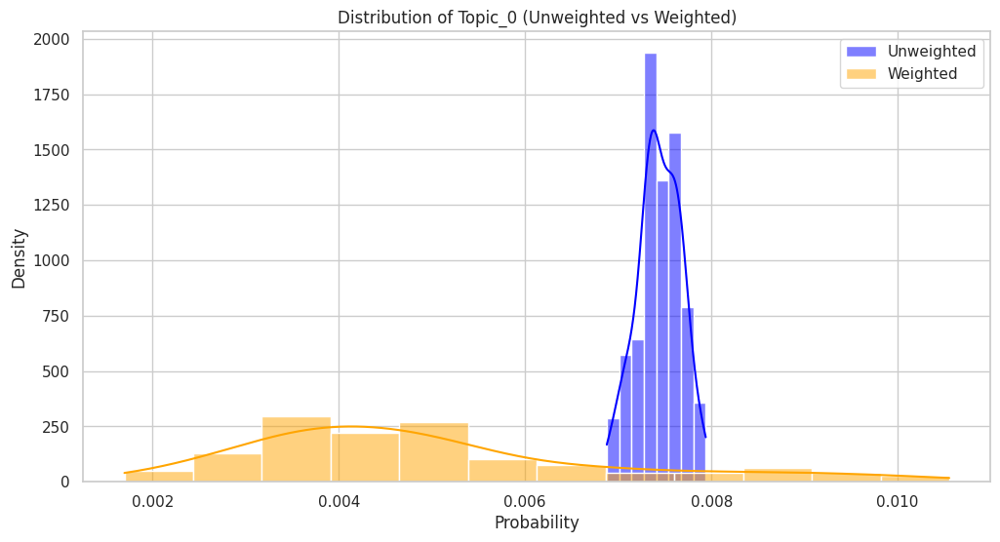

Outliers for Topic_0_weighted:
Empty DataFrame
Columns: [Book Title, Topic_0_weighted]
Index: []


In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Investigate 'Topic_0'
topic = 'Topic_0'
unweighted_col = f"{topic}_unweighted"
weighted_col = f"{topic}_weighted"

# Plot distributions
plt.figure(figsize=(12, 6))
sns.histplot(df_merged[unweighted_col], color='blue', label='Unweighted', kde=True, stat="density", alpha=0.5)
sns.histplot(df_merged[weighted_col], color='orange', label='Weighted', kde=True, stat="density", alpha=0.5)
plt.title(f'Distribution of {topic} (Unweighted vs Weighted)')
plt.xlabel('Probability')
plt.ylabel('Density')
plt.legend()
plt.show()

# Calculate z-scores for weighted topic
z_scores = stats.zscore(df_merged[weighted_col])
outliers = df_merged[np.abs(z_scores) > 3]

print(f"Outliers for {topic}_weighted:")
print(outliers[['Book Title', weighted_col]])

In [ ]:
def deep_dive_outliers(df, weighted_topics, sorted_common_topics, skew_thresh=2, kurt_thresh=10):
    """
    Identifies topics with extreme skewness and kurtosis and investigates their distributions and outliers.

    Parameters:
    - df: pandas DataFrame
    - weighted_topics: list of weighted topic column names
    - sorted_common_topics: sorted list of base topic names
    - skew_thresh: threshold for absolute skewness to consider as extreme
    - kurt_thresh: threshold for kurtosis to consider as extreme

    Returns:
    - extreme_topics: list of topics with either extreme skewness or kurtosis
    """
    # Calculate skewness and kurtosis for each weighted topic
    skew_values = df[weighted_topics].skew()
    kurtosis_values = df[weighted_topics].kurtosis()

    # Create a DataFrame with these statistics
    skew_kurt_df = pd.DataFrame({
        'Topic': [col.replace('_weighted', '') for col in weighted_topics],
        'Skewness': skew_values.values,
        'Kurtosis': kurtosis_values.values
    })

    # Identify topics exceeding the thresholds
    extreme_skew_topics = skew_kurt_df[np.abs(skew_kurt_df['Skewness']) > skew_thresh]['Topic'].tolist()
    extreme_kurt_topics = skew_kurt_df[skew_kurt_df['Kurtosis'] > kurt_thresh]['Topic'].tolist()

    extreme_topics = list(set(extreme_skew_topics + extreme_kurt_topics))

    print(f"Topics with Extreme Skewness (|skew| > {skew_thresh}): {extreme_skew_topics}\n")
    print(f"Topics with Extreme Kurtosis (kurtosis > {kurt_thresh}): {extreme_kurt_topics}\n")

    # Investigate each extreme topic
    for topic in extreme_topics:
        print(f"🔍 Investigating Topic: {topic}")
        investigate_outliers(df, topic)

    return extreme_topics

def investigate_outliers(df, topic):
    """
    Plots the distribution of a topic and lists the top outliers based on z-scores.

    Parameters:
    - df: pandas DataFrame
    - topic: base topic name
    """
    weighted_col = f"{topic}_weighted"

    # Plot the distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(df[weighted_col], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribution of {weighted_col}')
    plt.xlabel('Probability')
    plt.ylabel('Frequency')
    plt.show()

    # Calculate z-scores
    z_scores = np.abs(stats.zscore(df[weighted_col]))

    # Identify outliers (z-score > 3)
    outliers = df[z_scores > 3]

    if not outliers.empty:
        print(f"Top {min(10, len(outliers))} Outliers in {weighted_col}:")
        display(outliers[['Book Title', weighted_col]].sort_values(by=weighted_col, ascending=False).head(10))
    else:
        print(f"No outliers detected in {weighted_col}.\n")

    print("\n" + "-"*50 + "\n")

# Execute Deep Dive into Outliers
extreme_topics = deep_dive_outliers(df_merged, weighted_topics, sorted_common_topics, skew_thresh=2, kurt_thresh=10)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def perform_paired_t_tests(df, sorted_common_topics):
    """
    Performs paired t-tests between unweighted and weighted topic probabilities and calculates Cohen's d.

    Parameters:
    - df: pandas DataFrame
    - sorted_common_topics: sorted list of base topic names

    Returns:
    - stat_test_results_df: DataFrame containing test statistics and effect sizes
    - large_effect_topics: list of topics with large effect sizes (|Cohen's d| > 0.8)
    """
    stat_test_results = []

    for topic in sorted_common_topics:
        unweighted_col = f"{topic}_unweighted"
        weighted_col = f"{topic}_weighted"

        # Ensure both columns exist
        if unweighted_col not in df.columns or weighted_col not in df.columns:
            print(f"⚠️ Columns missing for topic {topic}. Skipping.")
            continue

        # Extract paired data
        paired_data = df[[unweighted_col, weighted_col]].dropna()

        # Perform paired t-test
        t_stat, p_val = stats.ttest_rel(paired_data[weighted_col], paired_data[unweighted_col])

        # Calculate mean difference
        mean_diff = paired_data[weighted_col].mean() - paired_data[unweighted_col].mean()

        # Calculate pooled standard deviation
        sd_pooled = np.sqrt((paired_data[weighted_col].std() ** 2 + paired_data[unweighted_col].std() ** 2) / 2)

        # Calculate Cohen's d
        cohens_d = mean_diff / sd_pooled if sd_pooled != 0 else np.nan

        # Append results
        stat_test_results.append({
            'Topic': topic,
            'Test_Used': 'Paired t-test',
            'Test_Statistic': t_stat,
            'P_Value': p_val,
            'Mean_Difference': mean_diff,
            'Cohen_d': cohens_d
        })

    # Convert to DataFrame
    stat_test_results_df = pd.DataFrame(stat_test_results)

    # Apply Benjamini-Hochberg correction
    reject, pvals_corrected, _, _ = multipletests(stat_test_results_df['P_Value'], method='fdr_bh')
    stat_test_results_df['P_Value_Corrected'] = pvals_corrected
    stat_test_results_df['Significant'] = reject

    # Identify topics with large effect sizes
    large_effect_threshold = 0.8
    large_effect_topics = stat_test_results_df[np.abs(stat_test_results_df['Cohen_d']) > large_effect_threshold]['Topic'].tolist()

    print(f"Topics with Large Effect Sizes (|Cohen's d| > {large_effect_threshold}): {large_effect_topics}\n")

    return stat_test_results_df, large_effect_topics

def validate_large_effect_sizes(df, large_effect_topics):
    """
    Validates topics with large effect sizes by plotting distributions, boxplots, and displaying statistical summaries.

    Parameters:
    - df: pandas DataFrame
    - large_effect_topics: list of topics with large effect sizes
    """
    for topic in large_effect_topics:
        unweighted_col = f"{topic}_unweighted"
        weighted_col = f"{topic}_weighted"

        # Plot paired distributions
        plt.figure(figsize=(10, 6))
        sns.kdeplot(df[unweighted_col], label='Unweighted', shade=True, color='blue')
        sns.kdeplot(df[weighted_col], label='Weighted', shade=True, color='orange')
        plt.title(f'Unweighted vs Weighted Distribution for {topic}')
        plt.xlabel('Probability')
        plt.ylabel('Density')
        plt.legend()
        plt.show()

        # Boxplot to visualize outliers
        plt.figure(figsize=(8, 6))
        sns.boxplot(data=df[[unweighted_col, weighted_col]], palette=['blue', 'orange'])
        plt.title(f'Boxplot of {topic} Probabilities')
        plt.show()

        # Statistical Summary
        print(f"Statistical Summary for {topic}:")
        display(df[[unweighted_col, weighted_col]].describe())
        print("\n" + "-"*50 + "\n")

        # Check for zero variance
        if df[unweighted_col].std() == 0 or df[weighted_col].std() == 0:
            print(f"⚠️ Warning: Zero variance detected in {topic}. Effect size may be undefined.\n")

# Execute Effect Size Validation
stat_test_results_df, large_effect_topics = perform_paired_t_tests(df_merged, sorted_common_topics)

# Validate Topics with Large Effect Sizes
validate_large_effect_sizes(df_merged, large_effect_topics)

Output hidden; open in https://colab.research.google.com to view.


Wilcoxon Signed-Rank Test Results:


,Topic,Test_Used,Test_Statistic,P_Value,Mean_Difference
0,Topic_21,Wilcoxon signed-rank test,943.0,4.089504e-09,0.003540
1,Topic_53,Wilcoxon signed-rank test,2202.0,6.348946e-02,0.000904
2,Topic_32,Wilcoxon signed-rank test,2289.0,1.146516e-01,0.000692
3,Topic_47,Wilcoxon signed-rank test,2669.0,7.167260e-01,0.001054
4,Topic_190,Wilcoxon signed-rank test,942.0,4.011254e-09,-0.001512
5,Topic_128,Wilcoxon signed-rank test,1587.0,1.324885e-04,-0.000674
6,Topic_127,Wilcoxon signed-rank test,497.0,2.745803e-13,-0.002247
7,Topic_208,Wilcoxon signed-rank test,2611.0,5.835183e-01,0.000320
8,Topic_71,Wilcoxon signed-rank test,1159.0,2.102705e-07,0.004665
9,Topic_165,Wilcoxon signed-rank test,1007.0,1.379324e-08,-0.001086


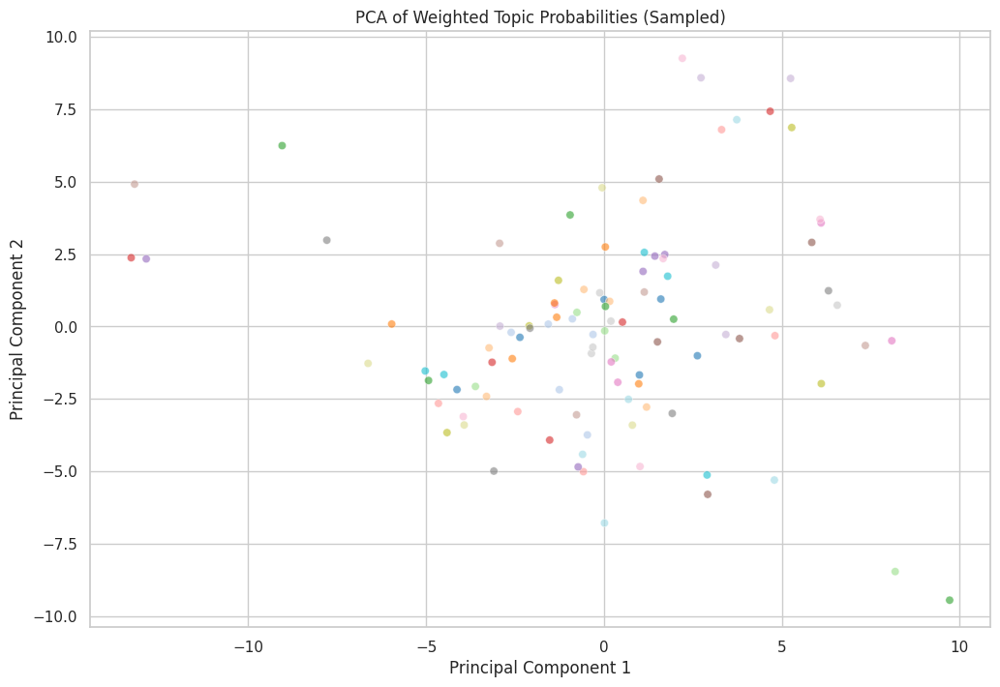

Explained Variance by PC1: 7.98%
Explained Variance by PC2: 5.68%
Total Explained Variance: 13.66%



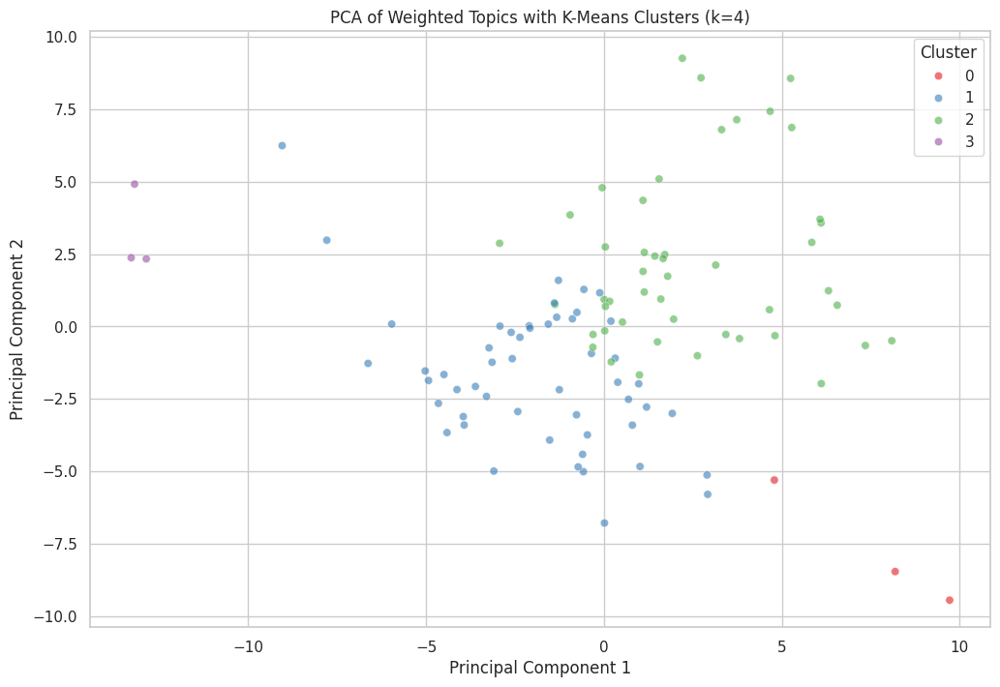

Cluster Centers (in standardized feature space):
[[ 8.49468711e-01  6.07768409e-01  1.54114386e+00  2.07110234e+00
   3.53461262e-01  1.37242995e+00 -2.12323804e-01  5.87115295e-02
  -7.51228880e-01 -6.53548362e-01 -6.15235126e-01 -9.35279348e-01
   1.35932342e+00 -1.21483256e+00  2.40357401e+00  2.84385183e-01
  -8.19646020e-01  2.72596566e+00 -8.28305360e-01  1.02995000e-01
   1.55782737e+00  2.90114257e-01  6.41240359e-01 -3.97474779e-01
  -1.58622409e-01  1.42592805e+00 -1.40908048e+00 -3.09573531e-01
   9.88598670e-01 -5.20111665e-01 -9.85672265e-01 -1.04012690e+00
  -7.65623708e-01  8.55381898e-01  3.71783957e-01  3.74321599e-01
  -2.39492971e-01 -3.96576821e-01  3.63174616e-01 -3.59207202e-02
  -8.82185687e-01  7.60650312e-01 -9.18713796e-01 -1.17226656e+00
  -1.04026571e+00 -1.47459623e+00  5.73284993e-02  2.49200577e+00
   7.27604877e-01 -1.17263873e+00  2.51384997e+00 -1.44897570e-01
  -1.24096898e+00 -8.72741645e-01  1.13926685e+00 -5.38436586e-02
   3.75570648e+00 -9.305962

In [ ]:
def expanded_statistical_testing(df, extreme_topics):
    """
    Performs Wilcoxon signed-rank tests for non-normal topics and conducts PCA and Clustering analyses.

    Parameters:
    - df: pandas DataFrame
    - extreme_topics: list of topics with extreme skewness or kurtosis
    """
    # Perform Wilcoxon signed-rank test
    wilcoxon_results_df = perform_wilcoxon_tests(df, extreme_topics)

    # Perform Principal Component Analysis (PCA)
    perform_pca(df)

    # Optional: Perform K-Means Clustering
    perform_kmeans_clustering(df, n_clusters=4)

def perform_wilcoxon_tests(df, non_normal_topics):
    """
    Performs Wilcoxon signed-rank tests on non-normal topics.

    Parameters:
    - df: pandas DataFrame
    - non_normal_topics: list of topics to test

    Returns:
    - wilcoxon_results_df: DataFrame containing Wilcoxon test results
    """
    wilcoxon_results = []

    for topic in non_normal_topics:
        unweighted_col = f"{topic}_unweighted"
        weighted_col = f"{topic}_weighted"

        # Ensure both columns exist
        if unweighted_col not in df.columns or weighted_col not in df.columns:
            print(f"⚠️ Columns missing for topic {topic}. Skipping.")
            continue

        # Extract paired data
        paired_data = df[[unweighted_col, weighted_col]].dropna()

        # Perform Wilcoxon signed-rank test
        try:
            stat, p = stats.wilcoxon(paired_data[weighted_col], paired_data[unweighted_col])
        except ValueError as e:
            print(f"Wilcoxon test not applicable for {topic}: {e}")
            stat, p = np.nan, np.nan

        # Calculate mean difference
        mean_diff = paired_data[weighted_col].mean() - paired_data[unweighted_col].mean()

        # Append results
        wilcoxon_results.append({
            'Topic': topic,
            'Test_Used': 'Wilcoxon signed-rank test',
            'Test_Statistic': stat,
            'P_Value': p,
            'Mean_Difference': mean_diff
        })

    # Convert to DataFrame
    wilcoxon_results_df = pd.DataFrame(wilcoxon_results)

    print("\nWilcoxon Signed-Rank Test Results:")
    display(wilcoxon_results_df)

    return wilcoxon_results_df

def perform_pca(df):
    """
    Performs Principal Component Analysis (PCA) on weighted topic probabilities and plots the first two principal components.

    Parameters:
    - df: pandas DataFrame
    """
    # Select weighted topic columns
    weighted_topic_cols = [col for col in df.columns if col.endswith('_weighted')]

    # Standardize the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(df[weighted_topic_cols])

    # Initialize PCA
    pca = PCA(n_components=2, random_state=42)
    principal_components = pca.fit_transform(scaled_data)

    # Create DataFrame with principal components
    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
    pca_df['Book Title'] = df['Book Title']

    # Due to the large number of books, sampling for visualization
    sample_size = 1000  # Adjust based on your system's capabilities
    if df.shape[0] > sample_size:
        sample_df = pca_df.sample(n=sample_size, random_state=42)
    else:
        sample_df = pca_df

    # Plot PCA results
    plt.figure(figsize=(12, 8))
    sns.scatterplot(data=sample_df, x='PC1', y='PC2', hue='Book Title', palette='tab20', legend=False, alpha=0.6)
    plt.title('PCA of Weighted Topic Probabilities (Sampled)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.show()

    # Explained variance
    print(f"Explained Variance by PC1: {pca.explained_variance_ratio_[0]:.2%}")
    print(f"Explained Variance by PC2: {pca.explained_variance_ratio_[1]:.2%}")
    print(f"Total Explained Variance: {sum(pca.explained_variance_ratio_):.2%}\n")

def perform_kmeans_clustering(df, n_clusters=4):
    """
    Performs K-Means clustering on weighted topic probabilities and visualizes the clusters on PCA components.

    Parameters:
    - df: pandas DataFrame
    - n_clusters: int, number of clusters to form
    """
    # Select weighted topic columns
    weighted_topic_cols = [col for col in df.columns if col.endswith('_weighted')]

    # Standardize the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(df[weighted_topic_cols])

    # Initialize K-Means
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(scaled_data)

    # Add cluster labels to DataFrame
    df['Cluster'] = clusters

    # Perform PCA for visualization
    pca = PCA(n_components=2, random_state=42)
    principal_components = pca.fit_transform(scaled_data)
    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
    pca_df['Cluster'] = clusters

    # Sampling for visualization
    sample_size = 1000  # Adjust as needed
    if df.shape[0] > sample_size:
        sample_df = pca_df.sample(n=sample_size, random_state=42)
    else:
        sample_df = pca_df

    # Plot clusters on PCA components
    plt.figure(figsize=(12, 8))
    sns.scatterplot(data=sample_df, x='PC1', y='PC2', hue='Cluster', palette='Set1', legend='full', alpha=0.6)
    plt.title(f'PCA of Weighted Topics with K-Means Clusters (k={n_clusters})')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(title='Cluster')
    plt.show()

    # Print cluster centers
    print("Cluster Centers (in standardized feature space):")
    print(kmeans.cluster_centers_)
    print("\n" + "-"*50 + "\n")

# Execute Expanded Statistical Testing
expanded_statistical_testing(df_merged, extreme_topics)

In [ ]:
def save_results(stat_test_df, wilcoxon_df, df, output_dir='output'):
    """
    Saves the statistical test results and the augmented DataFrame to CSV files.

    Parameters:
    - stat_test_df: DataFrame containing paired t-test results
    - wilcoxon_df: DataFrame containing Wilcoxon test results
    - df: pandas DataFrame (augmented with cluster labels)
    - output_dir: str, directory to save the output files
    """
    # Create output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Save paired t-test results
    stat_test_path = os.path.join(output_dir, 'paired_t_test_results.csv')
    stat_test_df.to_csv(stat_test_path, index=False)
    print(f"✅ Paired t-test results saved to {stat_test_path}")

    # Save Wilcoxon test results
    wilcoxon_test_path = os.path.join(output_dir, 'wilcoxon_test_results.csv')
    wilcoxon_df.to_csv(wilcoxon_test_path, index=False)
    print(f"✅ Wilcoxon test results saved to {wilcoxon_test_path}")

    # Save augmented DataFrame with cluster labels
    augmented_df_path = os.path.join(output_dir, 'df_merged_with_clusters.csv')
    df.to_csv(augmented_df_path, index=False)
    print(f"✅ Augmented DataFrame saved to {augmented_df_path}\n")

# Execute Saving Results
save_results(stat_test_results_df, perform_wilcoxon_tests(df_merged, extreme_topics), df_merged)


Wilcoxon Signed-Rank Test Results:


,Topic,Test_Used,Test_Statistic,P_Value,Mean_Difference
0,Topic_21,Wilcoxon signed-rank test,943.0,4.089504e-09,0.003540
1,Topic_53,Wilcoxon signed-rank test,2202.0,6.348946e-02,0.000904
2,Topic_32,Wilcoxon signed-rank test,2289.0,1.146516e-01,0.000692
3,Topic_47,Wilcoxon signed-rank test,2669.0,7.167260e-01,0.001054
4,Topic_190,Wilcoxon signed-rank test,942.0,4.011254e-09,-0.001512
5,Topic_128,Wilcoxon signed-rank test,1587.0,1.324885e-04,-0.000674
6,Topic_127,Wilcoxon signed-rank test,497.0,2.745803e-13,-0.002247
7,Topic_208,Wilcoxon signed-rank test,2611.0,5.835183e-01,0.000320
8,Topic_71,Wilcoxon signed-rank test,1159.0,2.102705e-07,0.004665
9,Topic_165,Wilcoxon signed-rank test,1007.0,1.379324e-08,-0.001086


✅ Paired t-test results saved to output/paired_t_test_results.csv
✅ Wilcoxon test results saved to output/wilcoxon_test_results.csv
✅ Augmented DataFrame saved to output/df_merged_with_clusters.csv



# Exploratory Analysis on Weighted Topics

2024-11-14 21:30:30 - Loading weighted topic probabilities from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/book_topics_weighted.csv
2024-11-14 21:30:30 - Weighted topic probabilities loaded successfully.
2024-11-14 21:30:30 - Displaying the first few rows of the weighted topic probabilities DataFrame:
                              Book Title   Topic_0   Topic_1   Topic_2   Topic_3   Topic_4  \
0                     A Long Time Coming  0.004930  0.007376  0.007365  0.003586  0.010494   
1                     A Not So Meet Cute  0.004782  0.012636  0.005132  0.006888  0.007986   
2                           Ache for You  0.004201  0.006303  0.007516  0.004785  0.004812   
3  An Accidental Date with a Billionaire  0.006683  0.012487  0.005452  0.006379  0.013165   
4                               Bad Boss  0.009323  0.002617  0.004259  0.004484  0.006311   

    Topic_5   Topic_6   Topic_7   Topic_8   Topic_9  Topic_10  Topic_11  Topic_12  Topic_13  \
0  0.003263  0.

<ipython-input-139-b53e4789561f>:100: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_topics.values, y=top_10_topics.index, palette='viridis')


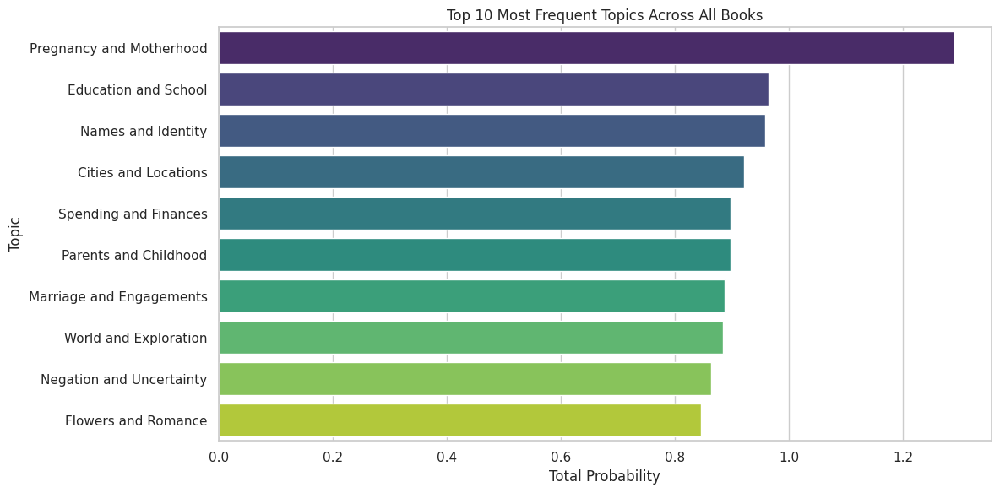

2024-11-14 21:30:32 - Non-numeric dtype encountered in row 0
Topic_0       0.00493
Topic_1      0.007376
Topic_2      0.007365
Topic_3      0.003586
Topic_4      0.010494
               ...   
Topic_211    0.000542
Topic_212     0.00319
Topic_213    0.007029
Topic_214    0.002095
Topic_215    0.005943
Name: 0, Length: 216, dtype: object
2024-11-14 21:30:32 - Error encountered: Cannot use method 'nlargest' with dtype object
2024-11-14 21:30:32 - Attempting to use the alternative method with sort_values.
2024-11-14 21:30:32 - Successfully identified top 5 topics for each book using the alternative method.
2024-11-14 21:30:32 - Displaying top 5 topics for the first few books:
Book Title: A Long Time Coming
  Top 1 Topic: Marriage and Engagements (Probability: 0.0180)
  Top 2 Topic: Friendships and Social Life (Probability: 0.0179)
  Top 3 Topic: Flowers and Romance (Probability: 0.0134)
  Top 4 Topic: Breaking and Letting Go (Probability: 0.0129)
  Top 5 Topic: Planning and Decisions (Pro

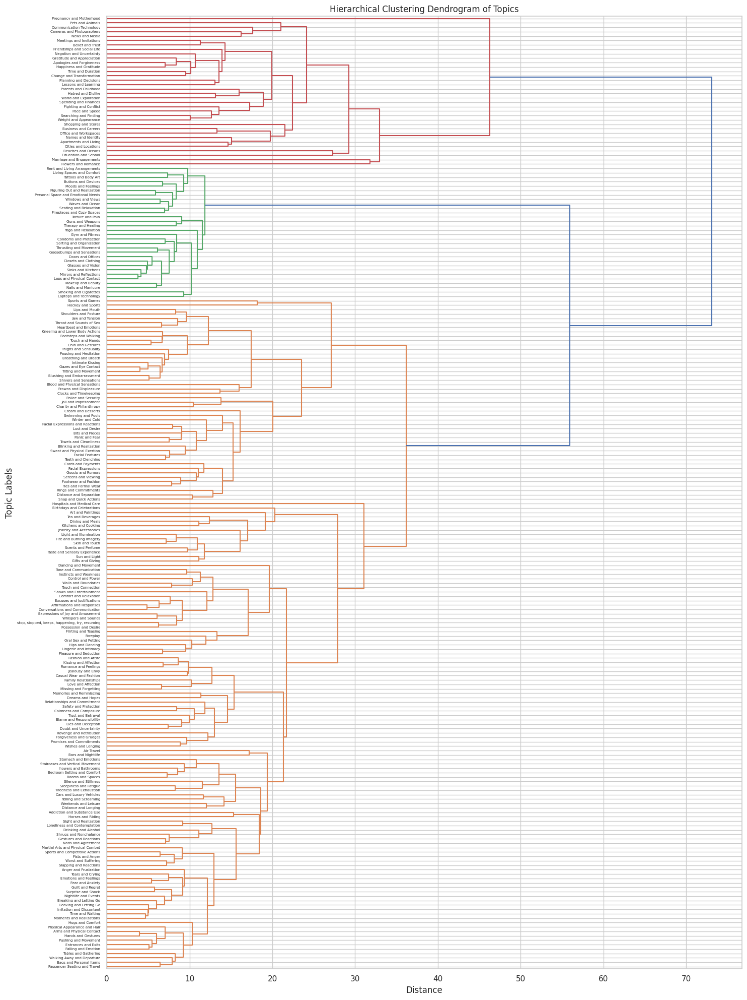

2024-11-14 21:30:33 - Topics grouped by clusters:

Cluster 1:
  Negation and Uncertainty
  Marriage and Engagements
  Business and Careers
  Office and Workspaces
  Communication Technology
  Apartments and Living
  Friendships and Social Life
  Parents and Childhood
  Time and Duration
  Hatred and Dislike
  Cameras and Photographers
  Apologies and Forgiveness
  Names and Identity
  Searching and Finding
  Fighting and Conflict
  Flowers and Romance
  Beaches and Oceans
  Shopping and Stores
  Gratitude and Appreciation
  Pets and Animals
  Cities and Locations
  Weight and Appearance
  Education and School
  Meetings and Invitations
  World and Exploration
  Change and Transformation
  Belief and Trust
  Pace and Speed
  News and Media
  Planning and Decisions
  Spending and Finances
  Lessons and Learning
  Happiness and Gratitude

Cluster 2:
  Pregnancy and Motherhood

Cluster 3:
  Living Spaces and Comfort
  Seating and Relaxation
  Mirrors and Reflections
  Condoms and Protectio

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.preprocessing import StandardScaler

def print_with_time(message):
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# Define file paths
weighted_topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/book_topics_weighted.csv'
topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv'
results_base_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/'

# Load the weighted topic probabilities per book
print_with_time(f"Loading weighted topic probabilities from: {weighted_topics_path}")
df_weighted = pd.read_csv(weighted_topics_path)
print_with_time("Weighted topic probabilities loaded successfully.")

# Display the first few rows
print_with_time("Displaying the first few rows of the weighted topic probabilities DataFrame:")
print(df_weighted.head())

# Identify topic columns
topic_columns = [col for col in df_weighted.columns if col.startswith('Topic_')]

# Strip any leading/trailing whitespace from column names
df_weighted.columns = df_weighted.columns.str.strip()

# Re-identify topic columns after stripping
topic_columns = [col for col in df_weighted.columns if col.startswith('Topic_')]

# Check data types of topic columns
print_with_time("Data types of topic columns:")
print(df_weighted[topic_columns].dtypes)

# Convert topic columns to numeric, coercing errors to NaN
df_weighted[topic_columns] = df_weighted[topic_columns].apply(pd.to_numeric, errors='coerce')

# Verify the conversion
print_with_time("Data types of topic columns after conversion:")
print(df_weighted[topic_columns].dtypes)

# Check for NaN values in topic columns
nan_counts = df_weighted[topic_columns].isna().sum()
print_with_time("Number of NaN values in each topic column:")
print(nan_counts)

# Handle NaNs by filling them with 0
df_weighted[topic_columns] = df_weighted[topic_columns].fillna(0)

# Re-verify no NaNs exist
print_with_time("NaN values after filling:")
print(df_weighted[topic_columns].isna().sum())

# Check for any non-numeric values within topic columns
for col in topic_columns:
    non_numeric = df_weighted[~df_weighted[col].apply(lambda x: isinstance(x, (int, float)))][col]
    if not non_numeric.empty:
        print_with_time(f"Non-numeric values found in {col}:")
        print(non_numeric)
    else:
        print_with_time(f"No non-numeric values found in {col}.")

# Load the topics and labels
print_with_time(f"Loading topic representations from: {topics_path}")
df_topics = pd.read_csv(topics_path)
print_with_time("Topic representations loaded successfully.")

# Ensure that Topic_Number is a string for mapping
df_topics['Topic_Number'] = df_topics['Topic_Number'].astype(str)

# Create a dictionary mapping topic numbers to labels
topic_labels = dict(zip(df_topics['Topic_Number'], df_topics['Label']))

# Create a mapping from 'Topic_#' to labels
topic_label_mapping = {col: topic_labels.get(col.split('_')[1], col) for col in topic_columns}

# Exploratory Analysis 1: Topic Frequency Across All Books

# Sum the normalized topic probabilities across all books and sort in descending order
topic_totals = df_weighted[topic_columns].sum().sort_values(ascending=False)

# Map topic columns to labels
topic_totals.index = topic_totals.index.map(topic_label_mapping)

# Display the top 10 and bottom 10 topics
top_10_topics = topic_totals.head(10)
bottom_10_topics = topic_totals.tail(10)

print_with_time("Top 10 most frequent topics across all books:")
print(top_10_topics.to_string())

print_with_time("Bottom 10 least frequent topics across all books:")
print(bottom_10_topics.to_string())

# Visualization: Bar chart of top 10 most frequent topics
plt.figure(figsize=(12, 6))
sns.barplot(x=top_10_topics.values, y=top_10_topics.index, palette='viridis')
plt.title('Top 10 Most Frequent Topics Across All Books')
plt.xlabel('Total Probability')
plt.ylabel('Topic')
plt.tight_layout()
plt.show()

# Exploratory Analysis 2: Topic Distribution Per Book

# Enhanced function with debugging
def get_top_topics(row, n=5):
    topics = row[topic_columns]

    # Debug: Check if the selected topics are numeric
    if not pd.api.types.is_numeric_dtype(topics):
        print_with_time(f"Non-numeric dtype encountered in row {row.name}")
        print(topics)
        raise TypeError(f"Cannot use method 'nlargest' with dtype {topics.dtype}")

    # Retrieve top n topics
    top_topics = topics.nlargest(n)

    # Map topic columns to labels
    top_topics_labels = [topic_label_mapping.get(topic, topic) for topic in top_topics.index]

    # Return as a list of tuples (label, probability)
    return list(zip(top_topics_labels, top_topics.values))

# Apply the function to each row to create the 'Top_Topics' column
try:
    df_weighted['Top_Topics'] = df_weighted.apply(get_top_topics, axis=1)
    print_with_time("Successfully identified top 5 topics for each book.")
except TypeError as e:
    print_with_time(f"Error encountered: {e}")

# If the above raises an error, try the alternative method
if 'Top_Topics' not in df_weighted.columns:
    print_with_time("Attempting to use the alternative method with sort_values.")

    def get_top_topics_alternative(row, n=5):
        topics = row[topic_columns].sort_values(ascending=False).head(n)
        top_topics_labels = [topic_label_mapping.get(topic, topic) for topic in topics.index]
        return list(zip(top_topics_labels, topics.values))

    try:
        df_weighted['Top_Topics'] = df_weighted.apply(get_top_topics_alternative, axis=1)
        print_with_time("Successfully identified top 5 topics for each book using the alternative method.")
    except Exception as e:
        print_with_time(f"Error encountered with the alternative method: {e}")

# Display the top 5 topics for the first few books
if 'Top_Topics' in df_weighted.columns:
    print_with_time("Displaying top 5 topics for the first few books:")
    for idx, row in df_weighted.head().iterrows():
        print(f"Book Title: {row['Book Title']}")
        for i, (label, prob) in enumerate(row['Top_Topics'], 1):
            print(f"  Top {i} Topic: {label} (Probability: {prob:.4f})")
        print()

# Identifying Anomalies or Unexpected Patterns

# a. Books with a Single Dominant Topic
dominant_threshold = 0.8

# Identify books with a single topic dominating (e.g., > 80% probability)
dominant_books = df_weighted[df_weighted[topic_columns].max(axis=1) > dominant_threshold].copy()

# Map topic columns to labels for dominant topics
dominant_books['Dominant_Topic'] = dominant_books[topic_columns].idxmax(axis=1).map(topic_label_mapping)
dominant_books['Dominant_Probability'] = dominant_books[topic_columns].max(axis=1)

# Display books with a single dominant topic
print_with_time(f"Number of books with a single dominant topic (> {dominant_threshold*100}% probability): {len(dominant_books)}")
if not dominant_books.empty:
    print_with_time("Books with a single dominant topic:")
    for idx, row in dominant_books.iterrows():
        print(f"Book Title: {row['Book Title']}")
        print(f"  Dominant Topic: {row['Dominant_Topic']} (Probability: {row['Dominant_Probability']:.4f})\n")
else:
    print("No books found with a single dominant topic exceeding the threshold.")

# b. Rare Topics
rare_threshold = 0.001  # Adjust as needed

# Identify topics that are extremely rare (total probability below the threshold)
rare_topics = topic_totals[topic_totals < rare_threshold]

print_with_time(f"Rare topics with total probability below {rare_threshold}:")
if not rare_topics.empty:
    for topic_label, total_prob in rare_topics.items():
        print(f"  {topic_label}: Total Probability = {total_prob:.6f}")
else:
    print("No rare topics found below the specified threshold.")

# Hierarchical Clustering of Topics

# Transpose the DataFrame to have topics as rows and books as columns
df_topics_transposed = df_weighted[topic_columns].T.copy()

# Map index to topic labels
df_topics_transposed.index = df_topics_transposed.index.map(topic_label_mapping)

# Standardize the data before clustering
scaler = StandardScaler()
df_topics_scaled = scaler.fit_transform(df_topics_transposed)

# Perform hierarchical clustering using Ward's method
linked = linkage(df_topics_scaled, method='ward')

# Create a dendrogram
plt.figure(figsize=(15, 20))
dendrogram(
    linked,
    labels=df_topics_transposed.index,
    orientation='right',
    distance_sort='descending',
    show_leaf_counts=True
)
plt.title('Hierarchical Clustering Dendrogram of Topics')
plt.xlabel('Distance')
plt.ylabel('Topic Labels')
plt.tight_layout()
plt.show()

# Define the number of clusters
num_clusters = 5  # Adjust as needed

# Get cluster assignments
clusters = fcluster(linked, num_clusters, criterion='maxclust')

# Create a DataFrame with topic labels and their cluster assignments
cluster_df = pd.DataFrame({'Topic_Label': df_topics_transposed.index, 'Cluster': clusters})

# Display the topics grouped by cluster
print_with_time("Topics grouped by clusters:")
for cluster_num in sorted(cluster_df['Cluster'].unique()):
    cluster_topics = cluster_df[cluster_df['Cluster'] == cluster_num]['Topic_Label'].tolist()
    print(f"\nCluster {cluster_num}:")
    for topic_label in cluster_topics:
        print(f"  {topic_label}")

# Saving Results to Text Files

# 1. Save Top 10 and Bottom 10 Topics
top_10_path = f"{results_base_path}top_10_topics.txt"
bottom_10_path = f"{results_base_path}bottom_10_topics.txt"

with open(top_10_path, 'w') as f:
    f.write("Top 10 most frequent topics across all books:\n")
    f.write(top_10_topics.to_string())

with open(bottom_10_path, 'w') as f:
    f.write("Bottom 10 least frequent topics across all books:\n")
    f.write(bottom_10_topics.to_string())

print_with_time("Saved top 10 and bottom 10 topics to text files.")

# 2. Save Books with Dominant Topics
dominant_books_path = f"{results_base_path}books_with_dominant_topics.txt"

with open(dominant_books_path, 'w') as f:
    f.write(f"Books with a single dominant topic (> {dominant_threshold*100}% probability):\n\n")
    for idx, row in dominant_books.iterrows():
        f.write(f"Book Title: {row['Book Title']}\n")
        f.write(f"  Dominant Topic: {row['Dominant_Topic']} (Probability: {row['Dominant_Probability']:.4f})\n\n")

print_with_time("Saved books with a single dominant topic to text file.")

# 3. Save Rare Topics
rare_topics_path = f"{results_base_path}rare_topics.txt"

with open(rare_topics_path, 'w') as f:
    f.write(f"Rare topics with total probability below {rare_threshold}:\n")
    if not rare_topics.empty:
        for topic_label, total_prob in rare_topics.items():
            f.write(f"  {topic_label}: Total Probability = {total_prob:.6f}\n")
    else:
        f.write("No rare topics found below the specified threshold.\n")

print_with_time("Saved list of rare topics to text file.")

# 4. Save Topic Clusters
topic_clusters_path = f"{results_base_path}topic_clusters.txt"

with open(topic_clusters_path, 'w') as f:
    f.write("Topics grouped by clusters:\n")
    for cluster_num in sorted(cluster_df['Cluster'].unique()):
        f.write(f"\nCluster {cluster_num}:\n")
        for topic_label in cluster_df[cluster_df['Cluster'] == cluster_num]['Topic_Label']:
            f.write(f"  {topic_label}\n")

print_with_time("Saved topic clusters to text file.")

2024-11-14 21:48:33 - Loading weighted topic probabilities from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/book_topics_weighted.csv
2024-11-14 21:48:33 - Weighted topic probabilities loaded successfully.
2024-11-14 21:48:33 - Displaying the first few rows of the weighted topic probabilities DataFrame:
                              Book Title   Topic_0   Topic_1   Topic_2   Topic_3   Topic_4  \
0                     A Long Time Coming  0.004930  0.007376  0.007365  0.003586  0.010494   
1                     A Not So Meet Cute  0.004782  0.012636  0.005132  0.006888  0.007986   
2                           Ache for You  0.004201  0.006303  0.007516  0.004785  0.004812   
3  An Accidental Date with a Billionaire  0.006683  0.012487  0.005452  0.006379  0.013165   
4                               Bad Boss  0.009323  0.002617  0.004259  0.004484  0.006311   

    Topic_5   Topic_6   Topic_7   Topic_8   Topic_9  Topic_10  Topic_11  Topic_12  Topic_13  \
0  0.003263  0.

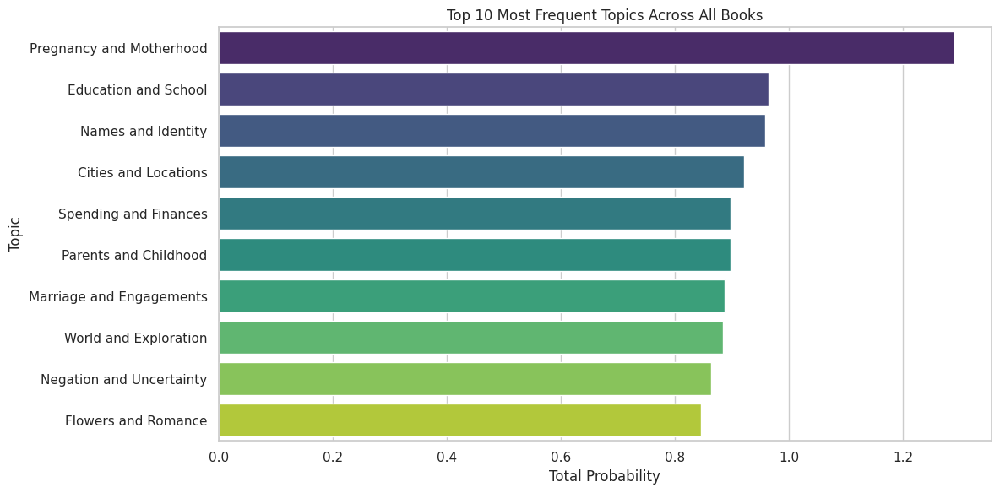

2024-11-14 21:48:35 - Successfully identified top 5 topics for each book using the alternative method.
2024-11-14 21:48:35 - No duplicated columns found.
2024-11-14 21:48:35 - Displaying expanded top 5 topics for the first few books:
                              Book Title               Top_1_Topic                  Top_2_Topic  \
0                     A Long Time Coming  Marriage and Engagements  Friendships and Social Life   
1                     A Not So Meet Cute  Pregnancy and Motherhood         Business and Careers   
2                           Ache for You        Hatred and Dislike             Pets and Animals   
3  An Accidental Date with a Billionaire     Spending and Finances           Nods and Agreement   
4                               Bad Boss      Education and School         Cities and Locations   

            Top_3_Topic                    Top_4_Topic             Top_5_Topic  
0   Flowers and Romance        Breaking and Letting Go  Planning and Decisions  
1        

<ipython-input-153-d6285a3def67>:173: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_frequency.values[:20], y=topic_frequency.index[:20], palette='viridis')


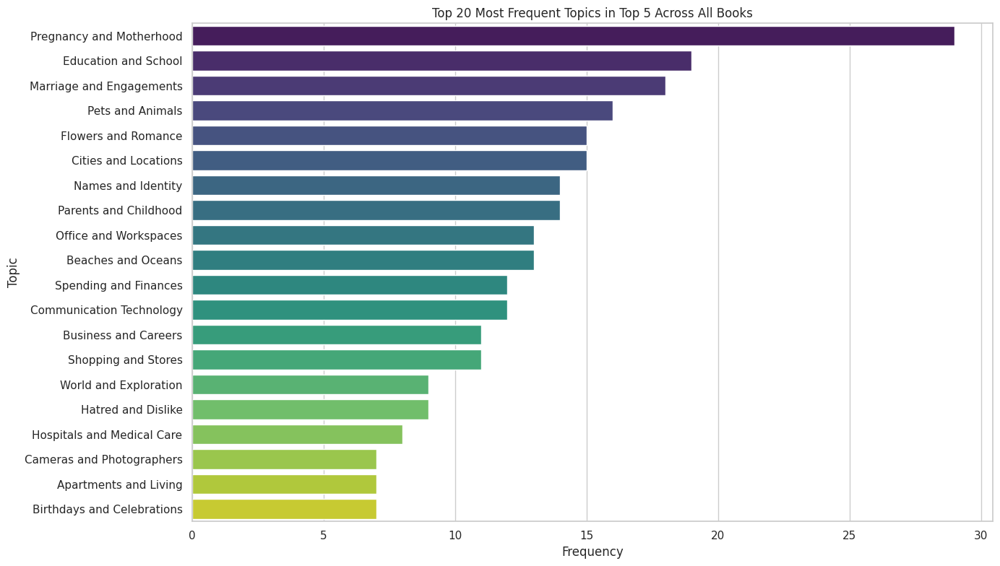

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.preprocessing import StandardScaler

def print_with_time(message):
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# Define file paths
weighted_topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/book_topics_weighted.csv'
topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv'
results_base_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/'

# Load the weighted topic probabilities per book
print_with_time(f"Loading weighted topic probabilities from: {weighted_topics_path}")
df_weighted = pd.read_csv(weighted_topics_path)
print_with_time("Weighted topic probabilities loaded successfully.")

# Display the first few rows
print_with_time("Displaying the first few rows of the weighted topic probabilities DataFrame:")
print(df_weighted.head())

# Identify topic columns
topic_columns = [col for col in df_weighted.columns if col.startswith('Topic_')]

# Strip any leading/trailing whitespace from column names
df_weighted.columns = df_weighted.columns.str.strip()

# Re-identify topic columns after stripping
topic_columns = [col for col in df_weighted.columns if col.startswith('Topic_')]

# Check data types of topic columns
print_with_time("Data types of topic columns:")
print(df_weighted[topic_columns].dtypes)

# Convert topic columns to numeric, coercing errors to NaN
df_weighted[topic_columns] = df_weighted[topic_columns].apply(pd.to_numeric, errors='coerce')

# Verify the conversion
print_with_time("Data types of topic columns after conversion:")
print(df_weighted[topic_columns].dtypes)

# Check for NaN values in topic columns
nan_counts = df_weighted[topic_columns].isna().sum()
print_with_time("Number of NaN values in each topic column:")
print(nan_counts)

# Handle NaNs by filling them with 0
df_weighted[topic_columns] = df_weighted[topic_columns].fillna(0)

# Re-verify no NaNs exist
print_with_time("NaN values after filling:")
print(df_weighted[topic_columns].isna().sum())

# Check for any non-numeric values within topic columns
for col in topic_columns:
    non_numeric = df_weighted[~df_weighted[col].apply(lambda x: isinstance(x, (int, float)))][col]
    if not non_numeric.empty:
        print_with_time(f"Non-numeric values found in {col}:")
        print(non_numeric)
    else:
        print_with_time(f"No non-numeric values found in {col}.")

# Load the topics and labels
print_with_time(f"Loading topic representations from: {topics_path}")
df_topics = pd.read_csv(topics_path)
print_with_time("Topic representations loaded successfully.")

# Ensure that Topic_Number is a string for mapping
df_topics['Topic_Number'] = df_topics['Topic_Number'].astype(str)

# Create a dictionary mapping topic numbers to labels
topic_labels = dict(zip(df_topics['Topic_Number'], df_topics['Label']))

# Create a mapping from 'Topic_#' to labels
topic_label_mapping = {col: topic_labels.get(col.split('_')[1], col) for col in topic_columns}

# Exploratory Analysis 1: Topic Frequency Across All Books

# Sum the normalized topic probabilities across all books and sort in descending order
topic_totals = df_weighted[topic_columns].sum().sort_values(ascending=False)

# Map topic columns to labels
topic_totals.index = topic_totals.index.map(topic_label_mapping)

# Display the top 10 and bottom 10 topics
top_10_topics = topic_totals.head(10)
bottom_10_topics = topic_totals.tail(10)

print_with_time("Top 10 most frequent topics across all books:")
print(top_10_topics.to_string())

print_with_time("Bottom 10 least frequent topics across all books:")
print(bottom_10_topics.to_string())

# Visualization: Bar chart of top 10 most frequent topics
plt.figure(figsize=(12, 6))
sns.barplot(
    x=top_10_topics.values,
    y=top_10_topics.index,
    hue=top_10_topics.index,
    palette='viridis',
    dodge=False
)
plt.title('Top 10 Most Frequent Topics Across All Books')
plt.xlabel('Total Probability')
plt.ylabel('Topic')
plt.legend([],[], frameon=False)  # Removes the legend
plt.tight_layout()
plt.show()

# Exploratory Analysis 2: Topic Distribution Per Book

# Modified function to return only topic labels
def get_top_topics_alternative(row, n=5):
    topics = row[topic_columns].sort_values(ascending=False).head(n)
    top_topics_labels = [topic_label_mapping.get(topic, topic) for topic in topics.index]
    return top_topics_labels

# Apply the modified function
df_weighted['Top_Topics'] = df_weighted.apply(get_top_topics_alternative, axis=1)
print_with_time("Successfully identified top 5 topics for each book using the alternative method.")

# Expand the 'Top_Topics' into separate columns
top_n = 5
top_topic_columns = [f"Top_{i}_Topic" for i in range(1, top_n+1)]
top_topics_expanded = df_weighted['Top_Topics'].apply(pd.Series)

# Rename the columns appropriately
top_topics_expanded = top_topics_expanded.rename(columns=lambda x: f"Top_{x+1}_Topic")

# Merge with the original DataFrame
df_weighted = pd.concat([df_weighted, top_topics_expanded], axis=1)

# Check for duplicated columns and remove if any
duplicated_columns = df_weighted.columns[df_weighted.columns.duplicated()]
if not duplicated_columns.empty:
    print_with_time(f"Duplicated columns found: {duplicated_columns.tolist()}")
    # Drop duplicated columns
    df_weighted = df_weighted.loc[:, ~df_weighted.columns.duplicated()]
    print_with_time("Duplicated columns have been removed.")
else:
    print_with_time("No duplicated columns found.")

# Example: Display the expanded top topics
print_with_time("Displaying expanded top 5 topics for the first few books:")
print(df_weighted[['Book Title'] + top_topic_columns].head())

# Aggregate Topic Frequencies in Top 5
print_with_time("Aggregating topic frequencies in top 5 across all books...")
melted_top_topics = df_weighted.melt(
    id_vars=['Book Title'],
    value_vars=top_topic_columns,
    var_name='Rank',
    value_name='Topic'
)

# Calculate frequency of each topic
topic_frequency = melted_top_topics['Topic'].value_counts().sort_values(ascending=False)

# Map to topic labels if not already done
# Assuming 'topic_label_mapping' maps topic identifiers to labels
topic_frequency = topic_frequency.rename(index=topic_label_mapping)

# Display the top 20 most frequent top topics
print_with_time("Top 20 most frequent topics in top 5 across all books:")
print(topic_frequency.head(20))

# Visualization: Bar chart of top 20 most frequent top topics
plt.figure(figsize=(14, 8))
sns.barplot(x=topic_frequency.values[:20], y=topic_frequency.index[:20], palette='viridis')
plt.title('Top 20 Most Frequent Topics in Top 5 Across All Books')
plt.xlabel('Frequency')
plt.ylabel('Topic')
plt.tight_layout()
plt.show()

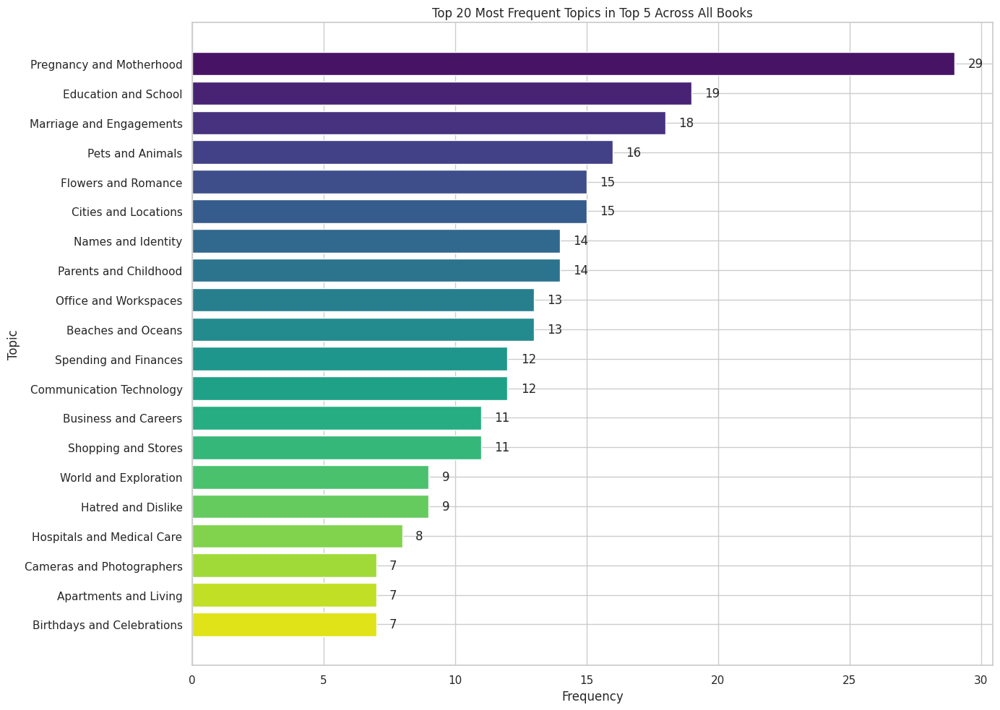

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define number of top topics
top_n = 20

# Get the top_n topics
top_topics = topic_frequency.head(top_n)

# Generate a color palette with as many colors as top topics
colors = sns.color_palette('viridis', top_n)

# Create a horizontal bar plot using Matplotlib
plt.figure(figsize=(14, 10))
bars = plt.barh(top_topics.index, top_topics.values, color=colors)

plt.title('Top 20 Most Frequent Topics in Top 5 Across All Books')
plt.xlabel('Frequency')
plt.ylabel('Topic')

# Invert y-axis to have the highest frequency on top
plt.gca().invert_yaxis()

# Add frequency labels to each bar
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.5, bar.get_y() + bar.get_height()/2,
             f'{width}', va='center')

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

def print_with_time(message):
    from datetime import datetime
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# ===============================
# 1. Identify Topic Columns
# ===============================
topic_columns = [col for col in df_weighted.columns if col.startswith('Topic_')]
print_with_time(f"Number of topic columns identified: {len(topic_columns)}")

# ===============================
# 2. Create Topic Label Mapping
# ===============================
topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv'
df_topics = pd.read_csv(topics_path)

# Ensure 'Topic_Number' is string and stripped
df_topics['Topic_Number'] = df_topics['Topic_Number'].astype(str).str.strip()

# Create mapping
topic_label_mapping = {f"Topic_{int(k)}": v for k, v in zip(df_topics['Topic_Number'], df_topics['Label'])}
print_with_time(f"Number of topics mapped: {len(topic_label_mapping)}")

# ===============================
# 3. Define Function to Extract Top N Topics
# ===============================
def extract_top_n_topics(row, n=10):
    topic_probs = row[topic_columns]
    top_topics = topic_probs.sort_values(ascending=False).head(n)
    top_topic_labels = top_topics.index.map(topic_label_mapping)

    top_dict = {}
    for i, (topic, prob) in enumerate(zip(top_topic_labels, top_topics.values), 1):
        top_dict[f"Top_{i}_Topic"] = topic
        top_dict[f"Top_{i}_Probability"] = prob

    return pd.Series(top_dict)

# ===============================
# 4. Apply Function to Extract Top 10 Topics
# ===============================
top_n = 10
print_with_time("Extracting top 10 topics for each book...")
top_topics_df = df_weighted.apply(extract_top_n_topics, axis=1, n=top_n)
df_weighted = pd.concat([df_weighted, top_topics_df], axis=1)

print_with_time("Displaying expanded top 10 topics for the first few books:")
columns_to_display = ['Book Title'] + [f"Top_{i}_Topic" for i in range(1, top_n+1)] + \
                     [f"Top_{i}_Probability" for i in range(1, top_n+1)]
print(df_weighted[columns_to_display].head())

# ===============================
# 5. Verify Mapping and Probabilities
# ===============================
unique_top_topics = pd.unique(top_topics_df[[f"Top_{i}_Topic" for i in range(1, top_n+1)]].values.ravel())
unmapped_topics = [topic for topic in unique_top_topics if topic is None or pd.isna(topic)]
if unmapped_topics:
    print_with_time(f"Warning: The following topics are unmapped: {unmapped_topics}")
else:
    print("All top topics are correctly mapped.")

# Check probabilities
probability_columns = [f"Top_{i}_Probability" for i in range(1, top_n+1)]
probabilities = df_weighted[probability_columns]

if ((probabilities >= 0).all().all()) and ((probabilities <= 1).all().all()):
    print("All probabilities are within the range [0, 1].")
else:
    print("Warning: Some probabilities are outside the range [0, 1].")

# Optionally, check the sum
df_weighted['Top_10_Sum'] = probabilities.sum(axis=1)
print("Sum of top 10 probabilities per book (first 5 books):")
print(df_weighted[['Book Title', 'Top_10_Sum']].head())

# ===============================
# 6. Save the Results
# ===============================
expanded_df_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/book_topics_top10.csv'
columns_to_save = ['Book Title'] + \
                 [f"Top_{i}_Topic" for i in range(1, top_n+1)] + \
                 [f"Top_{i}_Probability" for i in range(1, top_n+1)]
df_weighted[columns_to_save].to_csv(expanded_df_path, index=False)
print_with_time(f"Top 10 topics per book have been saved to {expanded_df_path}")

2024-11-14 21:54:17 - Number of topic columns identified: 216
2024-11-14 21:54:17 - Number of topics mapped: 216
2024-11-14 21:54:17 - Extracting top 10 topics for each book...
2024-11-14 21:54:18 - Displaying expanded top 10 topics for the first few books:
                              Book Title               Top_1_Topic               Top_1_Topic  \
0                     A Long Time Coming  Marriage and Engagements  Marriage and Engagements   
1                     A Not So Meet Cute  Pregnancy and Motherhood  Pregnancy and Motherhood   
2                           Ache for You        Hatred and Dislike        Hatred and Dislike   
3  An Accidental Date with a Billionaire     Spending and Finances     Spending and Finances   
4                               Bad Boss      Education and School      Education and School   

                   Top_2_Topic                  Top_2_Topic           Top_3_Topic  \
0  Friendships and Social Life  Friendships and Social Life   Flowers and Romanc

In [ ]:
import pandas as pd
from datetime import datetime

def print_with_time(message):
    """Prints a message with the current timestamp."""
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# Define file paths
merged_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/merged_novels_with_labels.csv'
topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv'
output_base_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/'

# Load the merged DataFrame (unweighted topics)
print_with_time(f"Loading merged DataFrame from: {merged_path}")
df_unweighted = pd.read_csv(merged_path)
print_with_time("Data loaded successfully.")

# Display the first few rows of the unweighted DataFrame
print_with_time("Displaying the first few rows of the unweighted DataFrame:")
print(df_unweighted.head())

# Check if 'Assigned_Topic' column exists
if 'Assigned_Topic' not in df_unweighted.columns:
    print_with_time("Error: 'Assigned_Topic' column not found in the DataFrame.")
else:
    # Check for missing values in 'Assigned_Topic'
    print_with_time("Checking for missing values in 'Assigned_Topic' column:")
    missing_values = df_unweighted['Assigned_Topic'].isna().sum()
    print(f"Missing values in 'Assigned_Topic': {missing_values}")

    # Handle missing values by dropping rows with missing 'Assigned_Topic'
    if missing_values > 0:
        df_unweighted = df_unweighted.dropna(subset=['Assigned_Topic'])
        print_with_time(f"Dropped {missing_values} rows with missing 'Assigned_Topic'.")

    # Ensure 'Assigned_Topic' is of type string for mapping
    df_unweighted['Assigned_Topic'] = df_unweighted['Assigned_Topic'].astype(str).str.strip()

    # Load the topics and labels
    print_with_time(f"Loading topic representations from: {topics_path}")
    df_topics = pd.read_csv(topics_path)
    print_with_time("Topic representations loaded successfully.")

    # Ensure that Topic_Number is a string for mapping
    df_topics['Topic_Number'] = df_topics['Topic_Number'].astype(str).str.strip()

    # Create a dictionary mapping topic numbers to labels
    topic_labels = dict(zip(df_topics['Topic_Number'], df_topics['Label']))

    # Count frequency of each Assigned_Topic
    topic_frequencies = df_unweighted['Assigned_Topic'].value_counts().sort_values(ascending=False)

    # Map topic numbers to labels
    topic_frequencies.index = topic_frequencies.index.map(lambda x: topic_labels.get(x, x))

    # Identify the top 10 and bottom 10 topics
    top_10_topics = topic_frequencies.head(10)
    bottom_10_topics = topic_frequencies.tail(10)

    # Display the top 10 most frequent topics
    print_with_time("Top 10 most frequent topics across all books:")
    print(top_10_topics.to_string())

    # Display the bottom 10 least frequent topics
    print_with_time("Bottom 10 least frequent topics across all books:")
    print(bottom_10_topics.to_string())

    # Optional: Save the frequency results to CSV files
    top_10_topics.to_csv(f"{output_base_path}top_10_unweighted_topics.csv", header=True)
    bottom_10_topics.to_csv(f"{output_base_path}bottom_10_unweighted_topics.csv", header=True)
    print_with_time(f"Top 10 and Bottom 10 unweighted topics have been saved to {output_base_path}")

2024-11-15 09:48:44 - Loading merged DataFrame from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/merged_novels_with_labels.csv
2024-11-15 09:49:03 - Data loaded successfully.
2024-11-15 09:49:03 - Displaying the first few rows of the unweighted DataFrame:
     Author               Book Title  Chapter  \
0  Ann_Cole  Mr. Mysterious In Black        1   
1  Ann_Cole  Mr. Mysterious In Black        1   
2  Ann_Cole  Mr. Mysterious In Black        1   
3  Ann_Cole  Mr. Mysterious In Black        1   
4  Ann_Cole  Mr. Mysterious In Black        1   

                                            Sentence  Assigned_Topic  \
0                            Prologue H e was tired.             210   
1                                         Dog-tired.             210   
2  Amped up by pleasure mere minutes ago, his hea...             175   
3  Unfortunately, he was yanked back from the bec...              23   
4  Languid, he opened his eyes to the annoying re...              12 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the visual style
sns.set(style="whitegrid")

# Plot Top 10 Topics
plt.figure(figsize=(12, 6))
sns.barplot(x=top_10_topics.values, y=top_10_topics.index, palette="viridis")
plt.title('Top 10 Most Frequent Topics Across All Books (Unweighted)')
plt.xlabel('Frequency')
plt.ylabel('Topic')
plt.tight_layout()
plt.show()

# Plot Bottom 10 Topics
plt.figure(figsize=(12, 6))
sns.barplot(x=bottom_10_topics.values, y=bottom_10_topics.index, palette="magma")
plt.title('Bottom 10 Least Frequent Topics Across All Books (Unweighted)')
plt.xlabel('Frequency')
plt.ylabel('Topic')
plt.tight_layout()
plt.show()

# Exploratory Analysis on Unweighted Topics

In [ ]:
import pandas as pd
import os
from datetime import datetime

def print_with_time(message):
    """Prints a message with the current timestamp."""
    print(f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')} - {message}")

# ===============================
# 1. Define File Paths
# ===============================
processed_novels_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/processed_novels_with_topic_probs.csv'
topics_representations_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv'
output_all_topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_all_topics.csv'

# ===============================
# 2. Load DataFrames
# ===============================
print_with_time(f"Loading processed novels from: {processed_novels_path}")
df_novels = pd.read_csv(processed_novels_path)
print_with_time("Processed novels loaded successfully.")

print_with_time(f"Loading topics representations from: {topics_representations_path}")
df_topics = pd.read_csv(topics_representations_path)
print_with_time("Topics representations loaded successfully.")

# ===============================
# 3. Create Topic_Number to Label Mapping
# ===============================
print_with_time("Creating Topic_Number to Label mapping dictionary.")
topic_label_mapping = pd.Series(df_topics.Label.values, index=df_topics.Topic_Number).to_dict()

# ===============================
# 4. Exclude Topic_7
# ===============================
topic_to_exclude = 7
if topic_to_exclude in topic_label_mapping:
    del topic_label_mapping[topic_to_exclude]
    print_with_time(f"Excluded 'Topic_{topic_to_exclude}' from the mapping.")
else:
    print_with_time(f"'Topic_{topic_to_exclude}' not found in the mapping. No exclusion needed.")

# ===============================
# 5. Verify All Topic Columns are Mapped
# ===============================
print_with_time("Verifying that all Topic_x columns are mapped.")
topic_columns = [col for col in df_novels.columns if col.startswith('Topic_')]
topic_numbers = [int(col.split('_')[1]) for col in topic_columns]

# Identify any topics missing from the mapping
missing_topics = [t for t in topic_numbers if t not in topic_label_mapping]

if missing_topics:
    print_with_time(f"Error: The following Topic_Numbers are missing in the mapping: {missing_topics}")
    # Optionally, remove these topics from analysis to prevent NaN labels
    topic_columns = [f"Topic_{t}" for t in topic_numbers if t not in missing_topics]
    df_novels = df_novels.drop(columns=[f"Topic_{t}" for t in missing_topics])
    print_with_time(f"Removed topics with missing labels: {missing_topics}")
else:
    print_with_time("All Topic_x columns are correctly mapped.")

# ===============================
# 6. Inspect Aggregated Data Before Transformation
# ===============================
print_with_time("Aggregating topic probabilities per book by summing over all sentences.")
df_books = df_novels.groupby('Book Title')[topic_columns].sum().reset_index()
print_with_time("Aggregation completed.")

# Diagnostic: Check aggregated sums
print_with_time("Inspecting aggregated topic probabilities per book.")
print(df_books.head())

print_with_time("Descriptive statistics of aggregated topic probabilities:")
print(df_books[topic_columns].describe())

# Check if multiple topics have non-zero sums
non_zero_topics = df_books[topic_columns].astype(bool).sum()
print_with_time("Number of books with non-zero sum for each topic:")
print(non_zero_topics)

# ===============================
# 7. Transform the DataFrame to Long Format
# ===============================
print_with_time("Transforming the aggregated DataFrame to long format.")
df_melted = df_books.melt(id_vars=['Book Title'], var_name='Topic', value_name='Probability')
print_with_time("Transformation to long format completed.")

# Diagnostic: Check melted DataFrame
print_with_time("Inspecting the melted DataFrame (first 10 rows):")
print(df_melted.head(10))

# ===============================
# 8. Map Topics to Labels
# ===============================
print_with_time("Mapping each Topic to its corresponding Label.")
# Extract the numerical part of the Topic
df_melted['Topic_Number'] = df_melted['Topic'].apply(lambda x: int(x.split('_')[1]))
# Map the Topic_Number to its Label using the mapping dictionary
df_melted['Topic_Label'] = df_melted['Topic_Number'].map(topic_label_mapping)

# Diagnostic: Check for unmapped topics
missing_labels = df_melted[df_melted['Topic_Label'].isnull()]['Topic_Number'].unique()
if len(missing_labels) > 0:
    print_with_time(f"Warning: The following Topic_Numbers have no mapped Label: {missing_labels}")
    # Assign 'Unknown' to missing labels
    df_melted['Topic_Label'] = df_melted['Topic_Label'].fillna('Unknown')
    print_with_time("Assigned 'Unknown' to missing labels.")
else:
    print_with_time("All Topic_Numbers have corresponding Labels.")

# ===============================
# 9. Exclude Topic_7 if Present
# ===============================
print_with_time(f"Excluding 'Topic_{topic_to_exclude}' from the final DataFrame if present.")
df_melted = df_melted[df_melted['Topic_Number'] != topic_to_exclude]
print_with_time(f"Excluded 'Topic_{topic_to_exclude}' successfully.")

# ===============================
# 10. Finalizing the DataFrame
# ===============================
# Optionally, remove topics with zero probability
# Uncomment the following line if you wish to exclude topics with zero probabilities
# df_melted = df_melted[df_melted['Probability'] > 0]

# Drop 'Topic_Number' as it's redundant after mapping
df_melted.drop(columns=['Topic_Number'], inplace=True)

# Reorder columns for clarity
df_melted = df_melted[['Book Title', 'Topic', 'Topic_Label', 'Probability']]

print_with_time("Finalizing the DataFrame.")
print(df_melted.head(10))

# Diagnostic: Check the number of unique topics
unique_topics = df_melted['Topic'].nunique()
print_with_time(f"Number of unique topics in the final DataFrame: {unique_topics}")

# Diagnostic: Check if multiple topics per book exist
topics_per_book = df_melted.groupby('Book Title')['Topic'].nunique().describe()
print_with_time("Statistics on the number of unique topics per book:")
print(topics_per_book)

# ===============================
# 11. Save to CSV
# ===============================
print_with_time(f"Saving the final DataFrame to: {output_all_topics_path}")
# Ensure the output directory exists
output_dir = os.path.dirname(output_all_topics_path)
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print_with_time(f"Created output directory at: {output_dir}")

df_melted.to_csv(output_all_topics_path, index=False)
print_with_time("all_books_all_topics.csv saved successfully.")

2024-11-15 20:30:04 - Loading processed novels from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/processed_novels_with_topic_probs.csv
2024-11-15 20:30:27 - Processed novels loaded successfully.
2024-11-15 20:30:27 - Loading topics representations from: /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/topics_representations.csv
2024-11-15 20:30:27 - Topics representations loaded successfully.
2024-11-15 20:30:27 - Creating Topic_Number to Label mapping dictionary.
2024-11-15 20:30:27 - Excluded 'Topic_7' from the mapping.
2024-11-15 20:30:27 - Verifying that all Topic_x columns are mapped.
2024-11-15 20:30:27 - Error: The following Topic_Numbers are missing in the mapping: [7]
2024-11-15 20:30:28 - Removed topics with missing labels: [7]
2024-11-15 20:30:28 - Aggregating topic probabilities per book by summing over all sentences.
2024-11-15 20:30:28 - Aggregation completed.
2024-11-15 20:30:28 - Inspecting aggregated topic probabilities per book.
    

In [ ]:
import pandas as pd

# Define the path to your final CSV
output_all_topics_path = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_all_topics.csv'

# Load the final CSV
df_all_topics = pd.read_csv(output_all_topics_path)

# Choose a specific book to inspect
specific_book = 'A Long Time Coming'  # Replace with an actual book title from your dataset

# Filter the DataFrame for the specific book
df_specific_book = df_all_topics[df_all_topics['Book Title'] == specific_book]

# Display all topics for the specific book
print(f"All topics for the book: {specific_book}")
print(df_specific_book)

All topics for the book: A Long Time Coming
               Book Title      Topic                       Topic_Label  \
0      A Long Time Coming    Topic_0  Expressions of Joy and Amusement   
105    A Long Time Coming    Topic_1                  Dining and Meals   
210    A Long Time Coming    Topic_2       Bedroom Setting and Comfort   
315    A Long Time Coming    Topic_3          Cars and Luxury Vehicles   
420    A Long Time Coming    Topic_4          Negation and Uncertainty   
...                   ...        ...                               ...   
22050  A Long Time Coming  Topic_211          Charity and Philanthropy   
22155  A Long Time Coming  Topic_212  Martial Arts and Physical Combat   
22260  A Long Time Coming  Topic_213            Comfort and Relaxation   
22365  A Long Time Coming  Topic_214        Fireplaces and Cozy Spaces   
22470  A Long Time Coming  Topic_215             Doubt and Uncertainty   

       Probability  
0        79.474938  
105      56.317327  
210 

In [ ]:
# Count the number of topics per book
topics_per_book = df_all_topics.groupby('Book Title')['Topic'].nunique()

print("Number of unique topics per book:")
print(topics_per_book.describe())

Number of unique topics per book:
count    105.0
mean     215.0
std        0.0
min      215.0
25%      215.0
50%      215.0
75%      215.0
max      215.0
Name: Topic, dtype: float64


In [ ]:
# Sort the topics for the specific book by Probability in descending order
df_specific_book_sorted = df_specific_book.sort_values(by='Probability', ascending=False)

print(f"Top topics for the book: {specific_book}")
print(df_specific_book_sorted.head(10))

Top topics for the book: A Long Time Coming
               Book Title      Topic                       Topic_Label  \
7245   A Long Time Coming   Topic_70            Leaving and Letting Go   
12180  A Long Time Coming  Topic_117             Possession and Desire   
21000  A Long Time Coming  Topic_201           Happiness and Gratitude   
7455   A Long Time Coming   Topic_72                Love and Affection   
10605  A Long Time Coming  Topic_102            Pleasure and Seduction   
13440  A Long Time Coming  Topic_129           Breaking and Letting Go   
18270  A Long Time Coming  Topic_175          Moments and Realizations   
1365   A Long Time Coming   Topic_14   Conversations and Communication   
1155   A Long Time Coming   Topic_12              Nightlife and Events   
0      A Long Time Coming    Topic_0  Expressions of Joy and Amusement   

       Probability  
7245     89.640460  
12180    89.233251  
21000    88.470986  
7455     87.735891  
10605    86.409227  
13440    84.696

In [ ]:
# Get the list of all unique topics
all_unique_topics = df_all_topics['Topic'].unique()
print(f"Total unique topics in the final CSV: {len(all_unique_topics)}")

Total unique topics in the final CSV: 215


In [ ]:
# Calculate the sum of probabilities per book
sum_probabilities = df_all_topics.groupby('Book Title')['Probability'].sum()

print("Sum of probabilities per book:")
print(sum_probabilities.head())

Sum of probabilities per book:
Book Title
A Long Time Coming                       10636.420790
A Not So Meet Cute                        9423.447186
Ache for You                              7527.456728
An Accidental Date with a Billionaire     3377.272689
Bad Boss                                  5781.659894
Name: Probability, dtype: float64


# Clustering Book Titles Based on the Probabilities of Topic Occurrences

In [ ]:
!pip install umap-learn
!pip install scikit-optimize
!pip install scikit-learn
!pip install seaborn
!pip install matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 11.1 MB/s eta 0:00:00


2024-11-15 22:49:53 - Loading data...
2024-11-15 22:49:53 - Data loaded successfully.
2024-11-15 22:49:53 - Scaling features...
2024-11-15 22:49:53 - Feature scaling completed.
2024-11-15 22:49:53 - Determining the optimal number of clusters (K)...
2024-11-15 22:49:53 - Applying Elbow Method...
2024-11-15 22:50:50 - Elbow Method completed.


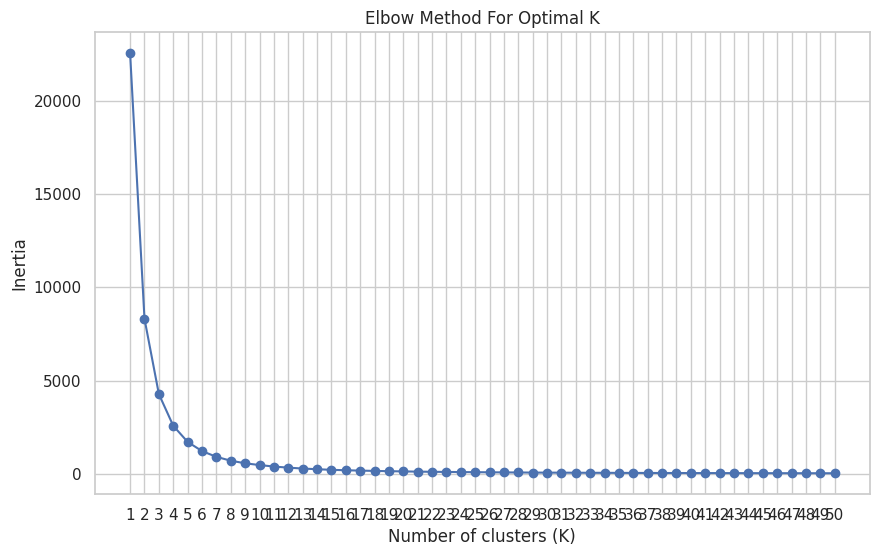

2024-11-15 22:50:50 - Applying Silhouette Analysis...
2024-11-15 22:55:47 - Silhouette Analysis completed.


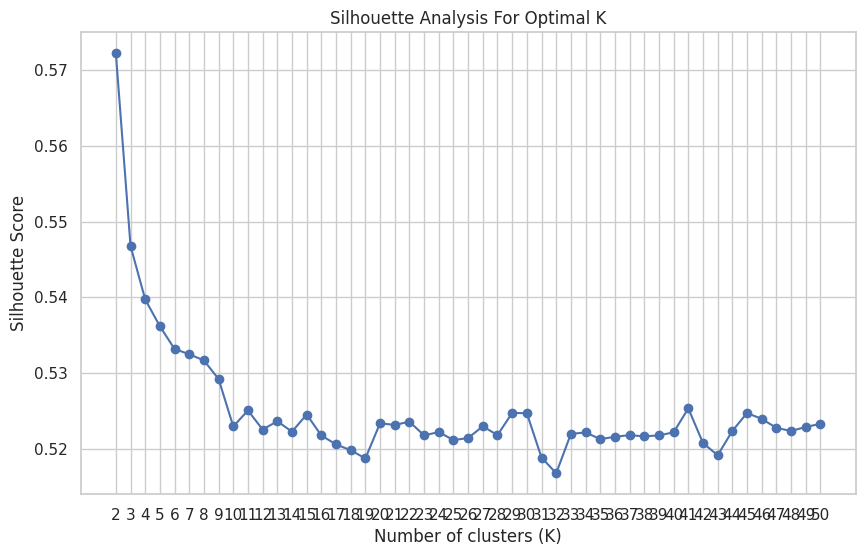

2024-11-15 22:55:47 - Optimal number of clusters determined: K = 2
2024-11-15 22:55:47 - Fitting K-Means with K=2...
2024-11-15 22:55:48 - K-Means fitting completed.
2024-11-15 22:55:48 - Evaluating clustering performance...
2024-11-15 22:55:53 - Silhouette Score: 0.5722427333064353
2024-11-15 22:55:53 - Davies-Bouldin Index: 0.6045241079073163
2024-11-15 22:55:53 - Visualizing clusters using UMAP...
2024-11-15 23:00:36 - Error in visualization: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices
2024-11-15 23:00:36 - Visualizing clusters using t-SNE...
2024-11-15 23:00:37 - Error in visualization: n_components=2 must be between 1 and min(n_samples, n_features)=1 with svd_solver='randomized'
2024-11-15 23:00:37 - Saving clustered data to CSV...
2024-11-15 23:00:37 - Clustered data saved to /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_clustered_KMeans.csv


In [ ]:
# Import Necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")

# Helper Function for Timestamped Prints
def print_with_timestamp(message):
    """Prints a message with the current timestamp."""
    current_time = datetime.now().strftime('%Y-%m-%d %H:%M:%S')
    print(f"{current_time} - {message}")

# 1. Load and Preprocess the Data
def load_and_preprocess_data(filepath):
    try:
        print_with_timestamp("Loading data...")
        df = pd.read_csv(filepath)
        print_with_timestamp("Data loaded successfully.")

        # Inspect the first few rows (optional)
        # print(df.head())

        # Drop irrelevant columns (modify as per your dataset)
        # Assuming 'Book Title', 'Topic', 'Topic_Label' are non-feature columns
        feature_cols = [col for col in df.columns if col not in ['Book Title', 'Topic', 'Topic_Label']]
        X = df[feature_cols]

        # Handle missing values by filling with zero (modify as needed)
        if X.isnull().sum().sum() > 0:
            print_with_timestamp("Handling missing values by filling with zeros...")
            X = X.fillna(0)

        # Feature Scaling
        print_with_timestamp("Scaling features...")
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        print_with_timestamp("Feature scaling completed.")

        return df, X_scaled
    except Exception as e:
        print_with_timestamp(f"Error in loading and preprocessing data: {e}")
        sys.exit(1)

# 2. Determine the Optimal Number of Clusters (K)
def determine_optimal_k(X, max_k=50):
    print_with_timestamp("Determining the optimal number of clusters (K)...")

    # Elbow Method
    print_with_timestamp("Applying Elbow Method...")
    inertia = []
    K = range(1, max_k+1)
    for k in K:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
        kmeans.fit(X)
        inertia.append(kmeans.inertia_)
    print_with_timestamp("Elbow Method completed.")

    # Plot Elbow Method
    plt.figure(figsize=(10, 6))
    plt.plot(K, inertia, 'bo-')
    plt.xlabel('Number of clusters (K)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method For Optimal K')
    plt.xticks(K)
    plt.show()

    # Silhouette Analysis
    print_with_timestamp("Applying Silhouette Analysis...")
    silhouette_scores = []
    K_sil = range(2, max_k+1)
    for k in K_sil:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
        labels = kmeans.fit_predict(X)
        score = silhouette_score(X, labels)
        silhouette_scores.append(score)
    print_with_timestamp("Silhouette Analysis completed.")

    # Plot Silhouette Scores
    plt.figure(figsize=(10, 6))
    plt.plot(K_sil, silhouette_scores, 'bo-')
    plt.xlabel('Number of clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Analysis For Optimal K')
    plt.xticks(K_sil)
    plt.show()

    # Determine Optimal K (you can choose based on the plots)
    # For simplicity, let's choose the K with the highest Silhouette Score
    optimal_k = K_sil[np.argmax(silhouette_scores)]
    print_with_timestamp(f"Optimal number of clusters determined: K = {optimal_k}")

    return optimal_k

# 3. Fit K-Means with the Optimal K
def fit_kmeans(X, k):
    print_with_timestamp(f"Fitting K-Means with K={k}...")
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
    labels = kmeans.fit_predict(X)
    print_with_timestamp("K-Means fitting completed.")
    return labels, kmeans

# 4. Evaluate Clustering Performance
def evaluate_clustering(X, labels):
    print_with_timestamp("Evaluating clustering performance...")
    sil_score = silhouette_score(X, labels)
    db_index = davies_bouldin_score(X, labels)
    print_with_timestamp(f"Silhouette Score: {sil_score}")
    print_with_timestamp(f"Davies-Bouldin Index: {db_index}")
    return sil_score, db_index

# 5. Visualize the Clusters
def visualize_clusters(df, labels, method='UMAP'):
    print_with_timestamp(f"Visualizing clusters using {method}...")
    try:
        if method == 'UMAP':
            import umap
            reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean', random_state=42)
            embedding = reducer.fit_transform(df)
            df['UMAP_1'] = embedding[:, 0]
            df['UMAP_2'] = embedding[:, 1]
            plt.figure(figsize=(12, 8))
            sns.scatterplot(x='UMAP_1', y='UMAP_2', hue=labels, palette='viridis', data=df, legend='full', alpha=0.7)
            plt.title('UMAP Projection Colored by K-Means Clusters')
            plt.legend(title='Cluster')
            plt.show()

        elif method == 't-SNE':
            from sklearn.manifold import TSNE
            tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
            embedding = tsne.fit_transform(df)
            df['tSNE_1'] = embedding[:, 0]
            df['tSNE_2'] = embedding[:, 1]
            plt.figure(figsize=(12, 8))
            sns.scatterplot(x='tSNE_1', y='tSNE_2', hue=labels, palette='viridis', data=df, legend='full', alpha=0.7)
            plt.title('t-SNE Projection Colored by K-Means Clusters')
            plt.legend(title='Cluster')
            plt.show()

        else:
            print_with_timestamp("Unsupported visualization method.")
    except Exception as e:
        print_with_timestamp(f"Error in visualization: {e}")

# 6. Save the Clustered Data
def save_clustered_data(df, output_path):
    try:
        print_with_timestamp("Saving clustered data to CSV...")
        df.to_csv(output_path, index=False)
        print_with_timestamp(f"Clustered data saved to {output_path}")
    except Exception as e:
        print_with_timestamp(f"Error in saving data: {e}")

# Main Function to Execute the Pipeline
def main():
    # Define File Paths
    input_filepath = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_all_topics.csv'
    output_filepath = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_clustered_KMeans.csv'

    # Step 1: Load and Preprocess Data
    df, X_scaled = load_and_preprocess_data(input_filepath)

    # Step 2: Determine Optimal K
    optimal_k = determine_optimal_k(X_scaled, max_k=50)

    # Step 3: Fit K-Means
    labels, kmeans_model = fit_kmeans(X_scaled, optimal_k)

    # Step 4: Evaluate Clustering
    sil_score, db_index = evaluate_clustering(X_scaled, labels)

    # Step 5: Visualize Clusters
    # Note: For visualization, we'll use the feature data without scaling
    # If UMAP or t-SNE is computationally intensive, consider reducing n_components or using a subset
    visualize_clusters(X_scaled, labels, method='UMAP')
    visualize_clusters(X_scaled, labels, method='t-SNE')

    # Step 6: Assign Labels to Original Data and Save
    df['KMeans_Cluster'] = labels
    save_clustered_data(df, output_filepath)

# Execute the Main Function
if __name__ == "__main__":
    main()

2024-11-15 23:16:13 - Loading data...
2024-11-15 23:16:13 - Data loaded successfully.
2024-11-15 23:16:13 - Scaling features...
2024-11-15 23:16:13 - Feature scaling completed.
2024-11-15 23:16:13 - Determining the top three optimal number of clusters (K)...
2024-11-15 23:16:13 - Applying Elbow Method...
2024-11-15 23:17:10 - Elbow Method completed.


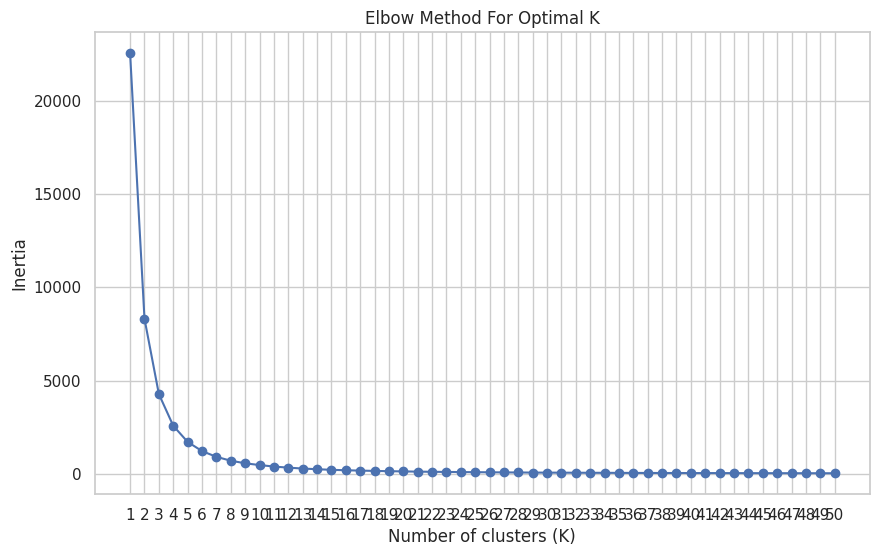

2024-11-15 23:17:10 - Applying Silhouette Analysis...
2024-11-15 23:22:08 - Silhouette Analysis completed.


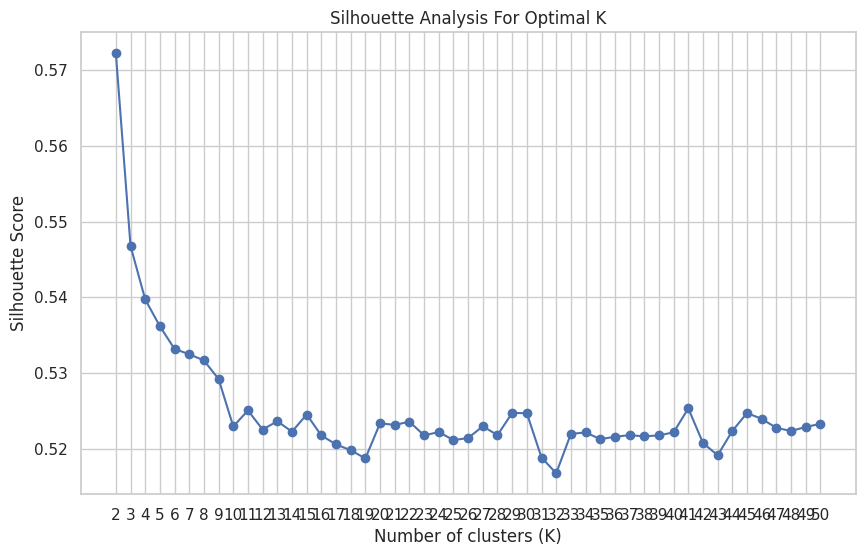

2024-11-15 23:22:08 - Top three optimal number of clusters determined: K = [2, 3, 4]
2024-11-15 23:22:08 - Fitting K-Means with K=2...
2024-11-15 23:22:09 - K-Means with K=2 fitting completed.
2024-11-15 23:22:09 - Fitting K-Means with K=3...
2024-11-15 23:22:10 - K-Means with K=3 fitting completed.
2024-11-15 23:22:10 - Fitting K-Means with K=4...
2024-11-15 23:22:10 - K-Means with K=4 fitting completed.
2024-11-15 23:22:10 - Evaluating clustering performance...
2024-11-15 23:22:16 - K=2 - Silhouette Score: 0.5722
2024-11-15 23:22:16 - K=2 - Davies-Bouldin Index: 0.6045
2024-11-15 23:22:21 - K=3 - Silhouette Score: 0.5468
2024-11-15 23:22:21 - K=3 - Davies-Bouldin Index: 0.5633
2024-11-15 23:22:26 - K=4 - Silhouette Score: 0.5397
2024-11-15 23:22:26 - K=4 - Davies-Bouldin Index: 0.5413
2024-11-15 23:22:26 - Visualizing clusters using UMAP...
2024-11-15 23:22:26 - Error in visualization: could not convert string to float: 'A Long Time Coming'
2024-11-15 23:22:26 - Visualizing clusters 

In [ ]:
# Import Necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.manifold import TSNE
import umap
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")

# Helper Function for Timestamped Prints
def print_with_timestamp(message):
    """Prints a message with the current timestamp."""
    current_time = datetime.now().strftime('%Y-%m-%d %H:%M:%S')
    print(f"{current_time} - {message}")

# 1. Load and Preprocess the Data
def load_and_preprocess_data(filepath):
    try:
        print_with_timestamp("Loading data...")
        df = pd.read_csv(filepath)
        print_with_timestamp("Data loaded successfully.")

        # Drop irrelevant columns (modify as per your dataset)
        # Assuming 'Book Title', 'Topic', 'Topic_Label' are non-feature columns
        feature_cols = [col for col in df.columns if col not in ['Book Title', 'Topic', 'Topic_Label']]
        X = df[feature_cols]

        # Handle missing values by filling with zero (modify as needed)
        if X.isnull().sum().sum() > 0:
            print_with_timestamp("Handling missing values by filling with zeros...")
            X = X.fillna(0)

        # Feature Scaling
        print_with_timestamp("Scaling features...")
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        print_with_timestamp("Feature scaling completed.")

        return df, X_scaled
    except Exception as e:
        print_with_timestamp(f"Error in loading and preprocessing data: {e}")
        sys.exit(1)

# 2. Determine the Top Three Optimal Number of Clusters (K)
def determine_top_three_k(X, max_k=50):
    print_with_timestamp("Determining the top three optimal number of clusters (K)...")

    # Elbow Method
    print_with_timestamp("Applying Elbow Method...")
    inertia = []
    K = range(1, max_k+1)
    for k in K:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
        kmeans.fit(X)
        inertia.append(kmeans.inertia_)
    print_with_timestamp("Elbow Method completed.")

    # Plot Elbow Method
    plt.figure(figsize=(10, 6))
    plt.plot(K, inertia, 'bo-')
    plt.xlabel('Number of clusters (K)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method For Optimal K')
    plt.xticks(K)
    plt.grid(True)
    plt.show()

    # Silhouette Analysis
    print_with_timestamp("Applying Silhouette Analysis...")
    silhouette_scores = []
    K_sil = range(2, max_k+1)
    for k in K_sil:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
        labels = kmeans.fit_predict(X)
        score = silhouette_score(X, labels)
        silhouette_scores.append(score)
    print_with_timestamp("Silhouette Analysis completed.")

    # Plot Silhouette Scores
    plt.figure(figsize=(10, 6))
    plt.plot(K_sil, silhouette_scores, 'bo-')
    plt.xlabel('Number of clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Analysis For Optimal K')
    plt.xticks(K_sil)
    plt.grid(True)
    plt.show()

    # Determine Top Three K's with Highest Silhouette Scores
    silhouette_scores_series = pd.Series(silhouette_scores, index=K_sil)
    top_three_k = silhouette_scores_series.nlargest(3).index.tolist()
    print_with_timestamp(f"Top three optimal number of clusters determined: K = {top_three_k}")

    return top_three_k

# 3. Fit K-Means with Each of the Top Three K's
def fit_kmeans_multiple_k(X, top_ks):
    cluster_labels = {}
    kmeans_models = {}

    for k in top_ks:
        print_with_timestamp(f"Fitting K-Means with K={k}...")
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
        labels = kmeans.fit_predict(X)
        cluster_labels[k] = labels
        kmeans_models[k] = kmeans
        print_with_timestamp(f"K-Means with K={k} fitting completed.")

    return cluster_labels, kmeans_models

# 4. Evaluate Clustering Performance
def evaluate_clustering(X, cluster_labels, top_ks):
    evaluation_results = {}

    print_with_timestamp("Evaluating clustering performance...")
    for k in top_ks:
        labels = cluster_labels[k]
        sil_score = silhouette_score(X, labels)
        db_index = davies_bouldin_score(X, labels)
        evaluation_results[k] = {'Silhouette Score': sil_score, 'Davies-Bouldin Index': db_index}
        print_with_timestamp(f"K={k} - Silhouette Score: {sil_score:.4f}")
        print_with_timestamp(f"K={k} - Davies-Bouldin Index: {db_index:.4f}")

    return evaluation_results

# 5. Visualize the Clusters
def visualize_clusters(df_original, cluster_labels, top_ks, method='UMAP'):
    print_with_timestamp(f"Visualizing clusters using {method}...")
    try:
        if method == 'UMAP':
            reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean', random_state=42)
            embedding = reducer.fit_transform(df_original)
            df_original['UMAP_1'] = embedding[:, 0]
            df_original['UMAP_2'] = embedding[:, 1]

            for k in top_ks:
                plt.figure(figsize=(12, 8))
                sns.scatterplot(x='UMAP_1', y='UMAP_2', hue=cluster_labels[k], palette='viridis', data=df_original, legend='full', alpha=0.7)
                plt.title(f'UMAP Projection Colored by K-Means Clusters (K={k})')
                plt.legend(title='Cluster')
                plt.show()

        elif method == 't-SNE':
            tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
            embedding = tsne.fit_transform(df_original)
            df_original['tSNE_1'] = embedding[:, 0]
            df_original['tSNE_2'] = embedding[:, 1]

            for k in top_ks:
                plt.figure(figsize=(12, 8))
                sns.scatterplot(x='tSNE_1', y='tSNE_2', hue=cluster_labels[k], palette='viridis', data=df_original, legend='full', alpha=0.7)
                plt.title(f't-SNE Projection Colored by K-Means Clusters (K={k})')
                plt.legend(title='Cluster')
                plt.show()

        else:
            print_with_timestamp("Unsupported visualization method.")
    except Exception as e:
        print_with_timestamp(f"Error in visualization: {e}")

# 6. Save the Clustered Data
def save_clustered_data(df, cluster_labels, top_ks, output_path):
    try:
        print_with_timestamp("Assigning cluster labels to the DataFrame...")
        for k in top_ks:
            df[f'KMeans_Cluster_K{k}'] = cluster_labels[k]

        print_with_timestamp("Saving clustered data to CSV...")
        df.to_csv(output_path, index=False)
        print_with_timestamp(f"Clustered data saved to {output_path}")
    except Exception as e:
        print_with_timestamp(f"Error in saving data: {e}")

# Main Function to Execute the Pipeline
def main():
    # Define File Paths
    input_filepath = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_all_topics.csv'
    output_filepath = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_clustered_KMeans.csv'

    # Step 1: Load and Preprocess Data
    df_original, X_scaled = load_and_preprocess_data(input_filepath)

    # Step 2: Determine Top Three Optimal K's
    top_three_k = determine_top_three_k(X_scaled, max_k=50)

    # Step 3: Fit K-Means for Each Top K
    cluster_labels, kmeans_models = fit_kmeans_multiple_k(X_scaled, top_three_k)

    # Step 4: Evaluate Clustering Performance
    evaluation_results = evaluate_clustering(X_scaled, cluster_labels, top_three_k)

    # Step 5: Visualize Clusters
    # For visualization, use the original (unscaled) data
    # If the dataset is large, consider sampling for visualization
    visualize_clusters(df_original.copy(), cluster_labels, top_three_k, method='UMAP')
    visualize_clusters(df_original.copy(), cluster_labels, top_three_k, method='t-SNE')

    # Step 6: Assign Cluster Labels and Save
    save_clustered_data(df_original, cluster_labels, top_three_k, output_filepath)

# Execute the Main Function
if __name__ == "__main__":
    main()


2024-11-15 23:39:00 - Loading data...
2024-11-15 23:39:00 - Data loaded successfully.
2024-11-15 23:39:00 - Scaling features...
2024-11-15 23:39:00 - Feature scaling completed.
2024-11-15 23:39:00 - Determining the top three optimal number of clusters (K)...
2024-11-15 23:39:00 - Applying Elbow Method...
2024-11-15 23:39:58 - Elbow Method completed.


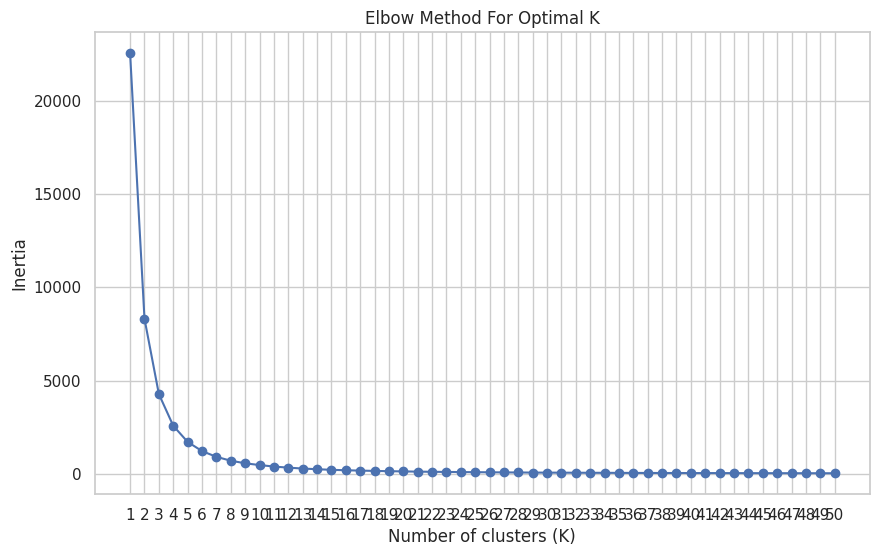

2024-11-15 23:39:59 - Applying Silhouette Analysis...
2024-11-15 23:44:57 - Silhouette Analysis completed.


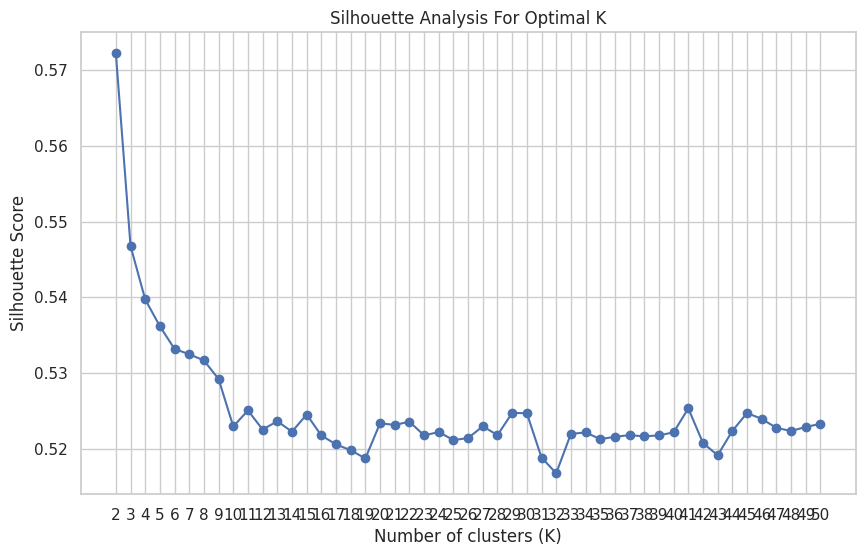

2024-11-15 23:44:58 - Top three optimal number of clusters determined: K = [2, 3, 4]
2024-11-15 23:44:58 - Fitting K-Means with K=2...
2024-11-15 23:44:58 - K-Means with K=2 fitting completed.
2024-11-15 23:44:58 - Fitting K-Means with K=3...
2024-11-15 23:44:59 - K-Means with K=3 fitting completed.
2024-11-15 23:44:59 - Fitting K-Means with K=4...
2024-11-15 23:45:00 - K-Means with K=4 fitting completed.
2024-11-15 23:45:00 - Evaluating clustering performance...
2024-11-15 23:45:06 - K=2 - Silhouette Score: 0.5722
2024-11-15 23:45:06 - K=2 - Davies-Bouldin Index: 0.6045
2024-11-15 23:45:11 - K=3 - Silhouette Score: 0.5468
2024-11-15 23:45:11 - K=3 - Davies-Bouldin Index: 0.5633
2024-11-15 23:45:16 - K=4 - Silhouette Score: 0.5397
2024-11-15 23:45:16 - K=4 - Davies-Bouldin Index: 0.5413
2024-11-15 23:45:16 - Visualizing clusters using UMAP...


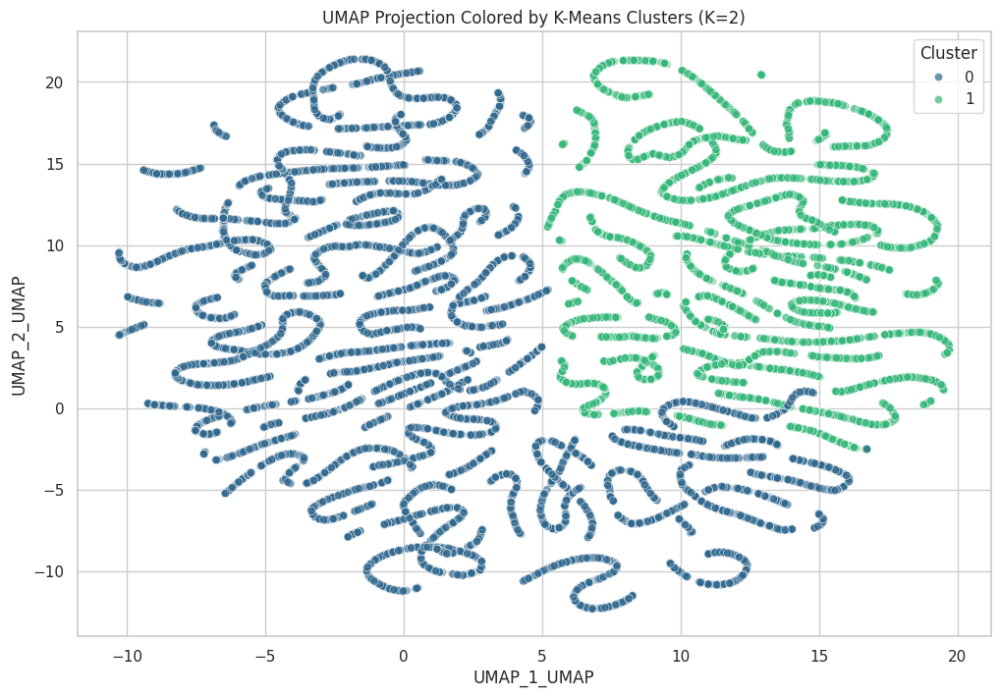

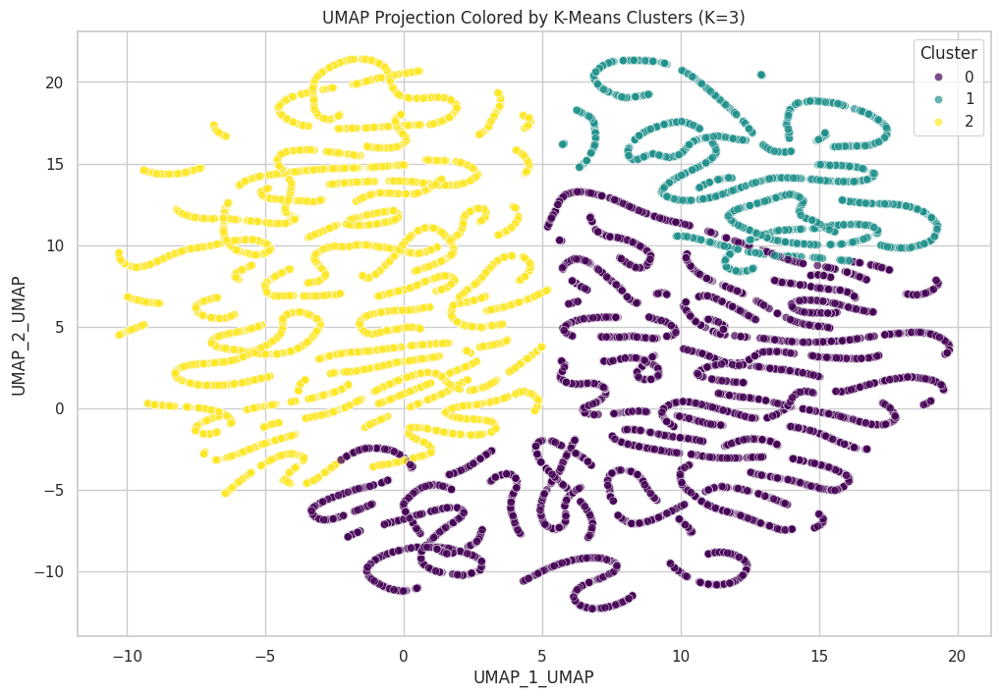

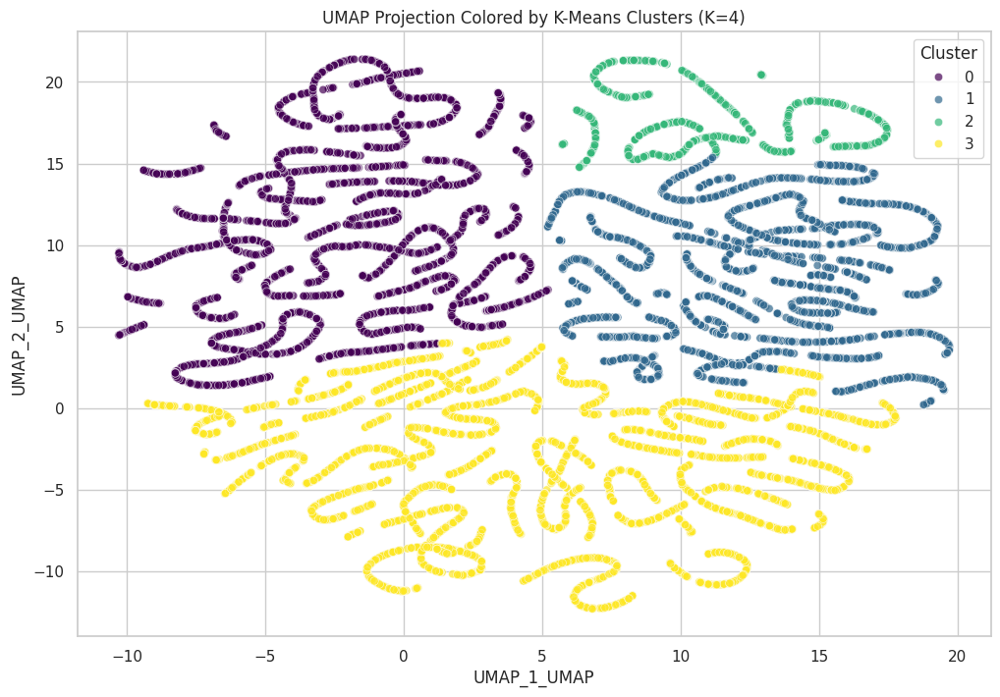

2024-11-15 23:50:13 - Visualizing clusters using t-SNE...
2024-11-15 23:50:14 - Error in visualization: n_components=2 must be between 1 and min(n_samples, n_features)=1 with svd_solver='randomized'
2024-11-15 23:50:14 - Assigning cluster labels to the DataFrame...
2024-11-15 23:50:14 - Saving clustered data to CSV...
2024-11-15 23:50:14 - Clustered data saved to /content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_clustered_KMeans.csv


In [ ]:
# Import Necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.manifold import TSNE
import umap
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")

# Helper Function for Timestamped Prints
def print_with_timestamp(message):
    """Prints a message with the current timestamp."""
    current_time = datetime.now().strftime('%Y-%m-%d %H:%M:%S')
    print(f"{current_time} - {message}")

# 1. Load and Preprocess the Data
def load_and_preprocess_data(filepath):
    try:
        print_with_timestamp("Loading data...")
        df = pd.read_csv(filepath)
        print_with_timestamp("Data loaded successfully.")

        # Drop irrelevant columns (modify as per your dataset)
        # Assuming 'Book Title', 'Topic', 'Topic_Label' are non-feature columns
        feature_cols = [col for col in df.columns if col not in ['Book Title', 'Topic', 'Topic_Label']]
        X = df[feature_cols]

        # Handle missing values by filling with zero (modify as needed)
        if X.isnull().sum().sum() > 0:
            print_with_timestamp("Handling missing values by filling with zeros...")
            X = X.fillna(0)

        # Feature Scaling
        print_with_timestamp("Scaling features...")
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        print_with_timestamp("Feature scaling completed.")

        return df, X_scaled
    except Exception as e:
        print_with_timestamp(f"Error in loading and preprocessing data: {e}")
        sys.exit(1)

# 2. Determine the Top Three Optimal Number of Clusters (K)
def determine_top_three_k(X, max_k=50):
    print_with_timestamp("Determining the top three optimal number of clusters (K)...")

    # Elbow Method
    print_with_timestamp("Applying Elbow Method...")
    inertia = []
    K = range(1, max_k+1)
    for k in K:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
        kmeans.fit(X)
        inertia.append(kmeans.inertia_)
    print_with_timestamp("Elbow Method completed.")

    # Plot Elbow Method
    plt.figure(figsize=(10, 6))
    plt.plot(K, inertia, 'bo-')
    plt.xlabel('Number of clusters (K)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method For Optimal K')
    plt.xticks(K)
    plt.grid(True)
    plt.show()

    # Silhouette Analysis
    print_with_timestamp("Applying Silhouette Analysis...")
    silhouette_scores = []
    K_sil = range(2, max_k+1)
    for k in K_sil:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
        labels = kmeans.fit_predict(X)
        score = silhouette_score(X, labels)
        silhouette_scores.append(score)
    print_with_timestamp("Silhouette Analysis completed.")

    # Plot Silhouette Scores
    plt.figure(figsize=(10, 6))
    plt.plot(K_sil, silhouette_scores, 'bo-')
    plt.xlabel('Number of clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Analysis For Optimal K')
    plt.xticks(K_sil)
    plt.grid(True)
    plt.show()

    # Determine Top Three K's with Highest Silhouette Scores
    silhouette_scores_series = pd.Series(silhouette_scores, index=K_sil)
    top_three_k = silhouette_scores_series.nlargest(3).index.tolist()
    print_with_timestamp(f"Top three optimal number of clusters determined: K = {top_three_k}")

    return top_three_k

# 3. Fit K-Means with Each of the Top Three K's
def fit_kmeans_multiple_k(X, top_ks):
    cluster_labels = {}
    kmeans_models = {}

    for k in top_ks:
        print_with_timestamp(f"Fitting K-Means with K={k}...")
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
        labels = kmeans.fit_predict(X)
        cluster_labels[k] = labels
        kmeans_models[k] = kmeans
        print_with_timestamp(f"K-Means with K={k} fitting completed.")

    return cluster_labels, kmeans_models

# 4. Evaluate Clustering Performance
def evaluate_clustering(X, cluster_labels, top_ks):
    evaluation_results = {}

    print_with_timestamp("Evaluating clustering performance...")
    for k in top_ks:
        labels = cluster_labels[k]
        sil_score = silhouette_score(X, labels)
        db_index = davies_bouldin_score(X, labels)
        evaluation_results[k] = {'Silhouette Score': sil_score, 'Davies-Bouldin Index': db_index}
        print_with_timestamp(f"K={k} - Silhouette Score: {sil_score:.4f}")
        print_with_timestamp(f"K={k} - Davies-Bouldin Index: {db_index:.4f}")

    return evaluation_results

# 5. Visualize the Clusters
def visualize_clusters(df_original, X_numeric, cluster_labels, top_ks, method='UMAP'):
    print_with_timestamp(f"Visualizing clusters using {method}...")
    try:
        if method == 'UMAP':
            reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean', random_state=42)
            embedding = reducer.fit_transform(X_numeric)
            df_original[f'UMAP_1_{method}'] = embedding[:, 0]
            df_original[f'UMAP_2_{method}'] = embedding[:, 1]

            for k in top_ks:
                plt.figure(figsize=(12, 8))
                sns.scatterplot(x=f'UMAP_1_{method}', y=f'UMAP_2_{method}', hue=cluster_labels[k], palette='viridis', data=df_original, legend='full', alpha=0.7)
                plt.title(f'UMAP Projection Colored by K-Means Clusters (K={k})')
                plt.legend(title='Cluster')
                plt.show()

        elif method == 't-SNE':
            tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
            embedding = tsne.fit_transform(X_numeric)
            df_original[f'tSNE_1_{method}'] = embedding[:, 0]
            df_original[f'tSNE_2_{method}'] = embedding[:, 1]

            for k in top_ks:
                plt.figure(figsize=(12, 8))
                sns.scatterplot(x=f'tSNE_1_{method}', y=f'tSNE_2_{method}', hue=cluster_labels[k], palette='viridis', data=df_original, legend='full', alpha=0.7)
                plt.title(f't-SNE Projection Colored by K-Means Clusters (K={k})')
                plt.legend(title='Cluster')
                plt.show()

        else:
            print_with_timestamp("Unsupported visualization method.")
    except Exception as e:
        print_with_timestamp(f"Error in visualization: {e}")

# 6. Save the Clustered Data
def save_clustered_data(df, cluster_labels, top_ks, output_path):
    try:
        print_with_timestamp("Assigning cluster labels to the DataFrame...")
        for k in top_ks:
            df[f'KMeans_Cluster_K{k}'] = cluster_labels[k]

        print_with_timestamp("Saving clustered data to CSV...")
        df.to_csv(output_path, index=False)
        print_with_timestamp(f"Clustered data saved to {output_path}")
    except Exception as e:
        print_with_timestamp(f"Error in saving data: {e}")

# Main Function to Execute the Pipeline
def main():
    # Define File Paths
    input_filepath = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_all_topics.csv'
    output_filepath = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_clustered_KMeans.csv'

    # Step 1: Load and Preprocess Data
    df_original, X_scaled = load_and_preprocess_data(input_filepath)

    # Step 2: Determine Top Three Optimal K's
    top_three_k = determine_top_three_k(X_scaled, max_k=50)

    # Step 3: Fit K-Means for Each Top K
    cluster_labels, kmeans_models = fit_kmeans_multiple_k(X_scaled, top_three_k)

    # Step 4: Evaluate Clustering Performance
    evaluation_results = evaluate_clustering(X_scaled, cluster_labels, top_three_k)

    # Step 5: Visualize Clusters
    # For visualization, use the numerical data (X_scaled)
    visualize_clusters(df_original.copy(), X_scaled, cluster_labels, top_three_k, method='UMAP')
    visualize_clusters(df_original.copy(), X_scaled, cluster_labels, top_three_k, method='t-SNE')

    # Step 6: Assign Cluster Labels and Save
    save_clustered_data(df_original, cluster_labels, top_three_k, output_filepath)

# Execute the Main Function
if __name__ == "__main__":
    main()

2024-11-15 23:55:14 - Loading data...
2024-11-15 23:55:14 - Data loaded successfully.
2024-11-15 23:55:14 - Scaling features...
2024-11-15 23:55:14 - Feature scaling completed.
2024-11-15 23:55:14 - Determining DBSCAN parameters using k-distance graph...
2024-11-15 23:55:14 - Creating k-distance graph for k=4...


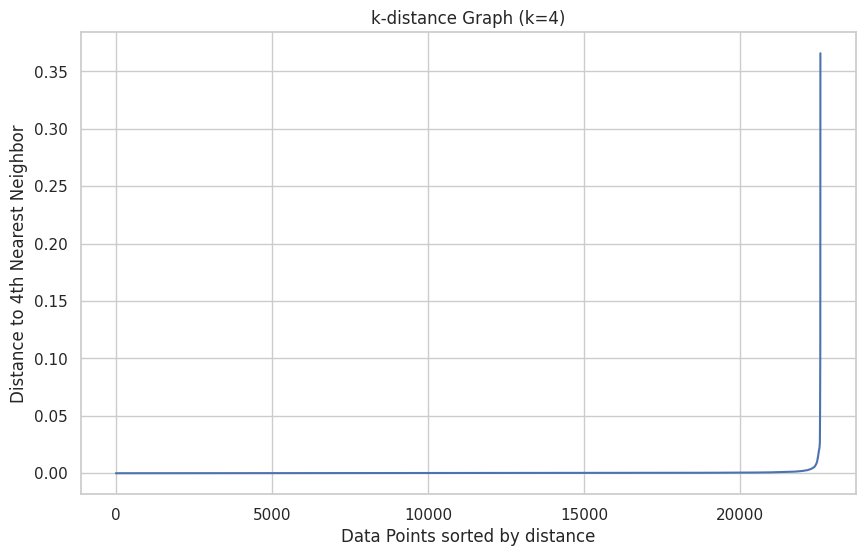

2024-11-15 23:55:15 - Please inspect the k-distance graph and choose an appropriate eps value based on the 'knee' point.


In [ ]:
# Import Necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
import umap
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")

# Helper Function for Timestamped Prints
def print_with_timestamp(message):
    """Prints a message with the current timestamp."""
    current_time = datetime.now().strftime('%Y-%m-%d %H:%M:%S')
    print(f"{current_time} - {message}")

# 1. Load and Preprocess the Data
def load_and_preprocess_data(filepath):
    try:
        print_with_timestamp("Loading data...")
        df = pd.read_csv(filepath)
        print_with_timestamp("Data loaded successfully.")

        # Drop irrelevant columns (modify as per your dataset)
        # Assuming 'Book Title', 'Topic', 'Topic_Label' are non-feature columns
        feature_cols = [col for col in df.columns if col not in ['Book Title', 'Topic', 'Topic_Label']]
        X = df[feature_cols]

        # Handle missing values by filling with zero (modify as needed)
        if X.isnull().sum().sum() > 0:
            print_with_timestamp("Handling missing values by filling with zeros...")
            X = X.fillna(0)

        # Feature Scaling
        print_with_timestamp("Scaling features...")
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        print_with_timestamp("Feature scaling completed.")

        return df, X_scaled
    except Exception as e:
        print_with_timestamp(f"Error in loading and preprocessing data: {e}")
        sys.exit(1)

# 2. Determine Optimal DBSCAN Parameters (eps and min_samples)
def plot_k_distance(X, k):
    print_with_timestamp(f"Creating k-distance graph for k={k}...")
    neighbors = NearestNeighbors(n_neighbors=k)
    neighbors_fit = neighbors.fit(X)
    distances, indices = neighbors_fit.kneighbors(X)
    distances = np.sort(distances[:, k-1], axis=0)
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Data Points sorted by distance')
    plt.ylabel(f'Distance to {k}th Nearest Neighbor')
    plt.title(f'k-distance Graph (k={k})')
    plt.grid(True)
    plt.show()

def determine_dbscan_parameters(X, k=4):
    """
    Determine DBSCAN parameters using the k-distance graph.
    Typically, k = min_samples. Common choice is k=4.
    """
    print_with_timestamp("Determining DBSCAN parameters using k-distance graph...")
    plot_k_distance(X, k)
    print_with_timestamp("Please inspect the k-distance graph and choose an appropriate eps value based on the 'knee' point.")
    # For automation, one might use KneeLocator from kneed, but here we'll ask the user to input
    try:
        eps = float(input("Enter the eps value based on the k-distance graph: "))
        print_with_timestamp(f"Selected eps: {eps}")
    except Exception as e:
        print_with_timestamp(f"Invalid input for eps: {e}")
        sys.exit(1)
    min_samples = k
    print_with_timestamp(f"Using min_samples = {min_samples}")
    return eps, min_samples

# 3. Apply DBSCAN Clustering
def apply_dbscan(X, eps, min_samples):
    print_with_timestamp(f"Applying DBSCAN with eps={eps} and min_samples={min_samples}...")
    dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean', n_jobs=-1)
    labels = dbscan.fit_predict(X)
    num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    num_noise = list(labels).count(-1)
    print_with_timestamp(f"DBSCAN clustering completed. Number of clusters: {num_clusters}, Number of noise points: {num_noise}")
    return labels, dbscan

# 4. Evaluate Clustering Performance
def evaluate_clustering(X, labels):
    print_with_timestamp("Evaluating clustering performance...")
    # Handle cases where all points are in one cluster or all are noise
    if len(set(labels)) <= 1 or (len(set(labels)) == 2 and -1 in labels):
        print_with_timestamp("Silhouette Score cannot be computed with less than 2 clusters.")
        sil_score = None
    else:
        sil_score = silhouette_score(X, labels)
        print_with_timestamp(f"Silhouette Score: {sil_score:.4f}")

    # Davies-Bouldin Index cannot handle noise points labeled as -1
    if len(set(labels)) <= 1 or -1 in labels:
        print_with_timestamp("Davies-Bouldin Index cannot be computed when noise is present or with less than 2 clusters.")
        db_index = None
    else:
        db_index = davies_bouldin_score(X, labels)
        print_with_timestamp(f"Davies-Bouldin Index: {db_index:.4f}")

    return sil_score, db_index

# 5. Visualize the Clusters
def visualize_clusters(df_original, X_numeric, labels, method='UMAP'):
    print_with_timestamp(f"Visualizing clusters using {method}...")
    try:
        if method == 'UMAP':
            reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean', random_state=42)
            embedding = reducer.fit_transform(X_numeric)
            df_original[f'UMAP_1_{method}'] = embedding[:, 0]
            df_original[f'UMAP_2_{method}'] = embedding[:, 1]

            plt.figure(figsize=(12, 8))
            palette = sns.color_palette('viridis', as_cmap=True)
            sns.scatterplot(x=f'UMAP_1_{method}', y=f'UMAP_2_{method}', hue=labels, palette=palette, data=df_original, legend='full', alpha=0.7)
            plt.title(f'UMAP Projection Colored by DBSCAN Clusters')
            plt.legend(title='Cluster')
            plt.show()

        elif method == 't-SNE':
            tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42, n_jobs=-1)
            embedding = tsne.fit_transform(X_numeric)
            df_original[f'tSNE_1_{method}'] = embedding[:, 0]
            df_original[f'tSNE_2_{method}'] = embedding[:, 1]

            plt.figure(figsize=(12, 8))
            palette = sns.color_palette('viridis', as_cmap=True)
            sns.scatterplot(x=f'tSNE_1_{method}', y=f'tSNE_2_{method}', hue=labels, palette=palette, data=df_original, legend='full', alpha=0.7)
            plt.title(f't-SNE Projection Colored by DBSCAN Clusters')
            plt.legend(title='Cluster')
            plt.show()

        else:
            print_with_timestamp("Unsupported visualization method.")
    except Exception as e:
        print_with_timestamp(f"Error in visualization: {e}")

# 6. Save the Clustered Data
def save_clustered_data(df, labels, output_path):
    try:
        print_with_timestamp("Assigning cluster labels to the DataFrame...")
        df['DBSCAN_Cluster'] = labels
        print_with_timestamp("Saving clustered data to CSV...")
        df.to_csv(output_path, index=False)
        print_with_timestamp(f"Clustered data saved to {output_path}")
    except Exception as e:
        print_with_timestamp(f"Error in saving data: {e}")

# Main Function to Execute the Pipeline
def main():
    # Define File Paths
    input_filepath = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_all_topics.csv'
    output_filepath = '/content/drive/MyDrive/BERTTopic_Models/paraphrase-MiniLM-L6-v2/results/all_books_clustered_DBSCAN.csv'

    # Step 1: Load and Preprocess Data
    df_original, X_scaled = load_and_preprocess_data(input_filepath)

    # Step 2: Determine DBSCAN Parameters
    # Common choice for min_samples is k=4
    eps, min_samples = determine_dbscan_parameters(X_scaled, k=4)

    # Step 3: Apply DBSCAN Clustering
    labels, dbscan_model = apply_dbscan(X_scaled, eps, min_samples)

    # Step 4: Evaluate Clustering Performance
    sil_score, db_index = evaluate_clustering(X_scaled, labels)

    # Step 5: Visualize Clusters
    # For visualization, use the original DataFrame's numerical features
    visualize_clusters(df_original.copy(), X_scaled, labels, method='UMAP')
    visualize_clusters(df_original.copy(), X_scaled, labels, method='t-SNE')

    # Step 6: Assign Cluster Labels and Save
    save_clustered_data(df_original, labels, output_filepath)

# Execute the Main Function
if __name__ == "__main__":
    main()

# Use Existing Sentence-Level BERTopic Model to Infer Book-Level Topics